# Мартьянова Александра Евгеньевна, курс «Data Science», ВКР

# Часть 1. Статистические модели

### Загрузка библиотек

In [1]:
# Загрузка разных библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statistics
from scipy.stats import f_oneway

### 1. Подготовка и предобработка данных

Исходный датасет по композитам

###### Датасет со свойствами композитов. Объединение по индексу, тип объединения INNER

In [2]:
# Загрузка в объект DataFrame файла X_bp.xlsx, метод read_excel
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [3]:
# Определение количества строк и столбцов объекта, метод shape
x_bp.shape

(1023, 10)

In [4]:
# Вывод сведений об объекте DataFrame, метод info()
x_bp.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [5]:
# Загрузка в объект DataFrame файла X_nup.xlsx, метод read_excel
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


In [6]:
# Определение количества строк и столбцов объекта, метод shape
x_nup.shape

(1040, 3)

In [7]:
# Вывод сведений об объекте DataFrame, метод info()
x_nup.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1040 entries, 0.0 to 1039.0
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   float64
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(3)
memory usage: 32.5 KB


In [8]:
# соединение объектов DataFrame, метод merge, объединение по индексу, тип объединения INNER
df_s = x_bp.merge(x_nup, how = 'inner', left_index = True, right_index = True)
df_s.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [9]:
# Вывод сведений о новом объекте DataFrame df_s, метод info()
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки

Вывод: соединение произведено по индексам, и часть данных была отброшена при соединении датасетов в общий новый датасет. Тип данных во всех колонках - float64.

In [10]:
# Изменение типа данных индекса, метод astype('int')
df_s.index = df_s.index.astype('int')
df_s

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


Вывод: индексы - целые числа

In [11]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(df_s.isnull().sum())
print()
print(df_s.isna().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град  

Вывод: пропуски в датасете отсутствуют

In [12]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
df_s.duplicated().sum()

0

Вывод: дубликаты в датасете отсутствуют

ПРЕДВАРИТЕЛЬНОЕ ЗАКЛЮЧЕНИЕ ПО ДАТАСЕТУ: датасет качественный: пропуски и дубликаты в датасете отсутствуют, вероятно он подвергался какой-то обработке заранее. 


Датасет представляет собой результаты испытаний на растяжение композитных материалов, тем не менее, данные, которые относятся к результатам замера геометрических параметров образцов, в нем отсутствуют. Восполним этот пробел и создадим соответствующие столбцы:

In [13]:
# Относительное удлинение при растяжении без нормирования 
df_s['Относительное удлинение при растяжении'] = df_s['Прочность при растяжении, МПа'] / df_s['Модуль упругости при растяжении, ГПа']

In [14]:
# относительное удлиненее без нормирования
df_s['Относительное удлинение'] = df_s['Прочность при растяжении, МПа'] / df_s['модуль упругости, ГПа']

In [15]:
df_s

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000,42.857143,4.060986
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000,42.857143,4.060986
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000,42.857143,4.060986
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000,42.857143,4.060986
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000,42.857143,3.984064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770,32.661939,2.615192
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790,32.369254,5.307442
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684,35.631624,6.388370
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074,27.980012,2.794045


In [16]:
# Определение количества строк и столбцов датасета df_s, метод shape
df_s.shape

(1023, 15)

In [17]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
df_s.nunique()

Соотношение матрица-наполнитель           1014
Плотность, кг/м3                          1013
модуль упругости, ГПа                     1020
Количество отвердителя, м.%               1005
Содержание эпоксидных групп,%_2           1004
Температура вспышки, С_2                  1003
Поверхностная плотность, г/м2             1004
Модуль упругости при растяжении, ГПа      1004
Прочность при растяжении, МПа             1004
Потребление смолы, г/м2                   1003
Угол нашивки, град                           2
Шаг нашивки                                989
Плотность нашивки                          988
Относительное удлинение при растяжении    1004
Относительное удлинение                   1020
dtype: int64

Вывод: в колонке 'Угол нашивки, град' всего два значения, в остальных столбцах гораздо больше, например в столбце 'модуль упругости, ГПа' таковых 1020 из 1023

In [18]:
# Определение уникальных значений в столбце 'Угол нашивки, град', метод unique()
df_s['Угол нашивки, град'].unique()

array([ 0., 90.])

Вывод: категориальный параметр 'Угол нашивки, град' имеет всего два уровня, может рассматриваться как порядковый и для дальнейшей обработки подвергается ранжированию

In [19]:
# Подсчет количества строк по уникальным значениям столбца 'Угол нашивки, град', метод count()
df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count()

520

In [20]:
print('count, 0 degeree: ', df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count())
print('count, 90 degeree: ', df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 90.0].count())
print('count, 90 degeree, проверка: ', df_s.shape[0] - df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count())

count, 0 degeree:  520
count, 90 degeree:  503
count, 90 degeree, проверка:  503


In [21]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('float64')

In [22]:
#  Ранжирование переменной 'Угол нашивки, град' и изменение типа данных, метод astype('int')
df_s = df_s.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df_s['Угол нашивки, град'] = df_s['Угол нашивки, град'].astype(int)

In [23]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('int32')

In [24]:
# Описательная статистика датасета df_s, метод describe()
df_s.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929,33.704329,7.427613
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969,6.793861,41.155005
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000,13.098005,0.881994
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212,29.076471,2.485563
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920,33.602706,3.418615
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961,37.990668,4.876902
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901,55.351970,1090.580554


###### Построение графиков рассеяния и распределения переменных, а также графиков "ящики с усами"

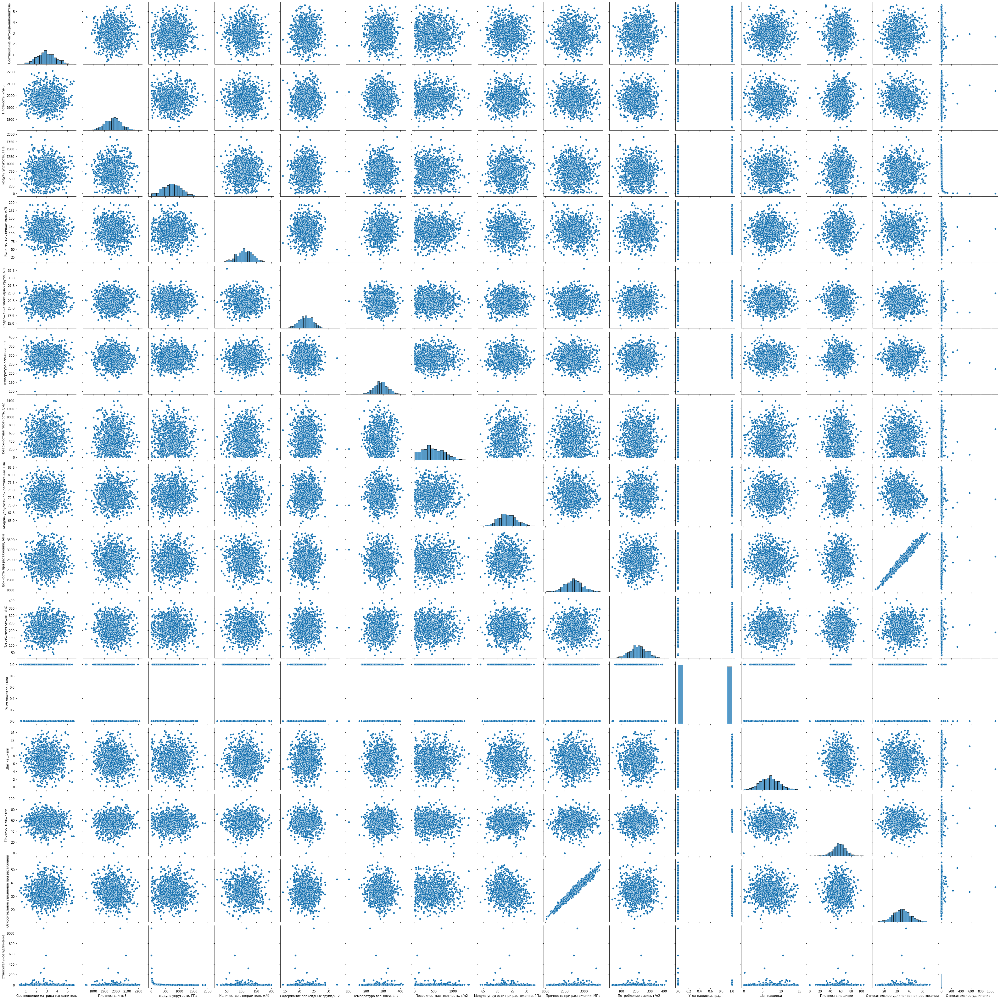

In [25]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(df_s, height=3)

Вывод: попарные графики рассеяния в целом не показывают какой-либо зависимости между параметрами, имеют вид случайных данных с нормальным распределением, кроме данных столбца 'Угол нашивки', который является категориальной переменной и имеет два ранжированных уровня: 0 и 1, а также столбцов 'Относительное удлинение при растяжении' и 'Относительное удлинение'. Столбец 'Относительное удлинение при растяжении' показывает линейную связь со столбцом 'Прочность при растяжении, МПа'

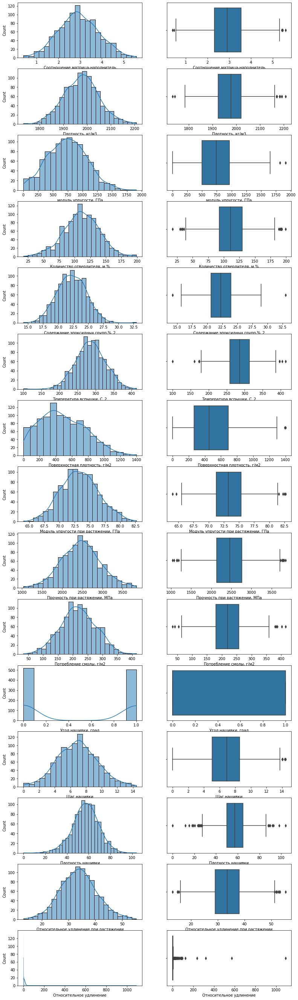

In [26]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(15, 2, figsize=(13, 48))
for k, column in enumerate(df_s.columns):    
    sns.histplot(data=df_s, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=df_s, x=column, ax=axes[k, 1])
plt.show()

Вывод: на первый взгляд, судя по графикам распределения переменных параметров близки к нормальным, кроме 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Угол нашивки' и 'Относительное удлинение'. Судя по графикам рассеяния и графикам "ящики с усами", имеются выбросы.

Требуется дополнительно оценить нормальность распределения параметров по статистическому критерию.

Требуется оценить также корреляцию параметров между собой, а для параметров, имеющих статистически значимую корреляцию, выполнить построение модели статистической регрессии и оценить ее статистическую адекватность.

Требуется произвести сравнение двух групп данных по столбцу 'Угол нашивки' для оценки влияния этого категориального параметра на  количественные параметры датасета.

Требуется очистить данные от выбросов.

###### Создание датасета с исключенным категориальным параметром

In [27]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Параметр 'Угол нашивки' - категориальный, поэтому требуется его исключение при оценке нормальности распределения и для построения матрицы корреляции по критерию Пирсона

In [28]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
df_d=df_s[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки', 'Относительное удлинение при растяжении', 'Относительное удлинение']]
df_d.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,4.0,57.0,42.857143,4.060986
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,4.0,60.0,42.857143,4.060986
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,4.0,70.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,57.0,42.857143,3.984064


In [29]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
df_d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Вывод: столбец 'Угол нашивки, град' в датасете df_d отсутствует

### 2. Оценка нормальности распределения параметров

In [30]:
# Описательная статистика датасета df_d, метод describe()
df_d.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,6.899222,57.153929,33.704329,7.427613
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,2.563467,12.350969,6.793861,41.155005
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,13.098005,0.881994
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,5.080033,49.799212,29.076471,2.485563
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,6.916144,57.341920,33.602706,3.418615
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,8.586293,64.944961,37.990668,4.876902
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,14.440522,103.988901,55.351970,1090.580554


In [31]:
# Описательная статистика датасета df_d, метод describe() библиотеки scipy.stats
stats.describe(df_d)

DescribeResult(nobs=1023, minmax=(array([3.89402605e-01, 1.73176464e+03, 2.43690875e+00, 1.77402746e+01,
       1.42549855e+01, 1.00000000e+02, 6.03739925e-01, 6.40540606e+01,
       1.03685661e+03, 3.38030255e+01, 0.00000000e+00, 0.00000000e+00,
       1.30980051e+01, 8.81993807e-01]), array([   5.5917416 , 2207.77348061, 1911.536477  ,  198.95320719,
         33.        ,  413.27341824, 1399.54236234,   82.68205104,
       3848.43673188,  414.59062836,   14.44052188,  103.9889013 ,
         55.35197013, 1090.58055367])), mean=array([   2.93036577, 1975.73488811,  739.92323276,  110.57076865,
         22.24438955,  285.88215135,  482.73183304,   73.32857125,
       2466.9228427 ,  218.42314368,    6.89922208,   57.15392943,
         33.70432942,    7.42761261]), variance=array([8.33974853e-01, 5.43599944e+03, 1.09052897e+05, 8.00658596e+02,
       5.79028591e+00, 1.67635054e+03, 7.91379549e+04, 9.72805426e+00,
       2.35834560e+05, 3.56838144e+03, 6.57136343e+00, 1.52546430e+02,
    

In [32]:
# Описательная статистика в упорядоченном виде по столбцам датасета df_d
for col in df_d.columns:
    med = statistics.median(df_d[col])
    mean = statistics.mean(df_d[col])
    mod = statistics.mode(df_d[col])
    std = statistics.stdev(df_d[col])
    var = statistics.variance(df_d[col])
    skew = stats.skew(df_d[col])
    kurt = stats.kurtosis(df_d[col])
    max_ = (df_d[col]).max()
    min_ = (df_d[col]).min()
    scope = (df_d[col]).max() - (df_d[col]).min()
    confidence = stats.norm.interval(alpha=0.95, loc=np.mean(df_d[col]), scale=stats.sem(df_d[col]))
    print('\n \t', col, ': \t \n'   'Среднее: ', mean, '\t' 'Медиана: ', med, '\t' 'Мода : ', mod, 
          '\n' 'Стандарт : ', std, '\t' 'Дисперсия: ', var, 
          '\n' 'Асимметрия: ', skew, '\t' 'Эксцесс: ', kurt, 
          '\n' 'Минимум: ', min_, '\t' 'Максимум: ', max_, '\t' 'Размах: ', scope, 
          '\n' 'ДоверитИнтервалСредн: ', confidence) 



 	 Соотношение матрица-наполнитель : 	 
Среднее:  2.9303657734325483 	Медиана:  2.90687765033521 	Мода :  1.85714285714285 
Стандарт :  0.9132222362148388 	Дисперсия:  0.8339748527172307 
Асимметрия:  0.08215047390733503 	Эксцесс:  -0.20422037310846086 
Минимум:  0.389402605178414 	Максимум:  5.59174159869754 	Размах:  5.202338993519127 
ДоверитИнтервалСредн:  (2.8744046078183585, 2.9863269390467426)

 	 Плотность, кг/м3 : 	 
Среднее:  1975.7348881101545 	Медиана:  1977.62165679058 	Мода :  2030.0 
Стандарт :  73.72923055065388 	Дисперсия:  5435.999437591473 
Асимметрия:  0.05854323312878896 	Эксцесс:  0.05745882123102097 
Минимум:  1731.764635096 	Максимум:  2207.77348061119 	Размах:  476.00884551518993 
ДоверитИнтервалСредн:  (1971.2168491073446, 1980.252927112965)

 	 модуль упругости, ГПа : 	 
Среднее:  739.9232327560723 	Медиана:  739.664327697792 	Мода :  738.736842105263 
Стандарт :  330.23158056102693 	Дисперсия:  109052.89679983404 
Асимметрия:  0.11999727729086174 	Эксцесс: 

Вывод: по всем столбцам, кроме 'Относительное удлинение', средние значения укладываются в доверительные интервалы для средних, мода смещена для некоторых параметров, стандартное отклонение имеет порядок ниже размаха, асимметрия и эксцесс близки к нормальным (близки к 0). Распределение параметров, кроме вышеуказанных имеет статистические оценки близкие к нормальным.

ПРИМЕЧАНИЕ: оценка эксцесса scipy.stats.kurtosis рассчитывается по формуле, из которой вычитается 3, чтобы упростить сравнение с нормальным распределением

Тест д'Агостино (по имени Ralph D’Agostino) вычисляет итоговую статистику на основе распределения( эксцесс и асимметрия), чтобы определить, отклоняется ли рассматриваемое распределение данных от нормального, задан уровень значимости 0,05.

Параметр 'Угол нашивки, град' изначально не имеет нормального распределения, поэтому по нему не рассчитывается тест д'Агостино.

Оценка нормальности распределения параметров по статистическому критерию д'Агостино:

In [33]:
# Проверка по критерию д'Агостино
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.normaltest(df_d[col]) # Критерий согласия д'Агостино
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=3.084, p-value=0.214
Плотность, кг/м3 : 	 	 	Statistics=0.824, p-value=0.662
модуль упругости, ГПа : 	 	 	Statistics=4.556, p-value=0.103
Количество отвердителя, м.% : 	 	 	Statistics=2.223, p-value=0.329
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.629, p-value=0.730
Температура вспышки, С_2 : 	 	 	Statistics=2.018, p-value=0.365
Поверхностная плотность, г/м2 : 	 	 	Statistics=38.511, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=3.946, p-value=0.139
Прочность при растяжении, МПа : 	 	 	Statistics=1.109, p-value=0.574
Потребление смолы, г/м2 : 	 	 	Statistics=0.645, p-value=0.724
Шаг нашивки : 	 	 	Statistics=1.785, p-value=0.410
Плотность нашивки : 	 	 	Statistics=25.992, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=2.450, p-value=0.294
Относительное удлинение : 	 	 	Statistics=2367.429, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матр

Вывод: по тесту по д'Агостино параметры 'Поверхностная плотность, г/м2', 'Плотность нашивки' и 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05)

Критерий Шапиро-Уилка применяется для выборок до 5000 наблюдений, поэтому может быть применен и здесь

In [34]:
# Количество наблюдений, метод shape
df_d.shape[0]

1023

Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [35]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.998, p-value=0.277
Плотность, кг/м3 : 	 	 	Statistics=0.999, p-value=0.549
модуль упругости, ГПа : 	 	 	Statistics=0.996, p-value=0.007
Количество отвердителя, м.% : 	 	 	Statistics=0.998, p-value=0.209
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.265
Температура вспышки, С_2 : 	 	 	Statistics=0.998, p-value=0.283
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.998, p-value=0.174
Прочность при растяжении, МПа : 	 	 	Statistics=0.998, p-value=0.221
Потребление смолы, г/м2 : 	 	 	Statistics=0.999, p-value=0.709
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.176
Плотность нашивки : 	 	 	Statistics=0.993, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.998, p-value=0.373
Относительное удлинение : 	 	 	Statistics=0.078, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Вывод: по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05).

Критерий  Шапиро-Уилка является более чувствительным, чем критерий д'Агостино, и показал, что параметр 'модуль упругости, ГПа' не подчиняется нормальному распределению, так же, как и параметры 'Поверхностная плотность' и 'Плотность нашивки'

### 3. Оценка корреляции параметров

Корреляция для количественных параметров и количественно-категориальных оценивается по критериям Пирсона и Спирмена соответственно

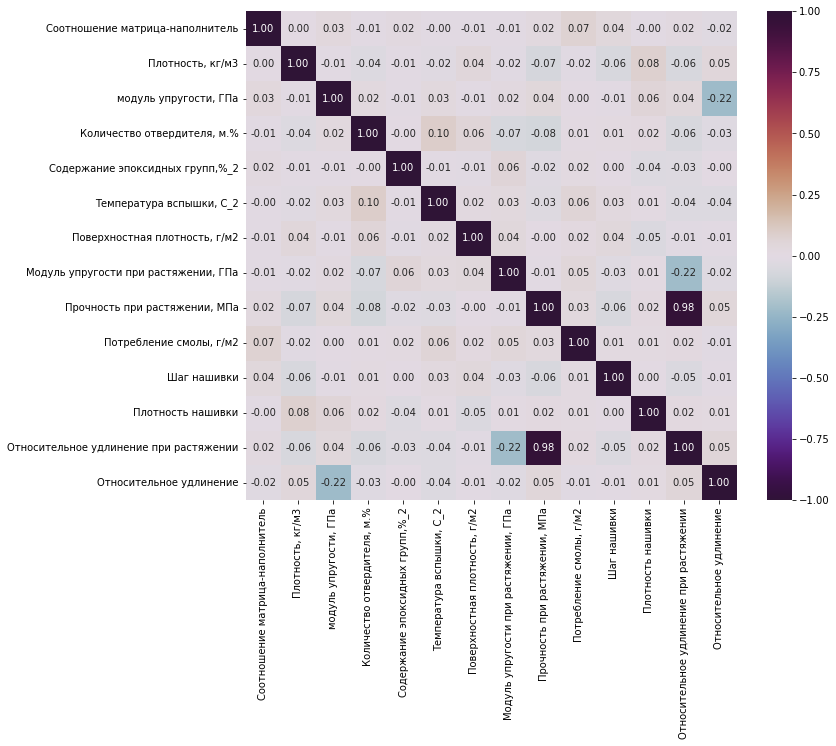

In [36]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Вывод: судя по матрице корреляции, построенной на основании корреляции по Пирсону для количественных данных, коэффициенты корреляции малы, кроме параметров 'Относительное удлинение при растяжении', 'Относительное удлинение', 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа'  (они детерминированные), поэтому следует сформулировать и проверить статистическую гипотезу для проверки значимости попарной связи между всеми количественными параметрами.

In [37]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
df_d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Проверка корреляции по критерию Пирсона:

формулировка гипотезы:

H0: R = 0,

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [38]:
# Проверка по критерию Пирсона
count = 0 
for col in df_d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_d[col], df_d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.073, p-value=0.020





2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.025



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 
Statistics=-0.062, p-value=0.046


3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.223, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.095, p-value=0.002


Наименование колонок и строк С 

Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000             

Учитывая, что присутствует порядковый ранжированный параметр 'Угол нашивки', следует проверить статистическую значимость попарных корреляций этого параметра с остальными параметрами по критерию Спирмена:

In [39]:
# ранговая корреляция Спирмена с учетом того, что присутствует категориальный параметр 'Угол нашивки'
df_s.corr(method='spearman')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
Соотношение матрица-наполнитель,1.000000,-0.005542,0.031823,0.002496,0.016358,-0.013635,-0.003896,-0.006459,0.017554,0.054084,-0.026190,0.032510,0.004570,0.015541,-0.016903
"Плотность, кг/м3",-0.005542,1.000000,-0.010097,-0.032907,-0.012287,-0.030447,0.055071,-0.032446,-0.069816,-0.025729,-0.063073,-0.045941,0.080001,-0.060979,-0.005448
"модуль упругости, ГПа",0.031823,-0.010097,1.000000,0.033397,0.002016,0.031247,-0.001318,0.007705,0.033750,0.008010,-0.038800,-0.011851,0.072628,0.030159,-0.911262
"Количество отвердителя, м.%",0.002496,-0.032907,0.033397,1.000000,-0.001652,0.086970,0.050751,-0.064127,-0.067707,-0.006371,0.030222,0.008440,0.025265,-0.057493,-0.056531
"Содержание эпоксидных групп,%_2",0.016358,-0.012287,0.002016,-0.001652,1.000000,-0.003641,-0.011232,0.061930,-0.019193,0.014230,0.005714,-0.007421,-0.032182,-0.033359,-0.013232
"Температура вспышки, С_2",-0.013635,-0.030447,0.031247,0.086970,-0.003641,1.000000,0.025441,0.024625,-0.028283,0.051763,0.021886,0.043075,0.008160,-0.034829,-0.030066
"Поверхностная плотность, г/м2",-0.003896,0.055071,-0.001318,0.050751,-0.011232,0.025441,1.000000,0.035319,-0.008221,-0.005344,0.055637,0.037675,-0.032404,-0.016527,-0.002281
"Модуль упругости при растяжении, ГПа",-0.006459,-0.032446,0.007705,-0.064127,0.061930,0.024625,0.035319,1.000000,-0.009970,0.052450,0.027458,-0.014210,-0.003225,-0.215380,-0.018945
"Прочность при растяжении, МПа",0.017554,-0.069816,0.033750,-0.067707,-0.019193,-0.028283,-0.008221,-0.009970,1.000000,0.020831,0.025226,-0.071915,0.014950,0.973655,0.331721
"Потребление смолы, г/м2",0.054084,-0.025729,0.008010,-0.006371,0.014230,0.051763,-0.005344,0.052450,0.020831,1.000000,-0.002940,0.009288,0.016236,0.006211,0.006243


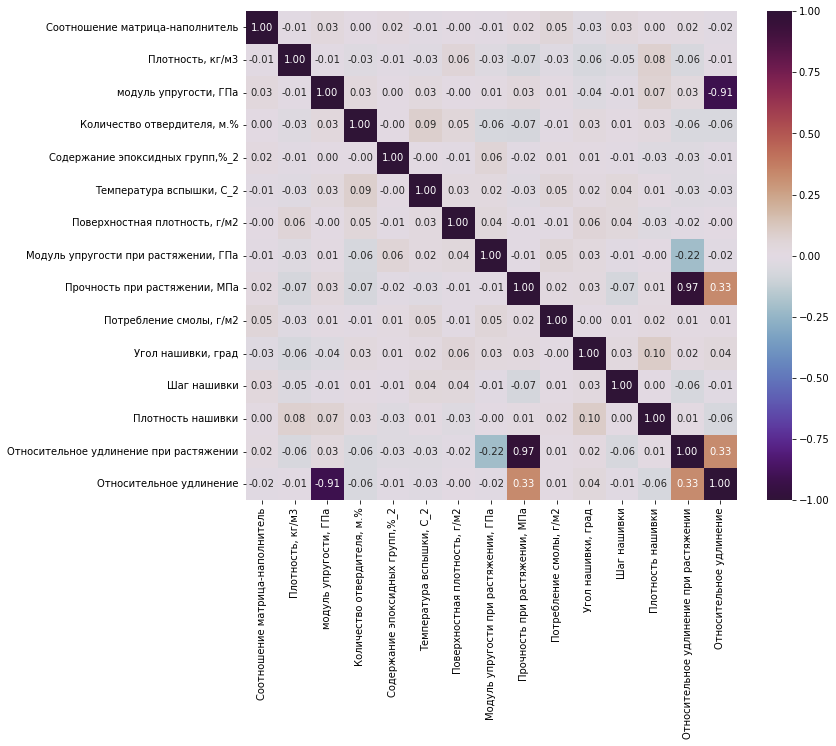

In [40]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(df_s.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

Вывод: судя по матрице корреляции, построенной на основании корреляции по Спирмену для количественных и качественных данных, коэффициенты корреляцим малы, кроме параметров 'Относительное удлинение при растяжении', 'Относительное удлинение', 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа'  (они связаны детерминированные), поэтому следует сформулировать и проверить статистическую гипотезу для проверки значимости попарной связи между категориальным параметром 'Угол нашивки, град' и остальными параметрами.

In [41]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Проверка корреляции по критерию Спирмена:

формулировка гипотезы: 

H0: R = 0, 

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [42]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(df_s['Угол нашивки, град'] , df_s[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.026, p-value=0.403
Плотность, кг/м3 : 	 	 	Statistics=-0.063, p-value=0.044
модуль упругости, ГПа : 	 	 	Statistics=-0.039, p-value=0.215
Количество отвердителя, м.% : 	 	 	Statistics=0.030, p-value=0.334
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.006, p-value=0.855
Температура вспышки, С_2 : 	 	 	Statistics=0.022, p-value=0.484
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.056, p-value=0.075
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.027, p-value=0.380
Прочность при растяжении, МПа : 	 	 	Statistics=0.025, p-value=0.420
Потребление смолы, г/м2 : 	 	 	Statistics=-0.003, p-value=0.925
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.026, p-value=0.408
Плотность нашивки : 	 	 	Statistics=0.101, p-value=0.001
Относительное удлинение при растяжении : 	 	 	Statistics=0.019, p-value=0.553
Относительное удлинение : 	 	 	Statistics=0.037, p-value=0.243

Наименование колонок,

Вывод: существует статистически значимая попарная корреляционная связь по критерию Спирмена между параметрами: 'Угол нашивки, град' и 'Плотность, кг/м3', а также 'Угол нашивки, град' и 'Плотность нашивки'.

Ранее было показано, что по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, поэтому корреляцию этих параметров между собой и с остальными параметрами следует проверять по критерию Спирмена:

In [43]:
# Проверка по критерию Спирмена
count = 0 
for col in df_s.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_s.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_s[col], df_s[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель















2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.026


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=-0.063, p-value=0.044


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010



3
модуль упругости, ГПа










Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.073, p-value=0.020


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.911, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.087, p-value=0.005


Наименование колонок и строк С корреляцией: 
Количество отвердит

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.020
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.911, p-value=0.000
    Угол нашивки, град  &  Плотность нашивки : Statistics=0.101, p-value=0.001
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.332, p-value=0.000
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.063, p-value=0.043
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.327, p-value=0.000

### 4. Статистическое сравнение 2-х групп (углы нашивки 0 и 90 град)

In [44]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Непараметрический критерий Манна-Уитни сравнения двух групп применяется для малых выборок (n < 30)

Статистическое сравнение 2х групп (углы нашивки, ранги 0 и 1) возможно осуществить по непараметрическому критерию Колмогорова-Смирнова. 

Формулировка гипотезы по непараметрическому критерию Колмогорова-Смирнова:

H0: Статистически значимые отличия в группах отсутствуют (уровень значимости равен 0,05).

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости.

In [45]:
# проверка по критерию Коломогорова-Смирнова для одной выборки
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    df1=np.array(df_s[df_s['Угол нашивки, град'] == 0][col].dropna())
    df2=np.array(df_s[df_s['Угол нашивки, град'] == 1][col].dropna())
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.045, p-value=0.668
Плотность, кг/м3 : 	 	 	Statistics=0.076, p-value=0.100
модуль упругости, ГПа : 	 	 	Statistics=0.091, p-value=0.027
Количество отвердителя, м.% : 	 	 	Statistics=0.058, p-value=0.348
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.029, p-value=0.976
Температура вспышки, С_2 : 	 	 	Statistics=0.046, p-value=0.621
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.082, p-value=0.060
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.071, p-value=0.142
Прочность при растяжении, МПа : 	 	 	Statistics=0.049, p-value=0.548
Потребление смолы, г/м2 : 	 	 	Statistics=0.038, p-value=0.839
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.064, p-value=0.230
Плотность нашивки : 	 	 	Statistics=0.212, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.046, p-value=0.615
Относительное удлинение : 	 	 	Statistics=0.054, p-value=0.414

Наименование колонок, для

Вывод: непараметрический критерий Колмогорова-Смирнова сравнения двух групп из одной выборки для порядковых ранговых переменных (углы нашивки имеют ранги 0 и 1), 'Угол нашивки, град' показывает, что не отвергается статистически значимое различие двух групп по углам нашивки для параметров 'модуль упругости, ГПа' и 'Плотность нашивки'.

In [46]:
# проверка по критерию Коломогорова-Смирнова для двух выборок
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    df1=np.array(df_s[df_s['Угол нашивки, град'] == 0][col].dropna())
    df2=np.array(df_s[df_s['Угол нашивки, град'] == 1][col].dropna())
    stat, p = stats.ks_2samp(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.045, p-value=0.668
Плотность, кг/м3 : 	 	 	Statistics=0.076, p-value=0.100
модуль упругости, ГПа : 	 	 	Statistics=0.091, p-value=0.027
Количество отвердителя, м.% : 	 	 	Statistics=0.058, p-value=0.348
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.029, p-value=0.976
Температура вспышки, С_2 : 	 	 	Statistics=0.046, p-value=0.621
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.082, p-value=0.060
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.071, p-value=0.142
Прочность при растяжении, МПа : 	 	 	Statistics=0.049, p-value=0.548
Потребление смолы, г/м2 : 	 	 	Statistics=0.038, p-value=0.839
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.064, p-value=0.230
Плотность нашивки : 	 	 	Statistics=0.212, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.046, p-value=0.615
Относительное удлинение : 	 	 	Statistics=0.054, p-value=0.414

Наименование колонок, для

Вывод: критерий Колмогорова-Смирнова сравнения двух групп из двух выборок для категориальных ранговых переменных (углы нашивки имеют ранги 0 и 1), 'Угол нашивки, град' показывает, что не отвергается статистически значимое различие двух групп по углам нашивки для параметров 'модуль упругости, ГПа' и 'Плотность нашивки'.

Подсчет средних значений по вышеуказанным параметрам:

In [47]:
# 'модуль упругости, ГПа' по двум группам
groups_E= df_s.groupby(['Угол нашивки, град'])['модуль упругости, ГПа'].mean()
groups_E

Угол нашивки, град
0    748.17435
1    731.39325
Name: модуль упругости, ГПа, dtype: float64

In [48]:
# 'Плотность нашивки' по двум группам
groups_P= df_s.groupby(['Угол нашивки, град'])['Плотность нашивки'].mean()
groups_P

Угол нашивки, град
0    55.843291
1    58.508864
Name: Плотность нашивки, dtype: float64

Следует выполнить однофакторный анализ для оценки различия средних по двум группам угла нашивки (углы нашивки с рангами 0 и 1)

In [49]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
df_s.nunique()

Соотношение матрица-наполнитель           1014
Плотность, кг/м3                          1013
модуль упругости, ГПа                     1020
Количество отвердителя, м.%               1005
Содержание эпоксидных групп,%_2           1004
Температура вспышки, С_2                  1003
Поверхностная плотность, г/м2             1004
Модуль упругости при растяжении, ГПа      1004
Прочность при растяжении, МПа             1004
Потребление смолы, г/м2                   1003
Угол нашивки, град                           2
Шаг нашивки                                989
Плотность нашивки                          988
Относительное удлинение при растяжении    1004
Относительное удлинение                   1020
dtype: int64

In [50]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

In [51]:
# Определение уникальных значений в столбце 'Угол нашивки, град' датасета df_s, метод unique()
df_s['Угол нашивки, град'].unique()

array([0, 1])

In [52]:
# Тип данных столбца 'Угол нашивки' датасета df_s, метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('int32')

In [53]:
# Определение типа данных столбца 'Угол нашивки, град' датасета df_s, метод type() библиотеки numpy
type(df_s['Угол нашивки, град'][0])

numpy.int32

Тест:

In [54]:
# Создание групп по качественному параметру 'Угол нашивки, град' для проверки равенства 
# средних параметра 'Модуль упругости при растяжении, ГПа' по этим двум группам
group1 = df_s[df_s['Угол нашивки, град'] == 0]['Модуль упругости при растяжении, ГПа']
group2 = df_s[df_s['Угол нашивки, град'] == 1]['Модуль упругости при растяжении, ГПа']

In [55]:
# Тест функции f_oneway библиотеки scipy.stats
f_oneway(group1, group2)

F_onewayResult(statistic=0.5405592920742476, pvalue=0.4623698756783441)

Однофакторный дисперсионный анализ использует следующие нулевую и альтернативную гипотезы :

    H 0 (нулевая гипотеза): µ 1 = µ 2 = µ 3 = … = µ k (все средние значения совокупности равны)
    H 1 (нулевая гипотеза): по крайней мере одно среднее значение популяции отличаетсяот остальных


Чтобы результаты однофакторного дисперсионного анализа были достоверными, должны выполняться следующие допущения:
1. Нормальность. Каждая выборка была взята из нормально распределенной популяции.
2. Равные дисперсии — дисперсии совокупностей, из которых взяты выборки, равны. Вы можете использовать тест Бартлетта, чтобы проверить это предположение.
3. Независимость.Наблюдения в каждой группе независимы друг от друга, а наблюдения внутри групп были получены путем случайной выборки.    


Тест Бартлетта использует следующие нулевые и альтернативные гипотезы :

H 0 : Дисперсия среди каждой группы равна.

H 1 : По крайней мере, одна группа имеет дисперсию, не равную остальным.

In [56]:
# Проверка по критериям ANOVA & Baltlet-test
for col in df_s.columns[:10]:
    alpha = 0.05
    group1 = df_s[df_s['Угол нашивки, град'] == 0][col]
    group2 = df_s[df_s['Угол нашивки, град'] == 1][col]
    stat1, bart_test = stats.bartlett(group1, group2)
    stat2, fish_test = f_oneway(group1, group2)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))
for col in df_s.columns[11:]:
    alpha = 0.05
    group1 = df_s[df_s['Угол нашивки, град'] == 0][col]
    group2 = df_s[df_s['Угол нашивки, град'] == 1][col]
    stat1, bart_test = stats.bartlett(group1, group2)
    stat2, fish_test = f_oneway(group1, group2)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))


Соотношение матрица-наполнитель : 	 	 	Statistics Bartlet=1.357, p-value=0.244
Соотношение матрица-наполнитель : 	 	 	Statistics F-test=0.987, p-value=0.321
Плотность, кг/м3 : 	 	 	Statistics Bartlet=0.172, p-value=0.678
Плотность, кг/м3 : 	 	 	Statistics F-test=4.810, p-value=0.029
модуль упругости, ГПа : 	 	 	Statistics Bartlet=0.303, p-value=0.582
модуль упругости, ГПа : 	 	 	Statistics F-test=0.660, p-value=0.417
Количество отвердителя, м.% : 	 	 	Statistics Bartlet=0.094, p-value=0.759
Количество отвердителя, м.% : 	 	 	Statistics F-test=1.521, p-value=0.218
Содержание эпоксидных групп,%_2 : 	 	 	Statistics Bartlet=0.025, p-value=0.875
Содержание эпоксидных групп,%_2 : 	 	 	Statistics F-test=0.066, p-value=0.797
Температура вспышки, С_2 : 	 	 	Statistics Bartlet=0.219, p-value=0.640
Температура вспышки, С_2 : 	 	 	Statistics F-test=0.437, p-value=0.509
Поверхностная плотность, г/м2 : 	 	 	Statistics Bartlet=0.125, p-value=0.724
Поверхностная плотность, г/м2 : 	 	 	Statistics F-tes

Вывод: различаются средние для 'Плотность, кг/м3', 'Плотность нашивки'. Но Bartlet-test для 'Плотность нашивки' показывает, что группы имеют не равные дисперсии для плотности нашивки, поэтому F-test не может быть применен для 'Плотность нашивки'

Вывод: создается впечатление малого влияния категориального параметра 'Угол нашивки, град' на датасет в целом

###### Очистка данных от выбросов: 

In [57]:
# Вывод сведений о датасете df_s, метод info()
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         1023 non-null   float64
 1   Плотность, кг/м3                        1023 non-null   float64
 2   модуль упругости, ГПа                   1023 non-null   float64
 3   Количество отвердителя, м.%             1023 non-null   float64
 4   Содержание эпоксидных групп,%_2         1023 non-null   float64
 5   Температура вспышки, С_2                1023 non-null   float64
 6   Поверхностная плотность, г/м2           1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа    1023 non-null   float64
 8   Прочность при растяжении, МПа           1023 non-null   float64
 9   Потребление смолы, г/м2                 1023 non-null   float64
 10  Угол нашивки, град                      1023 non-null   int3

Вывод: датасет качественный, очистка данных от выбросов на данном этапе анализа не осуществляется с целью максимального сохранения исходных данных

### 5. Построение моделей статистической регрессии

In [58]:
# Загрузка библиотек sklearn для проведения регрессионного анализа
import sklearn.linear_model as lm
import statsmodels.formula.api as smf

###### Предварительное рассмотрение парной регрессионной модели

Выше было установлено, что статистически значимыми по критерию Пирсона являются следующие попарные корреляции между количественными параметрами:


    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
   
        
Статистически значимой является также попарная корреляционная связь по критерию Спирмена между количественными и ранговым параметрами: 'Угол нашивки, град' и 'Плотность, кг/м3', 'Угол нашивки, град' и 'Плотность нашивки'.

Ниже следует рассмотреть модели статистической регрессии для 'Модуль упругости при растяжении, ГПа' от 'Количество отвердителя, м.%', 'Прочность при растяжении, МПа' от 'Количество отвердителя, м.%' и 'Прочность при растяжении, МПа' от ' Плотность, кг/м3'

- Следует рассмотреть взаимосвязь двух числовых переменных - 'Модуль упругости при растяжении, ГПа','Количество отвердителя, м.%' 

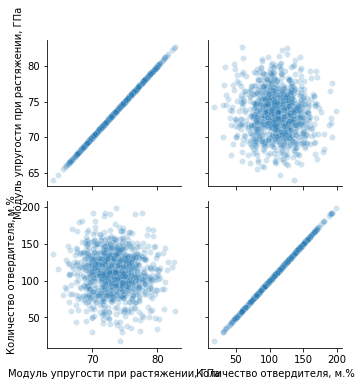

In [59]:
# Анализ взаимосвязи двух числовых переменных - 'Модуль упругости при растяжении, ГПа','Количество отвердителя, м.%' 
columns = ['Модуль упругости при растяжении, ГПа','Количество отвердителя, м.%']
g = sns.PairGrid(df_s[columns])
g.map(sns.scatterplot, alpha=0.2)

In [60]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Модуль упругости при растяжении, ГПа','Количество отвердителя, м.%']]
# Замена названий столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['modul_elas','quant_hard'], axis = 'columns')
ff

,modul_elas,quant_hard
0,70.000000,30.000000
1,70.000000,50.000000
2,70.000000,49.900000
3,70.000000,129.000000
4,70.000000,111.860000
...,...,...
1018,73.090961,86.992183
1019,72.920827,145.981978
1020,74.734344,110.533477
1021,74.042708,141.397963


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


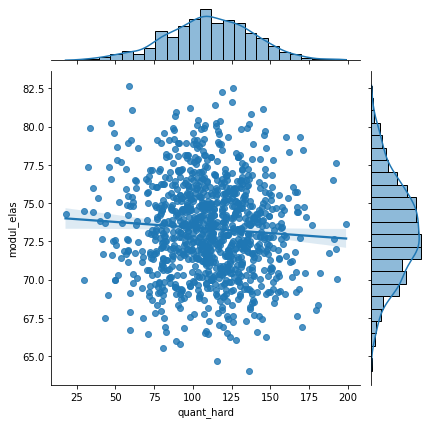

In [61]:
# Создание графика парной регрессии с указанием разбросов данных методом jointplot библиотеки seaborn
sns.jointplot('quant_hard', 'modul_elas', data=ff, kind="reg")

Требуется осуществить проверку критерия адекватности функции регрессии: 

H0: R-квадрат = 0, 

H1: R-квадрат не равен 0.

Используется OLS-модель:

In [62]:
# Создание OLS-модели
results = smf.ols('modul_elas ~ quant_hard', data=ff).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             modul_elas   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     4.457
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0350
Time:                        12:39:11   Log-Likelihood:                -2612.5
No. Observations:                1023   AIC:                             5229.
Df Residuals:                    1021   BIC:                             5239.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     74.1321      0.393    188.701      0.000      73.361      74.903
quant_hard    -0.0073      0.003     -2.111      0.035      -0.014      -0.001
==============================================================================
Omnibus:                        3.485   Durbin-Watson:                   1.969
Prob(Omnibus):                  0.175   Jarque-Bera (JB):                3.481
Skew:                           0.117   Prob(JB):                        0.175
Kurtosis:                       2.836   Cond. No.                         461.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.004. 

Уравнение вида: 'modul_elas' = 74.1321 - 0.0073*'quant_hard'.

Число степеней свободы: параметров - 1021, модели - 1.

Параметр 'Количество отвердителя, м.%' (quant_hard) - оказался значимым параметром.

F-statistic: 4.457. Prob (F-statistic): 0.0350. Prob(JB): 0.175 - модель адекватна, но ценность модели невелика, поскольку R-квадрат: 0.004

C:\Users\Admin\AppData\Local\Temp\ipykernel_7712\1022247960.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


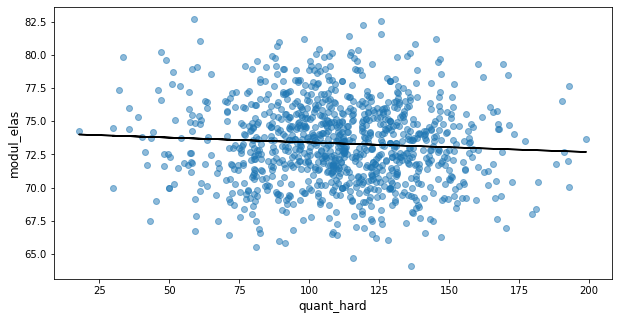

In [63]:
# Построение графика методом subplots библиотеки matplotlib
fig, ax = plt.subplots(figsize=(10, 5))

y_line = lambda a, b: a + b * ff['quant_hard']
y = y_line(results.params['Intercept'], results.params['quant_hard'])
ax.plot(ff['quant_hard'], y, color='black')
ax.scatter(ff['quant_hard'], ff['modul_elas'], alpha=.5)
ax.set_xlabel('quant_hard', fontsize=12)
ax.set_ylabel('modul_elas', fontsize=12)

fig.show()

Вывод: методами статистического анализа удалось доказать регрессионную зависимость 'Модуль упругости при растяжении, ГПа' от'Количество отвердителя, м.%'.

- Следует рассмотреть взаимосвязь двух числовых переменных - 'Прочность при растяжении, МПа','Количество отвердителя, м.%'

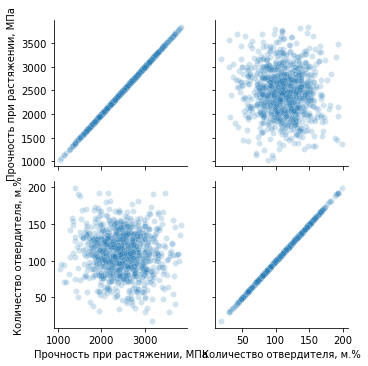

In [64]:
# Анализ взаимосвязи двух числовых переменных - 'Прочность при растяжении, МПа','Количество отвердителя, м.%'
columns = ['Прочность при растяжении, МПа','Количество отвердителя, м.%']
g = sns.PairGrid(df_s[columns])
g.map(sns.scatterplot, alpha=0.2)

In [65]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Прочность при растяжении, МПа','Количество отвердителя, м.%']]
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['solid_elas','quant_hard'], axis = 'columns') 
ff

,solid_elas,quant_hard
0,3000.000000,30.000000
1,3000.000000,50.000000
2,3000.000000,49.900000
3,3000.000000,129.000000
4,3000.000000,111.860000
...,...,...
1018,2387.292495,86.992183
1019,2360.392784,145.981978
1020,2662.906040,110.533477
1021,2071.715856,141.397963


График парной регрессии с указанием разбросов данных.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


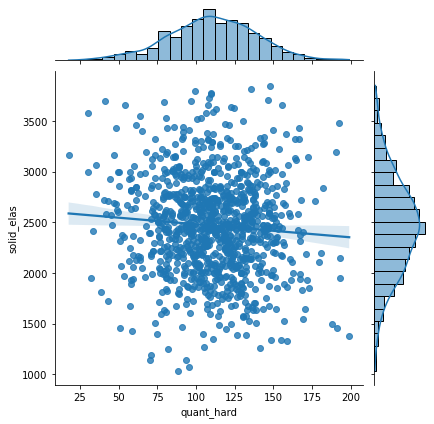

In [66]:
# Создание графика парной регрессии с указанием разбросов данных методом jointplot библиотеки seaborn
sns.jointplot('quant_hard', 'solid_elas', data=ff, kind="reg")

Требуется осуществить проверку критерия адекватности функции регрессии:

H0: R-квадрат = 0, H1: R-квадрат не равен 0.

Используется OLS-модель:

In [67]:
# Создание OLS-модели
results = smf.ols('solid_elas ~ quant_hard', data=ff).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             solid_elas   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     5.834
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0159
Time:                        12:39:13   Log-Likelihood:                -7775.9
No. Observations:                1023   AIC:                         1.556e+04
Df Residuals:                    1021   BIC:                         1.557e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2609.9595     61.127     42.697      0.000    2490.011    2729.908
quant_hard    -1.2936      0.536     -2.415      0.016      -2.345      -0.243
==============================================================================
Omnibus:                        1.369   Durbin-Watson:                   1.919
Prob(Omnibus):                  0.504   Jarque-Bera (JB):                1.276
Skew:                           0.083   Prob(JB):                        0.528
Kurtosis:                       3.048   Cond. No.                         461.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.006. 

Уравнение вида: 'solid_elas' = 2609.9595 - 1.2936*'quant_hard'.

Число степеней свободы: параметров - 2021, модели - 1. 

Параметр 'Количество отвердителя, м.%' (quant_hard) оказался значимым параметром.

F-statistic: 5.834. Prob (F-statistic): 0.0159, Prob(JB): 0.528 - модель адекватна, но ценность модели невелика, поскольку R-квадрат: 0.006


C:\Users\Admin\AppData\Local\Temp\ipykernel_7712\38544018.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


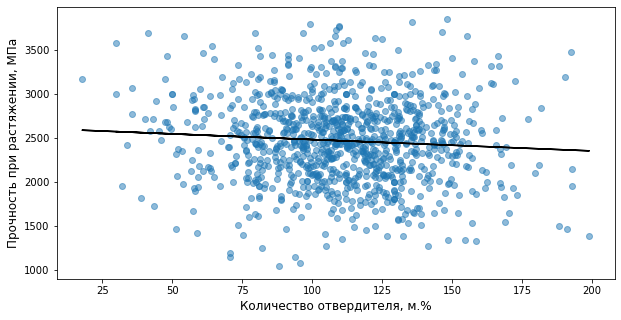

In [68]:
# Построение графика методом subplots библиотеки matplotlib
fig, ax = plt.subplots(figsize=(10, 5))

y_line = lambda a, b: a + b * ff['quant_hard']
y = y_line(results.params['Intercept'], results.params['quant_hard'])
ax.plot(ff['quant_hard'], y, color='black')
ax.scatter(ff['quant_hard'], ff['solid_elas'], alpha=.5)
ax.set_xlabel('Количество отвердителя, м.%', fontsize=12)
ax.set_ylabel('Прочность при растяжении, МПа', fontsize=12)

fig.show()

Вывод: методами статистического анализа удалось доказать регрессионную зависимость 'Прочность при растяжении, МПа' от 'Количество отвердителя, м.%'.

- Следует рассмотреть взаимосвязь двух числовых переменных - 'Прочность при растяжении, МПа','Плотность, кг/м3'

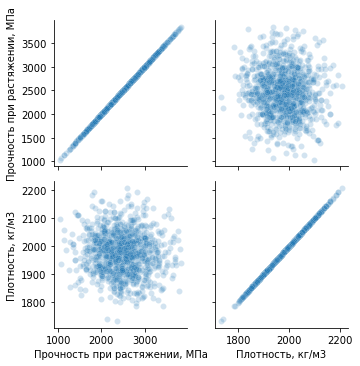

In [69]:
# Анализ взаимосвязи двух числовых переменных - 'Прочность при растяжении, МПа','Плотность, кг/м3'
columns = ['Прочность при растяжении, МПа','Плотность, кг/м3']
g = sns.PairGrid(df_s[columns])
g.map(sns.scatterplot, alpha=0.2)

In [70]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Прочность при растяжении, МПа','Плотность, кг/м3']]
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['solid_elas','density'], axis = 'columns') 
ff

,solid_elas,density
0,3000.000000,2030.000000
1,3000.000000,2030.000000
2,3000.000000,2030.000000
3,3000.000000,2030.000000
4,3000.000000,2030.000000
...,...,...
1018,2387.292495,1952.087902
1019,2360.392784,2050.089171
1020,2662.906040,1972.372865
1021,2071.715856,2066.799773


График парной регрессии с указанием разбросов данных.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


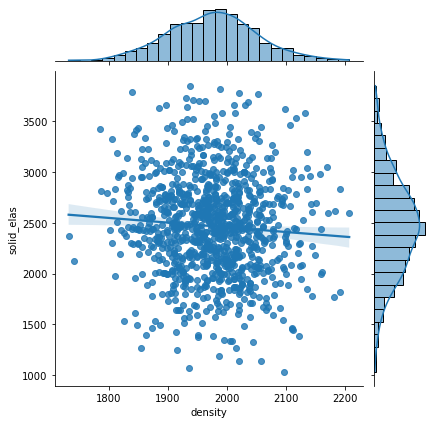

In [71]:
# Создание графика парной регрессии с указанием разбросов данных методом jointplot библиотеки seaborn
sns.jointplot('density', 'solid_elas', data=ff, kind="reg")

Требуется осуществить проверку критерия адекватности функции регрессии:

H0: R-квадрат = 0, H1: R-квадрат не равен 0.

Используется OLS-модель:

In [72]:
# Создание OLS-модели
results = smf.ols('solid_elas ~ density', data=ff).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             solid_elas   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     5.025
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0252
Time:                        12:39:15   Log-Likelihood:                -7776.3
No. Observations:                1023   AIC:                         1.556e+04
Df Residuals:                    1021   BIC:                         1.557e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3377.6186    406.552      8.308      0.000    2579.846    4175.391
density       -0.4609      0.206     -2.242      0.025      -0.864      -0.057
==============================================================================
Omnibus:                        1.352   Durbin-Watson:                   1.918
Prob(Omnibus):                  0.509   Jarque-Bera (JB):                1.291
Skew:                           0.086   Prob(JB):                        0.524
Kurtosis:                       3.023   Cond. No.                     5.30e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.3e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.005. 

Уравнение вида: 'solid_elas' = 3377.6186 - 0.4609*'density'.

Число степеней свободы: параметров - 1021, модели - 1.

Параметр ','Плотность, кг/м3' (density) оказался значимым параметром.

F-statistic: 5.025. Prob (F-statistic): 0.0252, Prob(JB): 0.524 - модель адекватна, но ценность модели невелика, поскольку R-квадрат: 0.005

C:\Users\Admin\AppData\Local\Temp\ipykernel_7712\2935229476.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


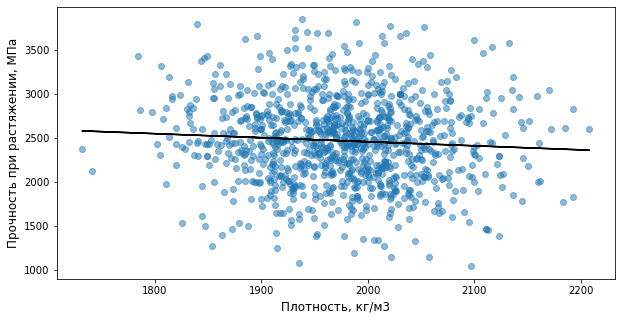

In [73]:
# Построение графика методом subplots библиотеки matplotlib
fig, ax = plt.subplots(figsize=(10, 5))

y_line = lambda a, b: a + b * ff['density']
y = y_line(results.params['Intercept'], results.params['density'])
ax.plot(ff['density'], y, color='black')
ax.scatter(ff['density'], ff['solid_elas'], alpha=.5)
ax.set_xlabel('Плотность, кг/м3', fontsize=12)
ax.set_ylabel('Прочность при растяжении, МПа', fontsize=12)

fig.show()

Вывод: методами статистического анализа удалось доказать регрессионную зависимость 'Прочность при растяжении, МПа' от 'Плотность, кг/м3'

- Следует рассмотреть взаимосвязь двух числовых переменных - 'Прочность при растяжении, МПа' и 'Модуль упругости при растяжении, ГПа'

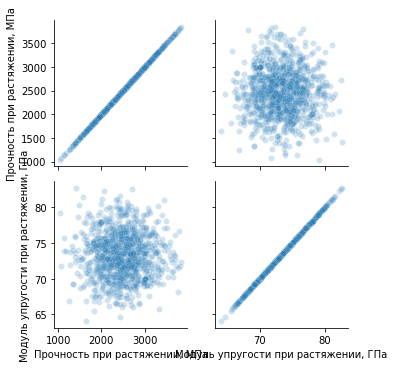

In [74]:
# Анализ взаимосвязи двух числовых переменных - 'Прочность при растяжении, МПа', 'Модуль упругости при растяжении, ГПа'
columns = ['Прочность при растяжении, МПа','Модуль упругости при растяжении, ГПа',]
g = sns.PairGrid(df_s[columns])
g.map(sns.scatterplot, alpha=0.2)

In [75]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Прочность при растяжении, МПа','Модуль упругости при растяжении, ГПа']]
# Замена названий столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['strength','modul_elas'], axis = 'columns')
ff

,strength,modul_elas
0,3000.000000,70.000000
1,3000.000000,70.000000
2,3000.000000,70.000000
3,3000.000000,70.000000
4,3000.000000,70.000000
...,...,...
1018,2387.292495,73.090961
1019,2360.392784,72.920827
1020,2662.906040,74.734344
1021,2071.715856,74.042708


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


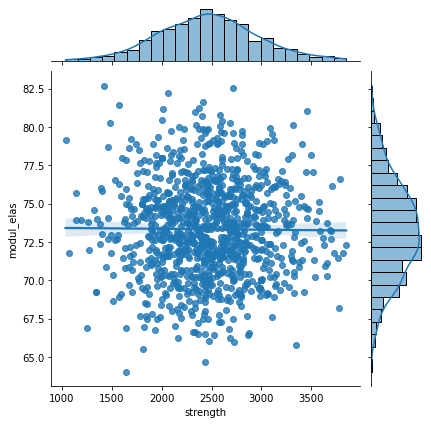

In [76]:
# Создание графика парной регрессии с указанием разбросов данных методом jointplot библиотеки seaborn
sns.jointplot('strength', 'modul_elas', data=ff, kind="reg")

Требуется осуществить проверку критерия адекватности функции регрессии: 

H0: R-квадрат = 0, 

H1: R-квадрат не равен 0.

Используется OLS-модель:

In [77]:
# Создание OLS-модели
results = smf.ols('strength ~ modul_elas', data=ff).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               strength   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                   0.08287
Date:                Thu, 27 Apr 2023   Prob (F-statistic):              0.774
Time:                        12:39:17   Log-Likelihood:                -7778.7
No. Observations:                1023   AIC:                         1.556e+04
Df Residuals:                    1021   BIC:                         1.557e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2569.7794    357.623      7.186      0.000    1868.019    3271.540
modul_elas    -1.4027      4.873     -0.288      0.774     -10.964       8.159
==============================================================================
Omnibus:                        1.108   Durbin-Watson:                   1.916
Prob(Omnibus):                  0.575   Jarque-Bera (JB):                1.062
Skew:                           0.079   Prob(JB):                        0.588
Kurtosis:                       3.014   Cond. No.                     1.73e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.73e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.000. 

Модель неадекватна, параметр незначим

C:\Users\Admin\AppData\Local\Temp\ipykernel_7712\1890912044.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


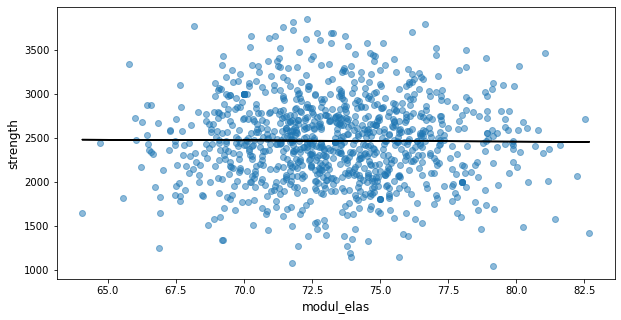

In [78]:
# Построение графика методом subplots библиотеки matplotlib
fig, ax = plt.subplots(figsize=(10, 5))

y_line = lambda a, b: a + b * ff['modul_elas']
y = y_line(results.params['Intercept'], results.params['modul_elas'])
ax.plot(ff['modul_elas'], y, color='black')
ax.scatter(ff['modul_elas'], ff['strength'], alpha=.5)
ax.set_xlabel('modul_elas', fontsize=12)
ax.set_ylabel('strength', fontsize=12)

fig.show()

Вывод: методами статистического анализа не удалось доказать регрессионную зависимость 'Прочность при растяжении, МПа' от 'Модуль упругости при растяжении, ГПа'. Изначально связь между этими параметрами являлась статистически незначимой

- Следует рассмотреть взаимосвязь двух числовых переменных - 'Прочность при растяжении, МПа' и 'Относительное удлинение при растяжении'

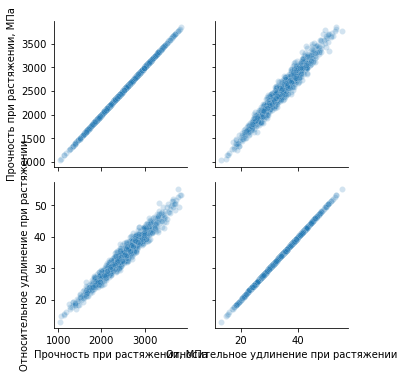

In [79]:
# Анализ взаимосвязи двух числовых переменных - 'Прочность при растяжении, МПа', 'Относительное удлинение при растяжении'
columns = ['Прочность при растяжении, МПа','Относительное удлинение при растяжении',]
g = sns.PairGrid(df_s[columns])
g.map(sns.scatterplot, alpha=0.2)

In [80]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Прочность при растяжении, МПа','Относительное удлинение при растяжении']]
# Замена названий столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['strength','delta_elas'], axis = 'columns')
ff

,strength,delta_elas
0,3000.000000,42.857143
1,3000.000000,42.857143
2,3000.000000,42.857143
3,3000.000000,42.857143
4,3000.000000,42.857143
...,...,...
1018,2387.292495,32.661939
1019,2360.392784,32.369254
1020,2662.906040,35.631624
1021,2071.715856,27.980012


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


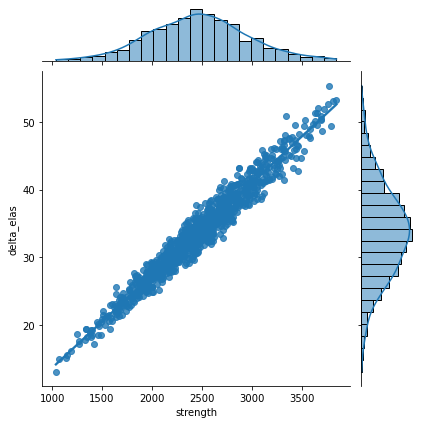

In [81]:
# Создание графика парной регрессии с указанием разбросов данных методом jointplot библиотеки seaborn
sns.jointplot('strength', 'delta_elas', data=ff, kind="reg")

In [82]:
# Создание OLS-модели
results = smf.ols('strength ~ delta_elas', data=ff).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               strength   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                 2.186e+04
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:18   Log-Likelihood:                -6188.2
No. Observations:                1023   AIC:                         1.238e+04
Df Residuals:                    1021   BIC:                         1.239e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    112.0828     16.246      6.899      0.000      80.203     143.963
delta_elas    69.8676      0.473    147.860      0.000      68.940      70.795
==============================================================================
Omnibus:                        2.493   Durbin-Watson:                   1.998
Prob(Omnibus):                  0.288   Jarque-Bera (JB):                2.396
Skew:                           0.116   Prob(JB):                        0.302
Kurtosis:                       3.047   Cond. No.                         174.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.955.

Уравнение вида: 'strength' = 112,0828 + 69.8676*'delta_elas'.

Число степеней свободы: параметров - 1021, модели - 1.

Параметр 'Относительное удлинение при растяжении' ('delta_elas') значимый.

F-statistic: 2.186e+04. Prob (F-statistic): 0.00, Prob(JB): 0.302 - модель адекватна, модель имеет ценность, поскольку R-квадрат: 0.955

C:\Users\Admin\AppData\Local\Temp\ipykernel_7712\11330047.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


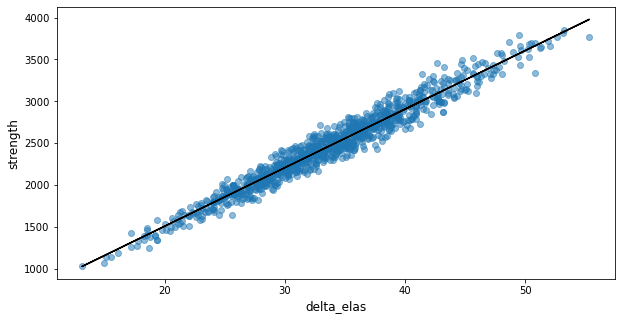

In [83]:
# Построение графика методом subplots библиотеки matplotlib
fig, ax = plt.subplots(figsize=(10, 5))

y_line = lambda a, b: a + b * ff['delta_elas']
y = y_line(results.params['Intercept'], results.params['delta_elas'])
ax.plot(ff['delta_elas'], y, color='black')
ax.scatter(ff['delta_elas'], ff['strength'], alpha=.5)
ax.set_xlabel('delta_elas', fontsize=12)
ax.set_ylabel('strength', fontsize=12)

fig.show()

Вывод: вероятно последовательности 'Прочность при растяжении, МПа' и 'Модуль упругости при растяжении, ГПа' в значительной степени включают в себя данные сгенерированные с учетом их зависимости ('Относительное удлинение при растяжении'), но обе компоненты имеют нормальное распределение с увязанными между собой математическим ожиданием и стандартным отклонением

Следует также рассмотреть множественную регрессию

###### Множественная регрессия (OLS)

- Следует рассмотреть взаимосвязь числовых переменных: 'Прочность при растяжении, МПа' от 'Количество отвердителя, м.%' и 'Плотность, кг/м3'.

In [84]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Прочность при растяжении, МПа','Количество отвердителя, м.%', 'Плотность, кг/м3']]
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['solid_elas','quant_hard', 'density'], axis = 'columns') 
ff

,solid_elas,quant_hard,density
0,3000.000000,30.000000,2030.000000
1,3000.000000,50.000000,2030.000000
2,3000.000000,49.900000,2030.000000
3,3000.000000,129.000000,2030.000000
4,3000.000000,111.860000,2030.000000
...,...,...,...
1018,2387.292495,86.992183,1952.087902
1019,2360.392784,145.981978,2050.089171
1020,2662.906040,110.533477,1972.372865
1021,2071.715856,141.397963,2066.799773


Множественная регрессия (OLS)

In [85]:
# Создание OLS-модели
resultsm = smf.ols('solid_elas ~ quant_hard + density', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             solid_elas   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     5.658
Date:                Thu, 27 Apr 2023   Prob (F-statistic):            0.00360
Time:                        12:39:19   Log-Likelihood:                -7773.1
No. Observations:                1023   AIC:                         1.555e+04
Df Residuals:                    1020   BIC:                         1.557e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3562.0617    412.149      8.643      0.000    2753.305    4370.818
quant_hard    -1.3385      0.535     -2.503      0.012      -2.388      -0.289
density       -0.4794      0.205     -2.336      0.020      -0.882      -0.077
==============================================================================
Omnibus:                        1.580   Durbin-Watson:                   1.922
Prob(Omnibus):                  0.454   Jarque-Bera (JB):                1.476
Skew:                           0.089   Prob(JB):                        0.478
Kurtosis:                       3.057   Cond. No.                     5.40e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.4e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: параметры значимы, модель адекватна. solid_elas = 3562.0617 - 1.3385 * quant_hard - 0.4794 * density.

('Прочность при растяжении, МПа' от 'Количество отвердителя, м.%' и 'Плотность, кг/м3').

Поскольку R-квадрат: 0.011, ценность подобной модели невелика.

Следует оценить прогнозирующую способность модели: 

In [86]:
# Выбор модели линейной регрессии
LR = lm.LinearRegression()

In [87]:
# Указание независимых переменных
X=ff[['quant_hard','density']]

In [88]:
# Указание зависимой переменной
mod_m = LR.fit(X,ff[['solid_elas']])

In [89]:
# Расчет коэффициентов регрессии
mod_m.intercept_, mod_m.coef_

(array([3562.06173355]), array([[-1.33847829, -0.47938735]]))

In [90]:
# Определение R-squared
r2 = mod_m.score(X,ff[['solid_elas']])
r2

0.01097173404598939

In [91]:
# Задание аргументов метода predict
x_new_ff = [[50,2030]]

In [92]:
# Прогнозируемое значение
y_new_ff=mod_m.predict(x_new_ff)
print("Прогноз: ",y_new_ff.round(0))

Прогноз:  [[2522.]]


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


Вывод: точность прогноза невелика, значения достаточно близки просто к средним значениям

Вывод: методами статистического анализа удалось доказать регрессионную зависимость 'Прочность при растяжении, МПа' от 'Количество отвердителя, м.%' и 'Плотность, кг/м3'.

- Следует рассмотреть взаимосвязь числовых переменных: 'Модуль упругости при растяжении, ГПа' от 'Количество отвердителя, м.%' и 'Плотность, кг/м3'.

In [93]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Модуль упругости при растяжении, ГПа','Количество отвердителя, м.%', 'Плотность, кг/м3']]
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['modul_elas','quant_hard', 'density'], axis = 'columns') 
ff

,modul_elas,quant_hard,density
0,70.000000,30.000000,2030.000000
1,70.000000,50.000000,2030.000000
2,70.000000,49.900000,2030.000000
3,70.000000,129.000000,2030.000000
4,70.000000,111.860000,2030.000000
...,...,...,...
1018,73.090961,86.992183,1952.087902
1019,72.920827,145.981978,2050.089171
1020,74.734344,110.533477,1972.372865
1021,74.042708,141.397963,2066.799773


In [94]:
# Создание OLS-модели
resultsm = smf.ols('modul_elas ~ quant_hard + density', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             modul_elas   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     2.432
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0884
Time:                        12:39:19   Log-Likelihood:                -2612.3
No. Observations:                1023   AIC:                             5231.
Df Residuals:                    1020   BIC:                             5245.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     75.8121      2.655     28.550      0.000      70.601      81.023
quant_hard    -0.0073      0.003     -2.132      0.033      -0.014      -0.001
density       -0.0008      0.001     -0.640      0.523      -0.003       0.002
==============================================================================
Omnibus:                        3.393   Durbin-Watson:                   1.965
Prob(Omnibus):                  0.183   Jarque-Bera (JB):                3.403
Skew:                           0.117   Prob(JB):                        0.182
Kurtosis:                       2.841   Cond. No.                     5.40e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.4e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Параметр 'density' незначим, модель неадекватна, R-квадрат = 0,005

Вывод: методами статистического анализа не удалось доказать регрессионную зависимость 'Модуль упругости при растяжении, ГПа' от 'Количество отвердителя, м.%' и 'Плотность, кг/м3'.

###### Анализ общей модели множественной регрессии на неочищенных и очищенных от выбросов данных

- Данные не очищены от выбросов

In [95]:
# Вывод названий столбцов датасета df_s
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

In [96]:
# Вывод первых пяти строк датасета df_s
df_s.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,42.857143,4.060986
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064


In [97]:
# Тип данных столбца 'Угол нашивки, град' датасета df_s, метод dtypes()
df_s['Угол нашивки, град'] = df_s['Угол нашивки, град'].astype(int)
df_s.dtypes['Угол нашивки, град']

dtype('int32')

Следует рассмотреть модель множественной регрессии с учетом всех факторов:

In [98]:
# Создание нового датасета ff для модели множественной регрессии
ff = df_s
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13', 'col14', 'col15'], axis = 'columns')
ff.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,42.857143,4.060986
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064


Необходимо также учесть влияние категориальных переменных.

In [99]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)
ff.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_7712\4291356752.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col110,col111
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,42.857143,4.060986,1,0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986,1,0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,42.857143,4.060986,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064,1,0


Параметры 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа' ('col3' и 'col8') связаны с параметрами 'Относительное удлинение при растяжении' и 'Относительное удлинение' ('col14' и 'col15'), поэтому последние не включаются в рассматриваемую ниже модель:

In [100]:
# Модель OLS множественной регрессии для параметра col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.364
Date:                Thu, 27 Apr 2023   Prob (F-statistic):              0.177
Time:                        12:39:19   Log-Likelihood:                -2606.5
No. Observations:                1023   AIC:                             5239.
Df Residuals:                    1010   BIC:                             5303.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     73.4831      3.065     23.976      0.000      67.469      79.497
col1          -0.0393      0.107     -0.367      0.714      -0.250       0.171
col2          -0.0010      0.001     -0.714      0.475      -0.004       0.002
col3           0.0002      0.000      0.806      0.421      -0.000       0.001
col4          -0.0083      0.003     -2.375      0.018      -0.015      -0.001
col5           0.0738      0.041      1.821      0.069      -0.006       0.153
col6           0.0023      0.002      0.975      0.330      -0.002       0.007
col7           0.0005      0.000      1.330      0.184      -0.000       0.001
col9          -0.0001      0.000     -0.593      0.553      -0.001       0.000
col10          0.0026      0.002      1.586      0.113      -0.001       0.006
col12         -0.0413      0.038     -1.082      0.280      -0.116       0.034
col13          0.0024      0.008      0.301      0.764      -0.013       0.018
col110        -0.1392      0.197     -0.706      0.480      -0.526       0.248
==============================================================================
Omnibus:                        3.586   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.166   Jarque-Bera (JB):                3.478
Skew:                           0.105   Prob(JB):                        0.176
Kurtosis:                       2.806   Cond. No.                     1.05e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, не все параметры значимы, R-квадрат = 0,016, следует оставить значимый параметр 'col4' - 'Количество отвердителя, м.%'.

In [101]:
# Модель OLS парной регрессии col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col4', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     4.457
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0350
Time:                        12:39:19   Log-Likelihood:                -2612.5
No. Observations:                1023   AIC:                             5229.
Df Residuals:                    1021   BIC:                             5239.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     74.1321      0.393    188.701      0.000      73.361      74.903
col4          -0.0073      0.003     -2.111      0.035      -0.014      -0.001
==============================================================================
Omnibus:                        3.485   Durbin-Watson:                   1.969
Prob(Omnibus):                  0.175   Jarque-Bera (JB):                3.481
Skew:                           0.117   Prob(JB):                        0.175
Kurtosis:                       2.836   Cond. No.                         461.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Модель адекватна и параметр 'col4' значим, R-квадрат = 0,004. 

Модель modul_elas = 74.1321 - 0.0073 * quant_hard.

('Модуль упругости при растяжении, ГПа' от 'Количество отвердителя, м.%').

Прогнозирующая способность модели:

In [102]:
# Указание независимой переменной
X=ff[['col4']]

In [103]:
# Указаиние зависимой переменной
mod_m = LR.fit(X,ff[['col8']])

In [104]:
# Расчет коэффициентов линейной регрессии
mod_m.intercept_, mod_m.coef_

(array([74.13210432]), array([[-0.00726714]]))

In [105]:
# Определение R-squared
r2 = mod_m.score(X,ff[['col8']])
r2

0.004346585580664586

In [106]:
# Задание аргументов метода predict
x_new_ff = [[50]]

In [107]:
# Прогнозируемое значение
y_new_ff=mod_m.predict(x_new_ff)
print("Прогноз: ",y_new_ff.round(0))

Прогноз:  [[74.]]


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


Вывод: точность прогноза невелика, значения достаточно близки к средним значениям

In [108]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col8 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.802
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0435
Time:                        12:39:19   Log-Likelihood:                -7767.9
No. Observations:                1023   AIC:                         1.556e+04
Df Residuals:                    1010   BIC:                         1.563e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3941.4164    583.200      6.758      0.000    2796.993    5085.839
col1          12.6778     16.633      0.762      0.446     -19.961      45.317
col2          -0.5111      0.207     -2.465      0.014      -0.918      -0.104
col3           0.0619      0.046      1.347      0.178      -0.028       0.152
col4          -1.3488      0.540     -2.498      0.013      -2.408      -0.289
col5          -4.7370      6.302     -0.752      0.452     -17.104       7.630
col6          -0.3298      0.372     -0.886      0.376      -1.060       0.401
col7           0.0135      0.054      0.249      0.803      -0.093       0.120
col8          -2.8972      4.886     -0.593      0.553     -12.485       6.690
col10          0.2434      0.255      0.956      0.339      -0.256       0.743
col12        -12.2480      5.925     -2.067      0.039     -23.875      -0.621
col13          0.8723      1.242      0.702      0.483      -1.566       3.310
col110       -22.6233     30.625     -0.739      0.460     -82.720      37.473
==============================================================================
Omnibus:                        1.471   Durbin-Watson:                   1.922
Prob(Omnibus):                  0.479   Jarque-Bera (JB):                1.445
Skew:                           0.092   Prob(JB):                        0.486
Kurtosis:                       2.999   Cond. No.                     8.50e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.5e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, но не все параметры значимы, следует оставить значимые параметры: 'col2', 'col4' и 'col12': 'Плотность, кг/м3', 'Количество отвердителя, м.%' и 'Шаг нашивки', R-квадрат = 0,021

In [109]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col2 + col4 + col12', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     5.150
Date:                Thu, 27 Apr 2023   Prob (F-statistic):            0.00155
Time:                        12:39:19   Log-Likelihood:                -7771.1
No. Observations:                1023   AIC:                         1.555e+04
Df Residuals:                    1019   BIC:                         1.557e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3692.6806    416.551      8.865      0.000    2875.286    4510.075
col2          -0.5045      0.205     -2.458      0.014      -0.907      -0.102
col4          -1.3247      0.534     -2.481      0.013      -2.373      -0.277
col12        -11.9484      5.902     -2.025      0.043     -23.529      -0.368
==============================================================================
Omnibus:                        1.569   Durbin-Watson:                   1.924
Prob(Omnibus):                  0.456   Jarque-Bera (JB):                1.478
Skew:                           0.090   Prob(JB):                        0.477
Kurtosis:                       3.045   Cond. No.                     5.47e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.47e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна и параметры 'col2', 'col4' и 'col12' значимы, R-квадрат = 0,015.

Модель solid_elas = 3692.6806 - 0,5045 * density - 1.3247 * quant_hard - 11.9484 * step.

'Прочность при растяжении, МПа' от 'Плотность, кг/м3', 'Количество отвердителя, м.%' и 'Шаг нашивки'.

Прогнозирующая способность модели:

In [110]:
# Вывод названий столбцов датасета df_s
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

Параметры 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа' ('col3' и 'col8') связаны с параметрами 'Относительное удлинение при растяжении' и 'Относительное удлинение' ('col14' и 'col15'), поэтому п('col3' и 'col8') не включаются в рассматриваемую ниже модель:

In [111]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col1 + col2 + col4 + col5 + col6 + col7 + col10 + col12 + col13 + col110 + col14 + col15', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     1843.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:19   Log-Likelihood:                -6177.2
No. Observations:                1023   AIC:                         1.238e+04
Df Residuals:                    1010   BIC:                         1.244e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    192.6583    100.240      1.922      0.055      -4.044     389.361
col1           0.4122      3.513      0.117      0.907      -6.481       7.306
col2          -0.0672      0.044     -1.531      0.126      -0.153       0.019
col4          -0.2998      0.114     -2.632      0.009      -0.523      -0.076
col5           2.0256      1.330      1.523      0.128      -0.584       4.635
col6           0.0791      0.079      1.006      0.315      -0.075       0.233
col7           0.0184      0.011      1.611      0.108      -0.004       0.041
col10          0.1007      0.054      1.874      0.061      -0.005       0.206
col12         -2.2139      1.252     -1.768      0.077      -4.672       0.244
col13          0.1514      0.262      0.578      0.563      -0.363       0.665
col110        -6.1950      6.471     -0.957      0.339     -18.894       6.504
col14         69.7380      0.474    147.036      0.000      68.807      70.669
col15         -0.0287      0.078     -0.368      0.713      -0.182       0.124
==============================================================================
Omnibus:                        0.991   Durbin-Watson:                   2.021
Prob(Omnibus):                  0.609   Jarque-Bera (JB):                0.960
Skew:                           0.075   Prob(JB):                        0.619
Kurtosis:                       3.005   Cond. No.                     6.51e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.51e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна и параметры 'col4' и 'col14' значимы ('Количество отвердителя, м.%' и 'Относительное удлинение при растяжении'), R-квадрат = 0.956.

Следует оставить также 'col10' и 'col12' ('Потребление смолы, г/м2' и 'Шаг нашивки'), поскольку они близки к значимым:

In [112]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col4 + col10 + col12 + col14', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     5517.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:19   Log-Likelihood:                -6182.2
No. Observations:                1023   AIC:                         1.237e+04
Df Residuals:                    1018   BIC:                         1.240e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    135.4601     25.583      5.295      0.000      85.259     185.661
col4          -0.2666      0.113     -2.356      0.019      -0.489      -0.045
col10          0.1079      0.054      2.017      0.044       0.003       0.213
col12         -1.9455      1.249     -1.558      0.120      -4.396       0.505
col14         69.7474      0.472    147.769      0.000      68.821      70.674
==============================================================================
Omnibus:                        1.290   Durbin-Watson:                   2.012
Prob(Omnibus):                  0.525   Jarque-Bera (JB):                1.250
Skew:                           0.086   Prob(JB):                        0.535
Kurtosis:                       3.009   Cond. No.                     2.03e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.03e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: параметр 'col12' ('Шаг нашивки') незначим, следует исключить его из модели:

In [113]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col4 + col10 + col14', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     7344.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:19   Log-Likelihood:                -6183.4
No. Observations:                1023   AIC:                         1.237e+04
Df Residuals:                    1019   BIC:                         1.239e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    121.2876     23.928      5.069      0.000      74.335     168.240
col4          -0.2687      0.113     -2.372      0.018      -0.491      -0.046
col10          0.1068      0.054      1.994      0.046       0.002       0.212
col14         69.7840      0.472    147.927      0.000      68.858      70.710
==============================================================================
Omnibus:                        1.561   Durbin-Watson:                   2.010
Prob(Omnibus):                  0.458   Jarque-Bera (JB):                1.478
Skew:                           0.091   Prob(JB):                        0.478
Kurtosis:                       3.039   Cond. No.                     1.89e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.89e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.955.

Модель адекватна и параметры 'col4', 'col10' и 'col14' значимы ('Количество отвердителя, м.%', 'Потребление смолы, г/м2' и 'Относительное удлинение при растяжении'), R-квадрат = 0.956.

Модель 'Прочность при растяжении, МПа' от 'Количество отвердителя, м.%', 'Потребление смолы, г/м2' и 'Относительное удлинение при растяжении'

'col9' = 121.2876 - 0.2687'*'col4' + 0.1068'*'col10' + 69.7840'*'col14'

Число степеней свободы: параметров - 1019, модели - 13.

F-statistic: 7344. Prob (F-statistic): 0.00, Prob(JB): 0.478 - модель адекватна, модель имеет ценность, поскольку R-квадрат: 0.956

- Данные очищены от выбросов

In [114]:
# Вывод сведений о датасете df_s методом info()
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         1023 non-null   float64
 1   Плотность, кг/м3                        1023 non-null   float64
 2   модуль упругости, ГПа                   1023 non-null   float64
 3   Количество отвердителя, м.%             1023 non-null   float64
 4   Содержание эпоксидных групп,%_2         1023 non-null   float64
 5   Температура вспышки, С_2                1023 non-null   float64
 6   Поверхностная плотность, г/м2           1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа    1023 non-null   float64
 8   Прочность при растяжении, МПа           1023 non-null   float64
 9   Потребление смолы, г/м2                 1023 non-null   float64
 10  Угол нашивки, град                      1023 non-null   int3

In [115]:
# Вывод первых пяти строк датасета df_s
df_s.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,42.857143,4.060986
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064


Очистка данных от выбросов:

Соотношение матрица-наполнитель: 3s=0 iq=6


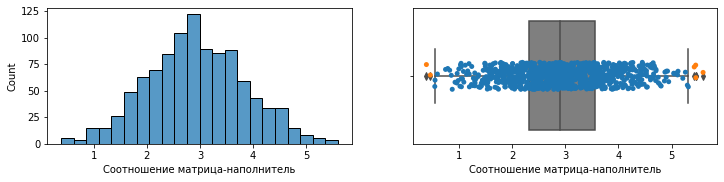

Плотность, кг/м3: 3s=3 iq=9


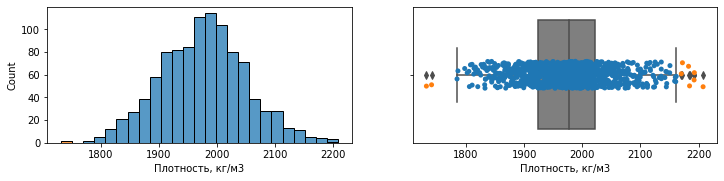

модуль упругости, ГПа: 3s=2 iq=2


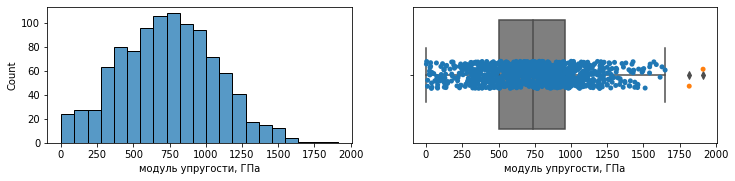

Количество отвердителя, м.%: 3s=2 iq=14


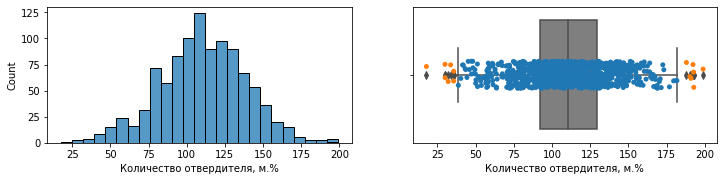

Содержание эпоксидных групп,%_2: 3s=2 iq=2


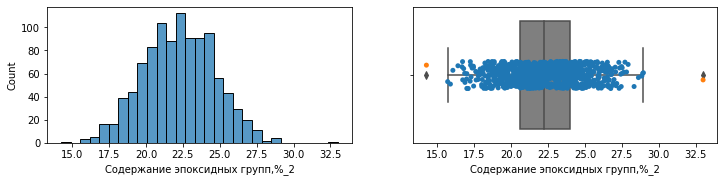

Температура вспышки, С_2: 3s=3 iq=8


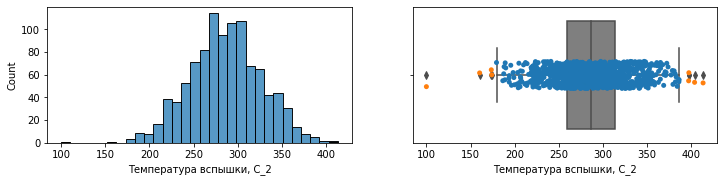

Поверхностная плотность, г/м2: 3s=2 iq=2


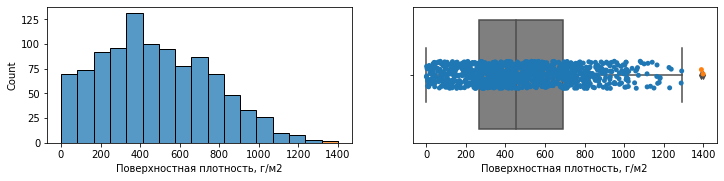

Модуль упругости при растяжении, ГПа: 3s=0 iq=6


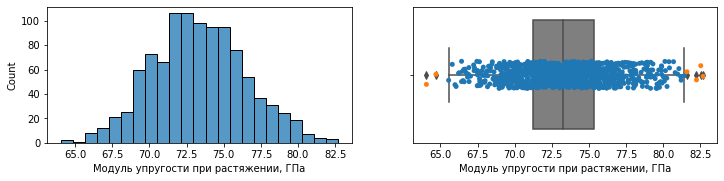

Прочность при растяжении, МПа: 3s=0 iq=11


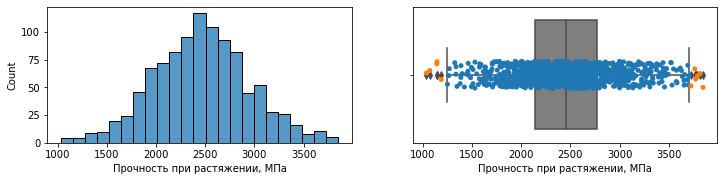

Потребление смолы, г/м2: 3s=3 iq=8


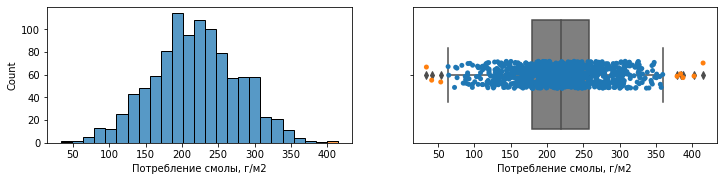

Угол нашивки, град: 3s=0 iq=0


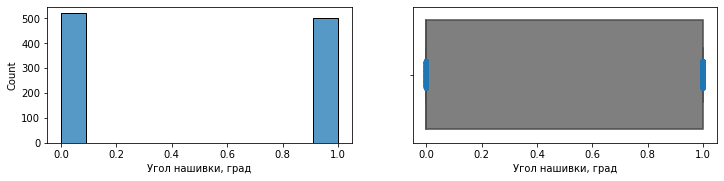

Шаг нашивки: 3s=0 iq=4


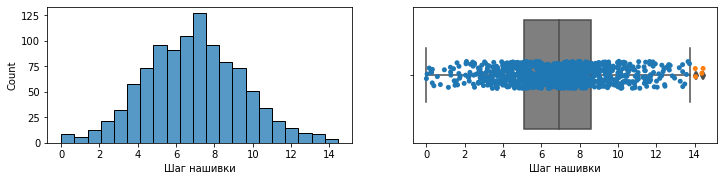

Плотность нашивки: 3s=7 iq=21


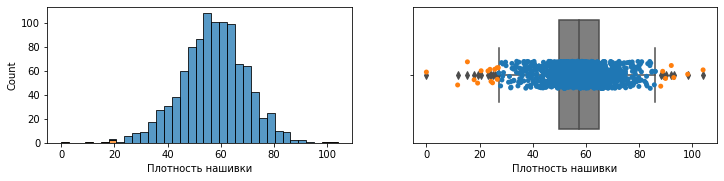

Относительное удлинение при растяжении: 3s=2 iq=11


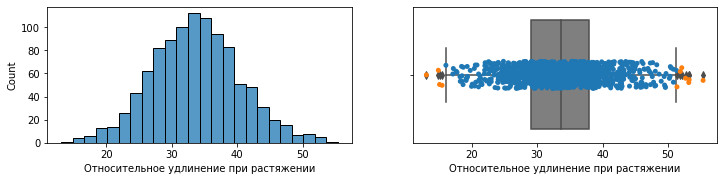

Относительное удлинение: 3s=4 iq=86


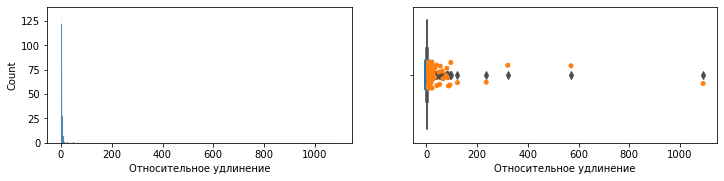

Метод 3-х сигм, выбросов: 30
Метод межквартильных расстояний, выбросов: 190


In [116]:
# Визуализация выбросов
count_3s = 0
count_iq = 0
for column in df_s:
    d = df_s.loc[:, [column]]
    # методом 3-х сигм
    zscore = (df_s[column] - df_s[column].mean()) / df_s[column].std()
    d['3s'] = zscore.abs() > 3
    count_3s += d['3s'].sum()
    # методом межквартильных расстояний
    q1 = np.quantile(df_s[column], 0.25)
    q3 = np.quantile(df_s[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    d['iq'] = (df_s[column] <= lower) | (df_s[column] >= upper)
    count_iq += d['iq'].sum()
    # визуализация выбросов
    print('{}: 3s={} iq={}'.format(column, d['3s'].sum(), d['iq'].sum()))
    fig, axes = plt.subplots(1, 2, figsize=(12, 2.5))
    sns.histplot(data=d, x=column, hue='3s', multiple='stack', legend=False, ax=axes[0])
    sns.boxplot(data=d, x=column, color='tab:gray', ax=axes[1])
    sns.stripplot(data=d[d['iq']==False], x=column, ax=axes[1])
    sns.stripplot(data=d[d['iq']==True], x=column, color='tab:orange', ax=axes[1])
    plt.show()

print('Метод 3-х сигм, выбросов:', count_3s)
print('Метод межквартильных расстояний, выбросов:', count_iq)

- Очистка данных от выбросов методом 3-х сигм:

In [117]:
# Создание нового датасета df для очистки от выбросов методом 3-х сигм и вывод информации о нем
df = df_s.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         1023 non-null   float64
 1   Плотность, кг/м3                        1023 non-null   float64
 2   модуль упругости, ГПа                   1023 non-null   float64
 3   Количество отвердителя, м.%             1023 non-null   float64
 4   Содержание эпоксидных групп,%_2         1023 non-null   float64
 5   Температура вспышки, С_2                1023 non-null   float64
 6   Поверхностная плотность, г/м2           1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа    1023 non-null   float64
 8   Прочность при растяжении, МПа           1023 non-null   float64
 9   Потребление смолы, г/м2                 1023 non-null   float64
 10  Угол нашивки, град                      1023 non-null   int3

In [118]:
# Удаление выбросов методом 3-х сигм
outliers = pd.DataFrame(index=df.index)
for column in df:
    zscore = (df[column] - df[column].mean()) / df[column].std()
    outliers[column] = (zscore.abs() > 3)
df = df[outliers.sum(axis=1)==0]
df.shape

(994, 15)

In [119]:
# Вывод сведений о датасете df после очистки методом 3-х сигм
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 994 entries, 1 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         994 non-null    float64
 1   Плотность, кг/м3                        994 non-null    float64
 2   модуль упругости, ГПа                   994 non-null    float64
 3   Количество отвердителя, м.%             994 non-null    float64
 4   Содержание эпоксидных групп,%_2         994 non-null    float64
 5   Температура вспышки, С_2                994 non-null    float64
 6   Поверхностная плотность, г/м2           994 non-null    float64
 7   Модуль упругости при растяжении, ГПа    994 non-null    float64
 8   Прочность при растяжении, МПа           994 non-null    float64
 9   Потребление смолы, г/м2                 994 non-null    float64
 10  Угол нашивки, град                      994 non-null    int32

In [120]:
# Создание датасета ff для регрессионного анализа
ff = df
# Заменить названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13', 'col14', 'col15'], axis = 'columns') 
ff

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000,42.857143,4.060986
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000,42.857143,4.060986
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000,42.857143,3.984064
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000,42.857143,4.010695
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000,42.857143,3.717472
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770,32.661939,2.615192
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790,32.369254,5.307442
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684,35.631624,6.388370
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074,27.980012,2.794045


In [121]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)
ff.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_7712\4291356752.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col110,col111
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064,1,0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0,42.857143,4.010695,1,0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0,42.857143,3.717472,1,0


In [122]:
# Модель OLS множественной регрессии для параметра col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.724
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0569
Time:                        12:39:35   Log-Likelihood:                -2527.1
No. Observations:                 994   AIC:                             5080.
Df Residuals:                     981   BIC:                             5144.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     73.1322      3.117     23.466      0.000      67.016      79.248
col1          -0.0575      0.108     -0.530      0.596      -0.270       0.155
col2          -0.0012      0.001     -0.859      0.391      -0.004       0.002
col3           0.0001      0.000      0.484      0.628      -0.000       0.001
col4          -0.0096      0.004     -2.707      0.007      -0.017      -0.003
col5           0.0916      0.041      2.216      0.027       0.010       0.173
col6           0.0024      0.002      0.966      0.334      -0.002       0.007
col7           0.0004      0.000      1.091      0.276      -0.000       0.001
col9       -5.192e-05      0.000     -0.252      0.801      -0.000       0.000
col10          0.0033      0.002      1.946      0.052   -2.75e-05       0.007
col12         -0.0454      0.039     -1.172      0.241      -0.121       0.031
col13          0.0090      0.008      1.061      0.289      -0.008       0.025
col110        -0.0954      0.199     -0.480      0.632      -0.486       0.295
==============================================================================
Omnibus:                        3.398   Durbin-Watson:                   1.987
Prob(Omnibus):                  0.183   Jarque-Bera (JB):                3.387
Skew:                           0.115   Prob(JB):                        0.184
Kurtosis:                       2.831   Cond. No.                     1.05e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель неадекватна, не все параметры значимы, R-квадрат = 0.021, следует оставить значимый параметры 'col4' - 'Количество отвердителя, м.%' и 'col5' - 'Содержание эпоксидных групп,%_2'

In [123]:
# Модель OLS множественной регрессии для параметра col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col4 + col5', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     5.375
Date:                Thu, 27 Apr 2023   Prob (F-statistic):            0.00477
Time:                        12:39:35   Log-Likelihood:                -2532.1
No. Observations:                 994   AIC:                             5070.
Df Residuals:                     991   BIC:                             5085.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     72.2858      1.002     72.122      0.000      70.319      74.253
col4          -0.0086      0.004     -2.449      0.015      -0.016      -0.002
col5           0.0898      0.041      2.177      0.030       0.009       0.171
==============================================================================
Omnibus:                        3.585   Durbin-Watson:                   1.970
Prob(Omnibus):                  0.167   Jarque-Bera (JB):                3.647
Skew:                           0.134   Prob(JB):                        0.161
Kurtosis:                       2.873   Cond. No.                     1.19e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.19e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, параметрs 'col4' и 'col5' значимы, R-квадрат = 0,011

In [124]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col8 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     1.619
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0807
Time:                        12:39:35   Log-Likelihood:                -7539.2
No. Observations:                 994   AIC:                         1.510e+04
Df Residuals:                     981   BIC:                         1.517e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3821.1204    590.454      6.471      0.000    2662.423    4979.818
col1          14.1146     16.785      0.841      0.401     -18.824      47.053
col2          -0.5481      0.211     -2.601      0.009      -0.962      -0.135
col3           0.0542      0.047      1.152      0.250      -0.038       0.147
col4          -1.1134      0.551     -2.019      0.044      -2.195      -0.031
col5          -4.6189      6.411     -0.720      0.471     -17.200       7.962
col6          -0.2075      0.380     -0.545      0.586      -0.954       0.539
col7          -0.0096      0.055     -0.175      0.861      -0.118       0.099
col8          -1.2445      4.943     -0.252      0.801     -10.945       8.456
col10          0.2350      0.260      0.905      0.366      -0.274       0.745
col12        -12.2512      5.986     -2.047      0.041     -23.999      -0.504
col13          1.2155      1.306      0.931      0.352      -1.347       3.778
col110       -22.6895     30.786     -0.737      0.461     -83.104      37.725
==============================================================================
Omnibus:                        1.699   Durbin-Watson:                   1.920
Prob(Omnibus):                  0.428   Jarque-Bera (JB):                1.720
Skew:                           0.100   Prob(JB):                        0.423
Kurtosis:                       2.965   Cond. No.                     8.56e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.56e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель неадекватна, не все параметры значимы, R-квадрат = 0,019, следует оставить параметры 'col2', 'col4' и 'col12' ('Плотность, кг/м3', 'Количество отвердителя, м.%', 'Шаг нашивки '):

In [125]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col2 + col4 + col12', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     4.641
Date:                Thu, 27 Apr 2023   Prob (F-statistic):            0.00314
Time:                        12:39:35   Log-Likelihood:                -7542.0
No. Observations:                 994   AIC:                         1.509e+04
Df Residuals:                     990   BIC:                         1.511e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3729.3268    422.781      8.821      0.000    2899.678    4558.976
col2          -0.5371      0.209     -2.575      0.010      -0.946      -0.128
col4          -1.0882      0.545     -1.996      0.046      -2.158      -0.018
col12        -12.1645      5.958     -2.042      0.041     -23.855      -0.474
==============================================================================
Omnibus:                        1.691   Durbin-Watson:                   1.926
Prob(Omnibus):                  0.429   Jarque-Bera (JB):                1.672
Skew:                           0.100   Prob(JB):                        0.434
Kurtosis:                       2.993   Cond. No.                     5.51e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.51e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, параметры значимы, R-квадрат = 0,014

Параметры 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа' ('col3' и 'col8') связаны с параметрами 'Относительное удлинение при растяжении' и 'Относительное удлинение' ('col14' и 'col15'), поэтому п('col3' и 'col8') не включаются в рассматриваемую ниже модель:

In [126]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col1 + col2 + col4 + col5 + col6 + col7 + col10 + col12 + col13 + col110 + col14 + col15', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     1781.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:35   Log-Likelihood:                -5995.2
No. Observations:                 994   AIC:                         1.202e+04
Df Residuals:                     981   BIC:                         1.208e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    174.1659    101.840      1.710      0.088     -25.682     374.014
col1          -0.2522      3.554     -0.071      0.943      -7.227       6.723
col2          -0.0732      0.045     -1.637      0.102      -0.161       0.015
col4          -0.3388      0.116     -2.910      0.004      -0.567      -0.110
col5           2.7390      1.354      2.022      0.043       0.081       5.397
col6           0.0845      0.080      1.050      0.294      -0.073       0.242
col7           0.0145      0.012      1.246      0.213      -0.008       0.037
col10          0.1250      0.055      2.279      0.023       0.017       0.233
col12         -2.3958      1.269     -1.888      0.059      -4.886       0.094
col13          0.3467      0.276      1.258      0.209      -0.194       0.887
col110        -4.4232      6.506     -0.680      0.497     -17.190       8.344
col14         69.8755      0.486    143.793      0.000      68.922      70.829
col15          0.0137      0.366      0.038      0.970      -0.704       0.731
==============================================================================
Omnibus:                        0.931   Durbin-Watson:                   2.011
Prob(Omnibus):                  0.628   Jarque-Bera (JB):                0.893
Skew:                           0.073   Prob(JB):                        0.640
Kurtosis:                       3.009   Cond. No.                     6.56e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.56e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: модель адекватна, R-квадрат = 0.956, значимыми являются параметры 'col4', 'col5', 'col10' и 'col14' ('Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Потребление смолы, г/м2' и 'Относительное удлинение при растяжении'):

In [127]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col4 + col5 + col10 + col14', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     5328.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:35   Log-Likelihood:                -6000.4
No. Observations:                 994   AIC:                         1.201e+04
Df Residuals:                     989   BIC:                         1.204e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     55.2609     39.004      1.417      0.157     -21.279     131.800
col4          -0.3070      0.116     -2.653      0.008      -0.534      -0.080
col5           2.6630      1.354      1.967      0.049       0.007       5.319
col10          0.1287      0.055      2.354      0.019       0.021       0.236
col14         69.9724      0.481    145.602      0.000      69.029      70.915
==============================================================================
Omnibus:                        1.608   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.447   Jarque-Bera (JB):                1.519
Skew:                           0.093   Prob(JB):                        0.468
Kurtosis:                       3.043   Cond. No.                     3.08e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.08e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: модель адекватна, R-квадрат = 0.956, значимыми являются параметры 'col4', 'col5', 'col10' и 'col14' ('Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Потребление смолы, г/м2' и 'Относительное удлинение при растяжении')

- Очистка данных от выбросов методом квантилей

In [128]:
# Вывод информации о датасете df_s
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         1023 non-null   float64
 1   Плотность, кг/м3                        1023 non-null   float64
 2   модуль упругости, ГПа                   1023 non-null   float64
 3   Количество отвердителя, м.%             1023 non-null   float64
 4   Содержание эпоксидных групп,%_2         1023 non-null   float64
 5   Температура вспышки, С_2                1023 non-null   float64
 6   Поверхностная плотность, г/м2           1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа    1023 non-null   float64
 8   Прочность при растяжении, МПа           1023 non-null   float64
 9   Потребление смолы, г/м2                 1023 non-null   float64
 10  Угол нашивки, град                      1023 non-null   int3

In [129]:
# Создание нового датасета df для очистки методом квартилей
df = df_s.copy()
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,42.857143,4.060986
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064


In [130]:
# Очистка от выбросов методом квартилей
for col in df.columns:
    q75,q25 = np.percentile(df.loc[:,col],[75,25])
    intr_qr = q75-q25

    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)

    df.loc[df[col] < min,col] = np.nan
    df.loc[df[col] > max,col] = np.nan

In [131]:
# Проверка наличия пропусков NULL и NaN в объекте DataFrame, методы isnull() и sum()
df.isnull().sum()

Соотношение матрица-наполнитель            6
Плотность, кг/м3                           9
модуль упругости, ГПа                      2
Количество отвердителя, м.%               14
Содержание эпоксидных групп,%_2            2
Температура вспышки, С_2                   8
Поверхностная плотность, г/м2              2
Модуль упругости при растяжении, ГПа       6
Прочность при растяжении, МПа             11
Потребление смолы, г/м2                    8
Угол нашивки, град                         0
Шаг нашивки                                4
Плотность нашивки                         21
Относительное удлинение при растяжении    11
Относительное удлинение                   86
dtype: int64

Вывод: выбросов не так много, можно их удалить

In [132]:
#Удаление выбросов и вывод первых пяти строк датасета df после удаления выбросов
df = df.dropna(axis=0)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0,42.857143,3.984064
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,60.0,42.857143,4.010695
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,70.0,42.857143,3.717472


In [133]:
# Проверка наличия пропусков NULL и NaN в объекте DataFrame, методы isnull() и sum()
df.isnull().sum()

Соотношение матрица-наполнитель           0
Плотность, кг/м3                          0
модуль упругости, ГПа                     0
Количество отвердителя, м.%               0
Содержание эпоксидных групп,%_2           0
Температура вспышки, С_2                  0
Поверхностная плотность, г/м2             0
Модуль упругости при растяжении, ГПа      0
Прочность при растяжении, МПа             0
Потребление смолы, г/м2                   0
Угол нашивки, град                        0
Шаг нашивки                               0
Плотность нашивки                         0
Относительное удлинение при растяжении    0
Относительное удлинение                   0
dtype: int64

In [134]:
# Вывод информации о датасете df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 857 entries, 1 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         857 non-null    float64
 1   Плотность, кг/м3                        857 non-null    float64
 2   модуль упругости, ГПа                   857 non-null    float64
 3   Количество отвердителя, м.%             857 non-null    float64
 4   Содержание эпоксидных групп,%_2         857 non-null    float64
 5   Температура вспышки, С_2                857 non-null    float64
 6   Поверхностная плотность, г/м2           857 non-null    float64
 7   Модуль упругости при растяжении, ГПа    857 non-null    float64
 8   Прочность при растяжении, МПа           857 non-null    float64
 9   Потребление смолы, г/м2                 857 non-null    float64
 10  Угол нашивки, град                      857 non-null    float

In [135]:
# Проверка типа данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('float64')

In [136]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

In [137]:
# Вывод информации о датасете df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 857 entries, 1 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         857 non-null    float64
 1   Плотность, кг/м3                        857 non-null    float64
 2   модуль упругости, ГПа                   857 non-null    float64
 3   Количество отвердителя, м.%             857 non-null    float64
 4   Содержание эпоксидных групп,%_2         857 non-null    float64
 5   Температура вспышки, С_2                857 non-null    float64
 6   Поверхностная плотность, г/м2           857 non-null    float64
 7   Модуль упругости при растяжении, ГПа    857 non-null    float64
 8   Прочность при растяжении, МПа           857 non-null    float64
 9   Потребление смолы, г/м2                 857 non-null    float64
 10  Угол нашивки, град                      857 non-null    int32

In [138]:
# Данные очищены межквартильными расстояниями!
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки',
       'Относительное удлинение при растяжении', 'Относительное удлинение'],
      dtype='object')

In [139]:
# Вывод первых пяти строк датасета df
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0,42.857143,4.010695
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0,42.857143,3.717472


In [140]:
# Создание датасета ff для регрессионного анализа
ff = df
# Заменить названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13', 'col14','col15'], axis = 'columns') 
ff

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000,42.857143,4.060986
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000,42.857143,4.060986
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000,42.857143,3.984064
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000,42.857143,4.010695
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000,42.857143,3.717472
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770,32.661939,2.615192
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790,32.369254,5.307442
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684,35.631624,6.388370
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074,27.980012,2.794045


In [141]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies 
ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)
ff.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_7712\2949596910.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col110,col111
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,42.857143,4.060986,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,42.857143,4.060986,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,42.857143,3.984064,1,0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0,42.857143,4.010695,1,0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0,42.857143,3.717472,1,0


In [142]:
# Модель OLS множественной регрессии для параметра col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.8868
Date:                Thu, 27 Apr 2023   Prob (F-statistic):              0.560
Time:                        12:39:35   Log-Likelihood:                -2166.7
No. Observations:                 857   AIC:                             4359.
Df Residuals:                     844   BIC:                             4421.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     72.3567      3.388     21.354      0.000      65.706      79.008
col1          -0.0391      0.118     -0.330      0.741      -0.272       0.193
col2          -0.0007      0.001     -0.438      0.662      -0.004       0.002
col3           0.0003      0.000      0.960      0.338      -0.000       0.001
col4          -0.0058      0.004     -1.485      0.138      -0.013       0.002
col5           0.0916      0.044      2.094      0.037       0.006       0.177
col6           0.0006      0.003      0.228      0.819      -0.005       0.006
col7           0.0002      0.000      0.596      0.551      -0.001       0.001
col9       -7.724e-05      0.000     -0.334      0.739      -0.001       0.000
col10          0.0026      0.002      1.443      0.149      -0.001       0.006
col12         -0.0201      0.042     -0.478      0.633      -0.103       0.063
col13          0.0039      0.009      0.415      0.678      -0.015       0.022
col110        -0.1386      0.211     -0.657      0.512      -0.553       0.276
==============================================================================
Omnibus:                        5.801   Durbin-Watson:                   2.051
Prob(Omnibus):                  0.055   Jarque-Bera (JB):                5.012
Skew:                           0.115   Prob(JB):                       0.0816
Kurtosis:                       2.705   Cond. No.                     1.08e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.08e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель неадекватна, параметры незначимы, R-квадрат = 0,012

In [143]:
# Модель OLS парной регрессии col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col5', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     4.354
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0372
Time:                        12:39:35   Log-Likelihood:                -2169.9
No. Observations:                 857   AIC:                             4344.
Df Residuals:                     855   BIC:                             4353.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     71.2805      0.971     73.380      0.000      69.374      73.187
col5           0.0908      0.044      2.087      0.037       0.005       0.176
==============================================================================
Omnibus:                        5.718   Durbin-Watson:                   2.051
Prob(Omnibus):                  0.057   Jarque-Bera (JB):                5.002
Skew:                           0.119   Prob(JB):                       0.0820
Kurtosis:                       2.711   Cond. No.                         209.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Модель адекватна, параметр 'col5 ('Содержание эпоксидных групп,%_2') значим, R-квадрат = 0,005

In [144]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col8 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.028
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     1.997
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0219
Time:                        12:39:35   Log-Likelihood:                -6453.5
No. Observations:                 857   AIC:                         1.293e+04
Df Residuals:                     844   BIC:                         1.299e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3465.3550    613.906      5.645      0.000    2260.394    4670.316
col1          17.2838     17.605      0.982      0.327     -17.271      51.839
col2          -0.4816      0.222     -2.169      0.030      -0.917      -0.046
col3           0.1226      0.054      2.278      0.023       0.017       0.228
col4          -1.2925      0.578     -2.237      0.026      -2.427      -0.159
col5           0.9186      6.522      0.141      0.888     -11.882      13.719
col6           0.2226      0.397      0.561      0.575      -0.556       1.002
col7          -0.0429      0.056     -0.763      0.446      -0.153       0.068
col8          -1.7081      5.119     -0.334      0.739     -11.755       8.338
col10          0.3648      0.271      1.348      0.178      -0.166       0.896
col12        -14.0888      6.244     -2.256      0.024     -26.344      -1.834
col13          0.6011      1.395      0.431      0.667      -2.136       3.339
col110       -33.8271     31.364     -1.079      0.281     -95.387      27.733
==============================================================================
Omnibus:                        2.570   Durbin-Watson:                   1.973
Prob(Omnibus):                  0.277   Jarque-Bera (JB):                2.511
Skew:                           0.089   Prob(JB):                        0.285
Kurtosis:                       2.804   Cond. No.                     8.77e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.77e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, параметры 'col2', 'col3', 'col4' и 'col12' ('Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%' и 'Шаг нашивки') значимы, R-квадрат = 0,028:

In [145]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col2 + col3 + col4 + col12', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     4.657
Date:                Thu, 27 Apr 2023   Prob (F-statistic):            0.00101
Time:                        12:39:35   Log-Likelihood:                -6456.2
No. Observations:                 857   AIC:                         1.292e+04
Df Residuals:                     852   BIC:                         1.295e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3582.3748    445.168      8.047      0.000    2708.619    4456.130
col2          -0.5020      0.220     -2.284      0.023      -0.933      -0.071
col3           0.1237      0.053      2.312      0.021       0.019       0.229
col4          -1.2433      0.573     -2.169      0.030      -2.368      -0.118
col12        -13.5904      6.217     -2.186      0.029     -25.794      -1.387
==============================================================================
Omnibus:                        2.450   Durbin-Watson:                   1.969
Prob(Omnibus):                  0.294   Jarque-Bera (JB):                2.442
Skew:                           0.095   Prob(JB):                        0.295
Kurtosis:                       2.820   Cond. No.                     6.13e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.13e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, параметры 'col2', 'col3', 'col4' и 'col12' ('Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%' и 'Шаг нашивки') значимы, R-квадрат = 0.021

Параметры 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа' ('col3' и 'col8') связаны с параметрами 'Относительное удлинение при растяжении' и 'Относительное удлинение' ('col14' и 'col15'), поэтому параметры 'col3' и 'col8' не включаются в рассматриваемую ниже модель:

In [146]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col1 + col2 + col4 + col5 + col6 + col7 + col10 + col12 + col13 + col110 + col14 + col15', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.953
Model:                            OLS   Adj. R-squared:                  0.952
Method:                 Least Squares   F-statistic:                     1415.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:35   Log-Likelihood:                -5158.4
No. Observations:                 857   AIC:                         1.034e+04
Df Residuals:                     844   BIC:                         1.040e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    157.0365    111.184      1.412      0.158     -61.194     375.267
col1           0.5780      3.887      0.149      0.882      -7.051       8.207
col2          -0.0607      0.049     -1.236      0.217      -0.157       0.036
col4          -0.2407      0.128     -1.886      0.060      -0.491       0.010
col5           3.0875      1.435      2.151      0.032       0.270       5.905
col6           0.0475      0.088      0.543      0.588      -0.124       0.219
col7           0.0094      0.012      0.759      0.448      -0.015       0.034
col10          0.1122      0.060      1.881      0.060      -0.005       0.229
col12         -1.9662      1.381     -1.424      0.155      -4.676       0.744
col13          0.2126      0.308      0.690      0.491      -0.392       0.818
col110        -5.4112      6.923     -0.782      0.435     -19.000       8.177
col14         69.3648      0.563    123.227      0.000      68.260      70.470
col15          2.3524      2.323      1.012      0.312      -2.208       6.913
==============================================================================
Omnibus:                        1.560   Durbin-Watson:                   2.069
Prob(Omnibus):                  0.458   Jarque-Bera (JB):                1.542
Skew:                           0.104   Prob(JB):                        0.463
Kurtosis:                       2.989   Cond. No.                     6.72e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.72e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, R-квадрат = 0.953.

Параметры 'col5' и 'col14' ('Содержание эпоксидных групп,%_2' и 'Относительное удлинение при растяжении') значимы, далее в модель следует включить также 'col4', 'col10' и 'col12' ('Количество отвердителя, м.%', 'Потребление смолы, г/м2', 'Шаг нашивки'):

In [147]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col4 + col5 + col10 + col12 + col14', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.952
Method:                 Least Squares   F-statistic:                     3406.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:35   Log-Likelihood:                -5160.6
No. Observations:                 857   AIC:                         1.033e+04
Df Residuals:                     851   BIC:                         1.036e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     63.7901     42.704      1.494      0.136     -20.028     147.608
col4          -0.2236      0.127     -1.765      0.078      -0.472       0.025
col5           3.1102      1.429      2.176      0.030       0.305       5.916
col10          0.1148      0.059      1.936      0.053      -0.002       0.231
col12         -1.8265      1.372     -1.331      0.183      -4.520       0.866
col14         69.5862      0.537    129.676      0.000      68.533      70.639
==============================================================================
Omnibus:                        1.889   Durbin-Watson:                   2.063
Prob(Omnibus):                  0.389   Jarque-Bera (JB):                1.884
Skew:                           0.114   Prob(JB):                        0.390
Kurtosis:                       2.979   Cond. No.                     3.17e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.17e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, R-квадрат = 0.952.

Параметры 'col5' и 'col14' ('Содержание эпоксидных групп,%_2' и 'Относительное удлинение при растяжении') значимы:

In [148]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col5 + col14', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.952
Method:                 Least Squares   F-statistic:                     8457.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:36   Log-Likelihood:                -5164.9
No. Observations:                 857   AIC:                         1.034e+04
Df Residuals:                     854   BIC:                         1.035e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     46.5019     36.887      1.261      0.208     -25.898     118.902
col5           3.1231      1.434      2.178      0.030       0.309       5.937
col14         69.7206      0.536    130.052      0.000      68.668      70.773
==============================================================================
Omnibus:                        3.024   Durbin-Watson:                   2.061
Prob(Omnibus):                  0.220   Jarque-Bera (JB):                2.941
Skew:                           0.143   Prob(JB):                        0.230
Kurtosis:                       3.032   Cond. No.                         437.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.952.

Модель адекватна и параметры 'col5' и 'col14' ('Содержание эпоксидных групп,%_2' и 'Относительное удлинение при растяжении') значимы.


Модель 'Прочность при растяжении, МПа' от ''Содержание эпоксидных групп,%_2' и 'Относительное удлинение при растяжении'

'col9' = 46.5019 + 3.1231*'col10' + 69.7206*'col14'

Число степеней свободы: параметров - 854, модели - 2.

F-statistic: 8457. Prob (F-statistic): 0.00, Prob(JB): 0.230 - модель адекватна, модель имеет ценность, поскольку R-квадрат: 0.952

ОБЩИЙ ВЫВОД ПО МОДЕЛЯМ РЕГРЕССИИ:

параметр 'col8' ('Модуль упругости при растяжении, ГПа') имеет регрессионную связь с параметром 'col4' ('Количество отвердителя, м.%') до очистки, с параметрами 'col4' и 'col5' ('Количество отвердителя, м.%' и 'Содержание эпоксидных групп,%_2') после очистки методом 3-х сигм и с параметром 'col5' ('Содержание эпоксидных групп,%_2') после квантильной очистки;

параметр 'col9' ('Прочность при растяжении, МПа') имеет регрессионную связь с параметрами 'col2', 'col4' и 'col12' ('Плотность, кг/м3', 'Количество отвердителя, м.%' и 'Шаг нашивки') до очистки, с параметрами 'col2', 'col4' и 'col12' ('Плотность, кг/м3', 'Количество отвердителя, м.%' и 'Шаг нашивки') после очистки методом 3-х сигм и с параметрами 'col2', 'col3', 'col4' и 'col14' ('Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%' и 'Шаг нашивки') после квантильной очистки;

параметр 'col9' ('Прочность при растяжении, МПа') для модели с включением 'col14' и 'col15' ('Относительное удлинение при растяжении' и 'Относительное удлинение') имеет регрессионную связь с параметром 'col4', 'col10' и 'col14' ('Количество отвердителя, м.%', 'Потребление смолы, г/м2' и 'Относительное удлинение при растяжении') до очистки, с параметрами 'col4', 'col5', 'col10' и 'col114' ('Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Потребление смолы, г/м2' и 'Относительное удлинение при растяжении') после очистки методом 3-х сигм и с параметрами 'col5' и 'col14' ('Содержание эпоксидных групп,%_2' и 'Относительное удлинение при растяжении') после квантильной очистки

###### Регрессионные нелинейные модели для параметра 'col3' - 'модуль упругости, ГПа'

In [149]:
# Вывод информации о датасете df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 857 entries, 1 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         857 non-null    float64
 1   Плотность, кг/м3                        857 non-null    float64
 2   модуль упругости, ГПа                   857 non-null    float64
 3   Количество отвердителя, м.%             857 non-null    float64
 4   Содержание эпоксидных групп,%_2         857 non-null    float64
 5   Температура вспышки, С_2                857 non-null    float64
 6   Поверхностная плотность, г/м2           857 non-null    float64
 7   Модуль упругости при растяжении, ГПа    857 non-null    float64
 8   Прочность при растяжении, МПа           857 non-null    float64
 9   Потребление смолы, г/м2                 857 non-null    float64
 10  Угол нашивки, град                      857 non-null    int32

In [150]:
# Создание датасета ff для регрессионного анализа
ff = df
# Заменить названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13', 'col14','col15'], axis = 'columns') 
ff

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000,42.857143,4.060986
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000,42.857143,4.060986
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000,42.857143,3.984064
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000,42.857143,4.010695
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000,42.857143,3.717472
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770,32.661939,2.615192
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790,32.369254,5.307442
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684,35.631624,6.388370
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074,27.980012,2.794045


In [151]:
# Нелинейная степенная модель 𝑦 = 𝑎*𝑥^𝑏*𝜀, данная модель линеаризуется логарифмированием
# 𝑙𝑛 𝑦 = 𝑙𝑛 𝑎 + 𝑏 * 𝑙𝑛 𝑥 + 𝑙𝑛 𝜀
ff_log = np.log(ff)
ff_log

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15
1,0.619039,7.615791,6.604942,3.912023,3.167583,5.651139,5.347108,4.248495,8.006368,5.393628,-inf,1.386294,4.094345,3.757872,1.401426
3,0.619039,7.615791,6.604942,4.859812,3.056357,5.703782,5.347108,4.248495,8.006368,5.393628,-inf,1.609438,3.850148,3.757872,1.401426
4,1.019328,7.615791,6.624065,4.717248,3.103144,5.651139,5.347108,4.248495,8.006368,5.393628,-inf,1.609438,4.043051,3.757872,1.382302
5,1.018095,7.600902,6.617403,4.717248,3.103144,5.651139,5.347108,4.248495,8.006368,5.393628,-inf,1.609438,4.094345,3.757872,1.388965
6,0.943758,7.554859,6.693324,4.717248,3.103144,5.651139,5.347108,4.248495,8.006368,5.393628,-inf,1.609438,4.248495,3.757872,1.313044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.820373,7.576655,6.816578,4.465818,3.001876,5.783131,5.343285,4.291705,7.777915,4.828375,0.0,2.205675,3.850568,3.486210,0.961338
1019,1.236640,7.625639,6.097473,4.983483,2.975518,5.538182,5.859819,4.289374,7.766583,4.768395,0.0,2.357605,3.984358,3.477209,1.669110
1020,1.188028,7.586993,6.032694,4.705318,3.176281,5.515133,6.606843,4.313940,7.887173,5.466400,0.0,1.425792,4.214047,3.573234,1.854479
1021,1.309778,7.633757,6.608642,4.951578,2.957352,5.619603,6.463760,4.304642,7.636132,5.283843,0.0,1.842643,4.064934,3.331490,1.027490


In [152]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', линейная
resultsm = smf.ols('col3 ~ col8', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col3   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.8349
Date:                Thu, 27 Apr 2023   Prob (F-statistic):              0.361
Time:                        12:39:36   Log-Likelihood:                -6074.8
No. Observations:                 857   AIC:                         1.215e+04
Df Residuals:                     855   BIC:                         1.216e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    572.5644    238.334      2.402      0.017     104.776    1040.353
col8           2.9685      3.249      0.914      0.361      -3.408       9.345
==============================================================================
Omnibus:                       24.862   Durbin-Watson:                   1.992
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               23.817
Skew:                           0.366   Prob(JB):                     6.73e-06
Kurtosis:                       2.637   Cond. No.                     1.76e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.76e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [153]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', нелинейная степенная
resultsm = smf.ols('col3 ~ col8', data=ff_log).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col3   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9846
Date:                Thu, 27 Apr 2023   Prob (F-statistic):              0.321
Time:                        12:39:36   Log-Likelihood:                -420.06
No. Observations:                 857   AIC:                             844.1
Df Residuals:                     855   BIC:                             853.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.2160      1.394      3.742      0.000       2.480       7.952
col8           0.3221      0.325      0.992      0.321      -0.315       0.959
==============================================================================
Omnibus:                       33.308   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.022
Skew:                          -0.457   Prob(JB):                     4.09e-08
Kurtosis:                       2.659   Cond. No.                         467.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Вывод: модель незначима, параметр незначим: 'col3' ('модуль упругости, ГПа') ~ 'col8' ('Модуль упругости при растяжении, ГПа')

In [154]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', линейная
resultsm = smf.ols('col3 ~ col9', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col3   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     4.691
Date:                Thu, 27 Apr 2023   Prob (F-statistic):             0.0306
Time:                        12:39:36   Log-Likelihood:                -6072.8
No. Observations:                 857   AIC:                         1.215e+04
Df Residuals:                     855   BIC:                         1.216e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    675.0363     54.060     12.487      0.000     568.930     781.143
col9           0.0468      0.022      2.166      0.031       0.004       0.089
==============================================================================
Omnibus:                       28.017   Durbin-Watson:                   1.997
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               27.270
Skew:                           0.397   Prob(JB):                     1.20e-06
Kurtosis:                       2.634   Cond. No.                     1.37e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.37e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [155]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', нелинейная степенная
resultsm = smf.ols('col3 ~ col9', data=ff_log).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col3   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     9.899
Date:                Thu, 27 Apr 2023   Prob (F-statistic):            0.00171
Time:                        12:39:36   Log-Likelihood:                -415.62
No. Observations:                 857   AIC:                             835.2
Df Residuals:                     855   BIC:                             844.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.8868      0.544      8.977      0.000       3.818       5.955
col9           0.2198      0.070      3.146      0.002       0.083       0.357
==============================================================================
Omnibus:                       32.180   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               28.673
Skew:                          -0.386   Prob(JB):                     5.94e-07
Kurtosis:                       2.545   Cond. No.                         321.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Вывод: модель незначима, параметр значим: 'col3' ('модуль упругости, ГПа') ~ 'col9' ('Прочность при растяжении, МПа')

In [156]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', линейная
resultsm = smf.ols('col14 ~ col15', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  col14   R-squared:                       0.083
Model:                            OLS   Adj. R-squared:                  0.082
Method:                 Least Squares   F-statistic:                     77.35
Date:                Thu, 27 Apr 2023   Prob (F-statistic):           7.79e-18
Time:                        12:39:36   Log-Likelihood:                -2769.7
No. Observations:                 857   AIC:                             5543.
Df Residuals:                     855   BIC:                             5553.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     29.3131      0.529     55.447      0.000      28.275      30.351
col15          1.1890      0.135      8.795      0.000       0.924       1.454
==============================================================================
Omnibus:                        2.094   Durbin-Watson:                   1.913
Prob(Omnibus):                  0.351   Jarque-Bera (JB):                2.170
Skew:                           0.109   Prob(JB):                        0.338
Kurtosis:                       2.886   Cond. No.                         10.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [157]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', нелинейная степенная
resultsm = smf.ols('col14 ~ col15', data=ff_log).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  col14   R-squared:                       0.126
Model:                            OLS   Adj. R-squared:                  0.125
Method:                 Least Squares   F-statistic:                     123.6
Date:                Thu, 27 Apr 2023   Prob (F-statistic):           6.47e-27
Time:                        12:39:36   Log-Likelihood:                 234.90
No. Observations:                 857   AIC:                            -465.8
Df Residuals:                     855   BIC:                            -456.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.2973      0.019    174.715      0.000       3.260       3.334
col15          0.1663      0.015     11.118      0.000       0.137       0.196
==============================================================================
Omnibus:                       24.242   Durbin-Watson:                   1.924
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               25.540
Skew:                          -0.413   Prob(JB):                     2.84e-06
Kurtosis:                       3.179   Cond. No.                         6.00
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Вывод: модель значима, параметр значим: 'col14' ('Относительное удлинение при растяжении') ~ 'col15' ('Относительное удлинение')

In [158]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', линейная
resultsm = smf.ols('col3 ~ col15', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col3   R-squared:                       0.712
Model:                            OLS   Adj. R-squared:                  0.712
Method:                 Least Squares   F-statistic:                     2119.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):          1.24e-233
Time:                        12:39:36   Log-Likelihood:                -5541.1
No. Observations:                 857   AIC:                         1.109e+04
Df Residuals:                     855   BIC:                         1.110e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1357.0195     13.415    101.156      0.000    1330.689    1383.350
col15       -157.8990      3.430    -46.029      0.000    -164.632    -151.166
==============================================================================
Omnibus:                       28.209   Durbin-Watson:                   1.973
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               30.750
Skew:                           0.419   Prob(JB):                     2.10e-07
Kurtosis:                       3.399   Cond. No.                         10.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [159]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', нелинейная степенная
resultsm = smf.ols('col3 ~ col15', data=ff_log).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col3   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.793
Method:                 Least Squares   F-statistic:                     3282.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):          6.12e-295
Time:                        12:39:36   Log-Likelihood:                 254.98
No. Observations:                 857   AIC:                            -506.0
Df Residuals:                     855   BIC:                            -496.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.5947      0.018    411.964      0.000       7.559       7.631
col15         -0.8369      0.015    -57.285      0.000      -0.866      -0.808
==============================================================================
Omnibus:                       26.917   Durbin-Watson:                   1.933
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               28.615
Skew:                          -0.435   Prob(JB):                     6.12e-07
Kurtosis:                       3.208   Cond. No.                         6.00
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Вывод: модель значима, параметр значим: 'col14' ('Относительное удлинение при растяжении') ~ 'col15' ('Относительное удлинение')

Параметр 'col14' ('Относительное удлинение при растяжении') связан с параметрами 'col8' и 'col9'  ('Модуль упругости при растяжении, ГПа' и 'Прочность при растяжении, МПа'), поэтому один из этих параметров не включается в модель

In [160]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', нелинейная степенная
resultsm = smf.ols('col3 ~ col1 + col2 + col4 + col5 + col6 + col7 + col8 + col9 + col10 + col12 + col13 + col15', data=ff_log).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col3   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 7.410e+27
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:36   Log-Likelihood:                 25255.
No. Observations:                 857   AIC:                        -5.048e+04
Df Residuals:                     844   BIC:                        -5.042e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -3.553e-14   3.32e-13     -0.107      0.915   -6.86e-13    6.15e-13
col1       -4.441e-16   3.92e-15     -0.113      0.910   -8.14e-15    7.25e-15
col2        2.665e-15   3.73e-14      0.071      0.943   -7.06e-14    7.59e-14
col4         2.22e-16      5e-15      0.044      0.965   -9.58e-15       1e-14
col5        9.992e-16   1.22e-14      0.082      0.935    -2.3e-14     2.5e-14
col6       -1.332e-15    9.5e-15     -0.140      0.888      -2e-14    1.73e-14
col7        8.327e-17   1.45e-15      0.057      0.954   -2.76e-15    2.93e-15
col8        1.021e-14    3.2e-14      0.319      0.750   -5.27e-14    7.31e-14
col9           1.0000   7.44e-15   1.34e+14      0.000       1.000       1.000
col10       3.886e-16   4.56e-15      0.085      0.932   -8.55e-15    9.33e-15
col12       4.441e-16   2.65e-15      0.168      0.867   -4.75e-15    5.64e-15
col13        2.22e-16   6.43e-15      0.035      0.972   -1.24e-14    1.28e-14
col15         -1.0000   3.39e-15  -2.95e+14      0.000      -1.000      -1.000
==============================================================================
Omnibus:                        0.324   Durbin-Watson:                   0.001
Prob(Omnibus):                  0.850   Jarque-Bera (JB):                0.418
Skew:                          -0.017   Prob(JB):                        0.811
Kurtosis:                       2.897   Cond. No.                     4.26e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.26e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, R-квадрат = 0.797, параметры 'col9' и 'col15' ('Прочность при растяжении, МПа' и 'Относительное удлинение') значимы, следует оставить только параметр 'col15', поскольку 'col9' и 'col15' связаны, на что указывают коэффициенты при этих параметрах:

In [161]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', нелинейная степенная
resultsm = smf.ols('col3 ~ col15', data=ff_log).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col3   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.793
Method:                 Least Squares   F-statistic:                     3282.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):          6.12e-295
Time:                        12:39:36   Log-Likelihood:                 254.98
No. Observations:                 857   AIC:                            -506.0
Df Residuals:                     855   BIC:                            -496.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.5947      0.018    411.964      0.000       7.559       7.631
col15         -0.8369      0.015    -57.285      0.000      -0.866      -0.808
==============================================================================
Omnibus:                       26.917   Durbin-Watson:                   1.933
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               28.615
Skew:                          -0.435   Prob(JB):                     6.12e-07
Kurtosis:                       3.208   Cond. No.                         6.00
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [162]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', нелинейная степенная
resultsm = smf.ols('col3 ~ col9 + col15', data=ff_log).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col3   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 5.447e+30
Date:                Thu, 27 Apr 2023   Prob (F-statistic):               0.00
Time:                        12:39:36   Log-Likelihood:                 27310.
No. Observations:                 857   AIC:                        -5.461e+04
Df Residuals:                     854   BIC:                        -5.460e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    2.22e-15   5.07e-15      0.438      0.662   -7.74e-15    1.22e-14
col9           1.0000   6.66e-16    1.5e+15      0.000       1.000       1.000
col15         -1.0000   3.05e-16  -3.28e+15      0.000      -1.000      -1.000
==============================================================================
Omnibus:                        7.119   Durbin-Watson:                   0.073
Prob(Omnibus):                  0.028   Jarque-Bera (JB):                5.597
Skew:                          -0.097   Prob(JB):                       0.0609
Kurtosis:                       2.655   Cond. No.                         340.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [163]:
# Модель OLS множественной регрессии для параметра col3 - 'модуль упругости, ГПа', линейная степенная
resultsm = smf.ols('col3 ~ col9 + col15', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col3   R-squared:                       0.822
Model:                            OLS   Adj. R-squared:                  0.822
Method:                 Least Squares   F-statistic:                     1978.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):          2.76e-321
Time:                        12:39:36   Log-Likelihood:                -5334.5
No. Observations:                 857   AIC:                         1.067e+04
Df Residuals:                     854   BIC:                         1.069e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    884.3731     23.097     38.290      0.000     839.041     929.706
col9           0.2197      0.010     23.003      0.000       0.201       0.238
col15       -176.6055      2.817    -62.691      0.000    -182.135    -171.076
==============================================================================
Omnibus:                      200.053   Durbin-Watson:                   1.915
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              379.003
Skew:                           1.373   Prob(JB):                     5.02e-83
Kurtosis:                       4.754   Cond. No.                     1.38e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.38e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: модель значима, параметр значим: 'col3' ('модуль упругости, ГПа') ~ 'col15' ('Относительное удлинение')

Вывод: для параметра 'col3' ('модуль упругости, ГПа') нелинейные степенные модели немного лучше по R-квадрат

###### Оценка нормальности распределения параметров датасета после очистки методом квартилей

In [164]:
# Вывод сведений о датасете df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 857 entries, 1 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         857 non-null    float64
 1   Плотность, кг/м3                        857 non-null    float64
 2   модуль упругости, ГПа                   857 non-null    float64
 3   Количество отвердителя, м.%             857 non-null    float64
 4   Содержание эпоксидных групп,%_2         857 non-null    float64
 5   Температура вспышки, С_2                857 non-null    float64
 6   Поверхностная плотность, г/м2           857 non-null    float64
 7   Модуль упругости при растяжении, ГПа    857 non-null    float64
 8   Прочность при растяжении, МПа           857 non-null    float64
 9   Потребление смолы, г/м2                 857 non-null    float64
 10  Угол нашивки, град                      857 non-null    int32

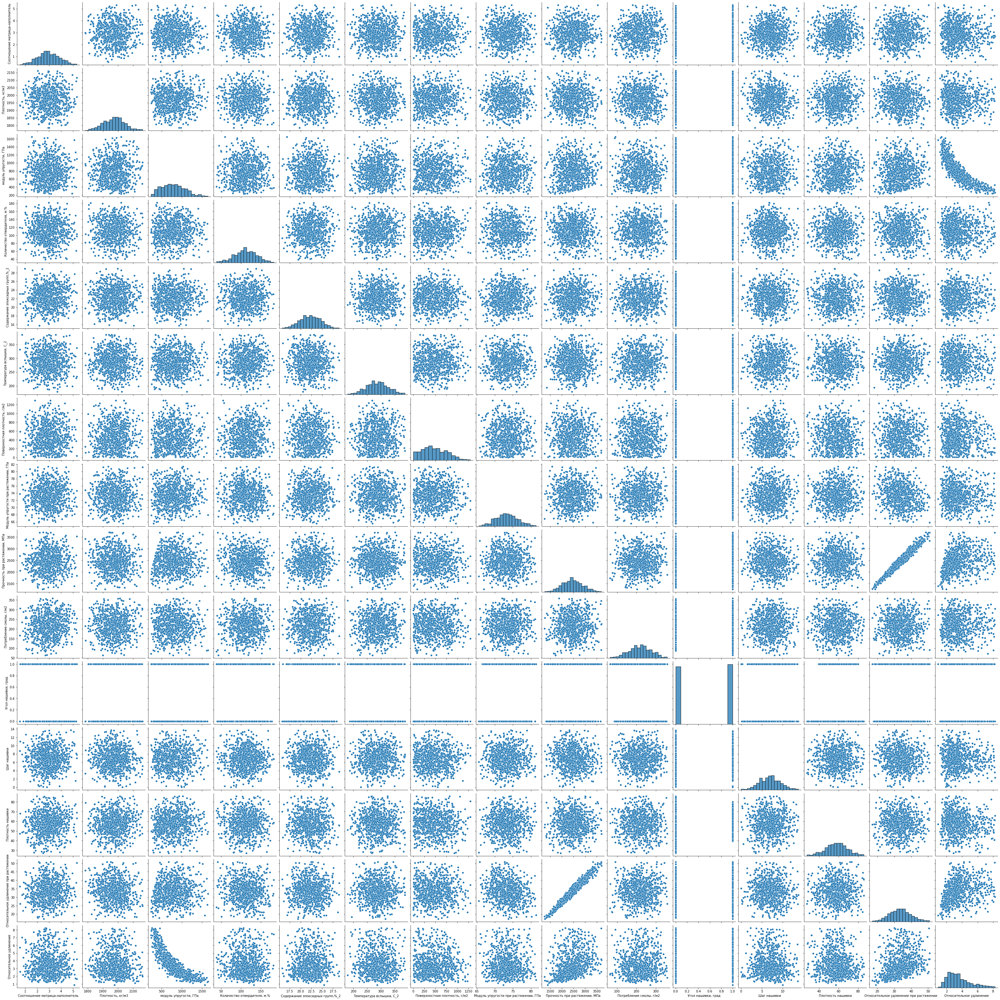

In [165]:
# Попарные графики рассеяния после очистки методом квартилей 
sns.pairplot(df, height=3)

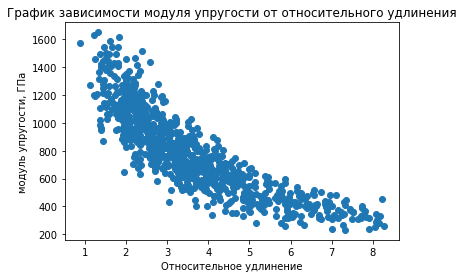

In [192]:
# График зависимости параметра 'модуль упругости, ГПа' от 'Относительное удлинение'

plt.scatter(df['Относительное удлинение'], df['модуль упругости, ГПа'])
plt.title("График зависимости модуля упругости от относительного удлинения")
plt.xlabel("Относительное удлинение")
plt.ylabel("модуль упругости, ГПа")
plt.show()

Оценка нормальности распределения параметров по статистическому критерию д'Агостино:

In [180]:
# Проверка по критерию д'Агостино
accepted_list = []
rejected_list = []

for col in df.columns:
    alpha = 0.05
    stat, p = stats.normaltest(df[col]) # Критерий согласия д'Агостино
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=5.399, p-value=0.067
Плотность, кг/м3 : 	 	 	Statistics=1.816, p-value=0.403
модуль упругости, ГПа : 	 	 	Statistics=24.904, p-value=0.000
Количество отвердителя, м.% : 	 	 	Statistics=3.822, p-value=0.148
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=5.009, p-value=0.082
Температура вспышки, С_2 : 	 	 	Statistics=4.554, p-value=0.103
Поверхностная плотность, г/м2 : 	 	 	Statistics=36.399, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=6.124, p-value=0.047
Прочность при растяжении, МПа : 	 	 	Statistics=2.731, p-value=0.255
Потребление смолы, г/м2 : 	 	 	Statistics=7.972, p-value=0.019
Угол нашивки, град : 	 	 	Statistics=3281.330, p-value=0.000
Шаг нашивки : 	 	 	Statistics=1.352, p-value=0.509
Плотность нашивки : 	 	 	Statistics=2.179, p-value=0.336
Относительное удлинение при растяжении : 	 	 	Statistics=3.699, p-value=0.157
Относительное удлинение : 	 	 	Statistics=98.796, p-value=0.000

Наименование колоно

Вывод: согласно критерию д'Агостино распределение тех же самых параметров до очистки и после очистки статистически значимо не отличается от нормального

Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [181]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.997, p-value=0.124
Плотность, кг/м3 : 	 	 	Statistics=0.997, p-value=0.145
модуль упругости, ГПа : 	 	 	Statistics=0.983, p-value=0.000
Количество отвердителя, м.% : 	 	 	Statistics=0.996, p-value=0.052
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.313
Температура вспышки, С_2 : 	 	 	Statistics=0.997, p-value=0.115
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.996, p-value=0.038
Прочность при растяжении, МПа : 	 	 	Statistics=0.997, p-value=0.144
Потребление смолы, г/м2 : 	 	 	Statistics=0.996, p-value=0.031
Угол нашивки, град : 	 	 	Statistics=0.636, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.282
Плотность нашивки : 	 	 	Statistics=0.997, p-value=0.065
Относительное удлинение при растяжении : 	 	 	Statistics=0.997, p-value=0.055
Относительное удлинение : 	 	 	Statistics=0.927, p-value=0.000

Наименование колонок с да

Вывод: согласно критерию Шапиро-Уилка распределение тех же самых параметров до очистки и после очистки статистически значимо не отличается от нормального, критерий Шапиро-Уилка оказался более чувствительным и позволил установить, что параметр 'модуль упругости, ГПа' статистически значимо отличается от нормального, см. также ниже попарные графики рассеяния после нормализации

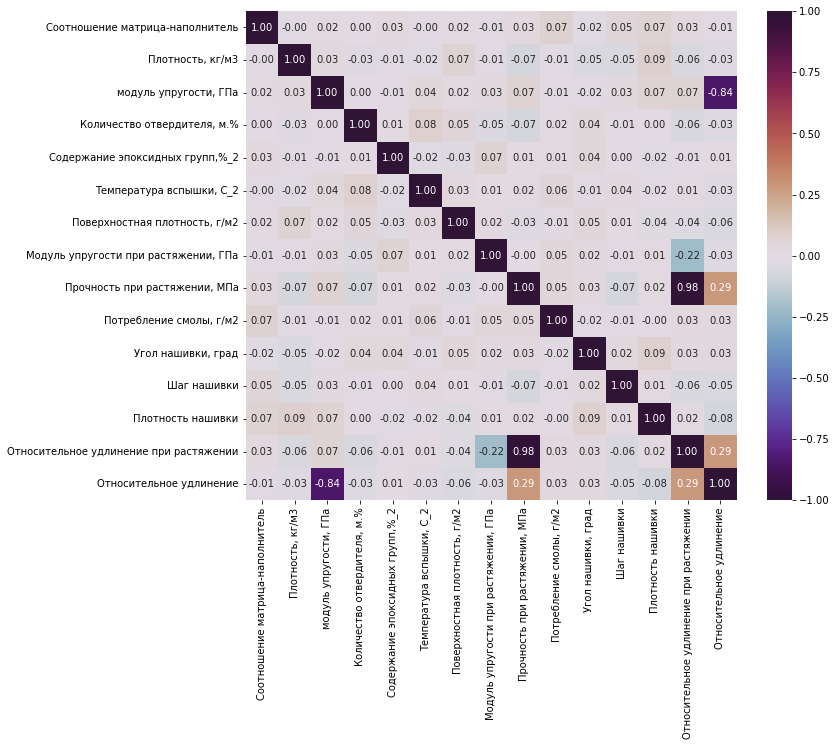

In [182]:
# Матрица корреляции по Пирсону после нормализации
corr = df.corr() # Пирсон по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

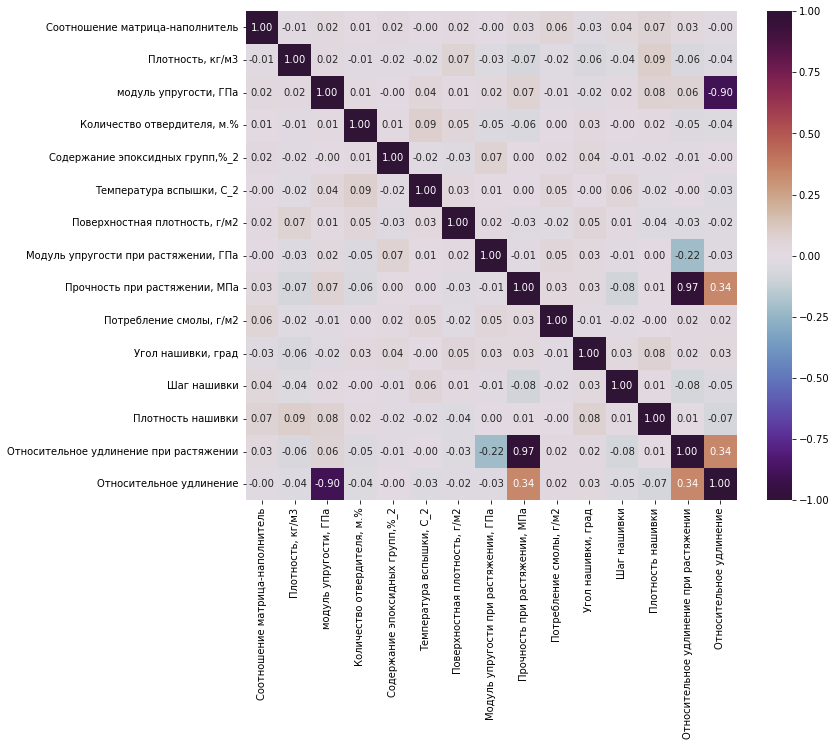

In [183]:
# Матрица корреляции по Спирмену после нормализации
corr = df.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

###### Подготовка к нормализации датасета

In [184]:
# Вывод информации о датасете df для подготовки к нормализации датасета df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 857 entries, 1 to 1022
Data columns (total 15 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         857 non-null    float64
 1   Плотность, кг/м3                        857 non-null    float64
 2   модуль упругости, ГПа                   857 non-null    float64
 3   Количество отвердителя, м.%             857 non-null    float64
 4   Содержание эпоксидных групп,%_2         857 non-null    float64
 5   Температура вспышки, С_2                857 non-null    float64
 6   Поверхностная плотность, г/м2           857 non-null    float64
 7   Модуль упругости при растяжении, ГПа    857 non-null    float64
 8   Прочность при растяжении, МПа           857 non-null    float64
 9   Потребление смолы, г/м2                 857 non-null    float64
 10  Угол нашивки, град                      857 non-null    int32

Примечание.

Квартильная очистка df от выбросов не требуется, датасет уже был очищен ранее при построении моделей регрессии

### 6. Нормализация значений параметров с помощью метода MinMaxScaler

In [185]:
# Загрузка MinMaxScaler из библиотеки sklearn
from sklearn.preprocessing import MinMaxScaler

In [186]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)

In [174]:
# Описательная статистика нормализованного датасета df_norm
df_norm.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
count,857.000000,857.000000,857.000000,857.000000,857.000000,857.000000,857.000000,857.000000,857.000000,857.000000,857.000000,857.000000,857.000000,857.000000,857.000000
mean,0.501449,0.500854,0.393872,0.508002,0.490605,0.515694,0.371899,0.488056,0.491503,0.522327,0.509918,0.501436,0.516436,0.488251,0.366534
std,0.186758,0.187567,0.204701,0.189076,0.180569,0.190742,0.215411,0.192466,0.186366,0.195534,0.500194,0.182447,0.192540,0.190136,0.209960
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.376310,0.364656,0.236834,0.381119,0.368024,0.386321,0.206500,0.357280,0.364317,0.393317,0.000000,0.368102,0.388763,0.358565,0.203604
50%,0.494963,0.510196,0.377720,0.506411,0.488826,0.515610,0.349615,0.486357,0.488152,0.526926,1.000000,0.503324,0.517923,0.484988,0.322122
75%,0.629669,0.624593,0.529880,0.641121,0.623366,0.646398,0.534393,0.615045,0.610337,0.654989,1.000000,0.623942,0.642763,0.610865,0.470866
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


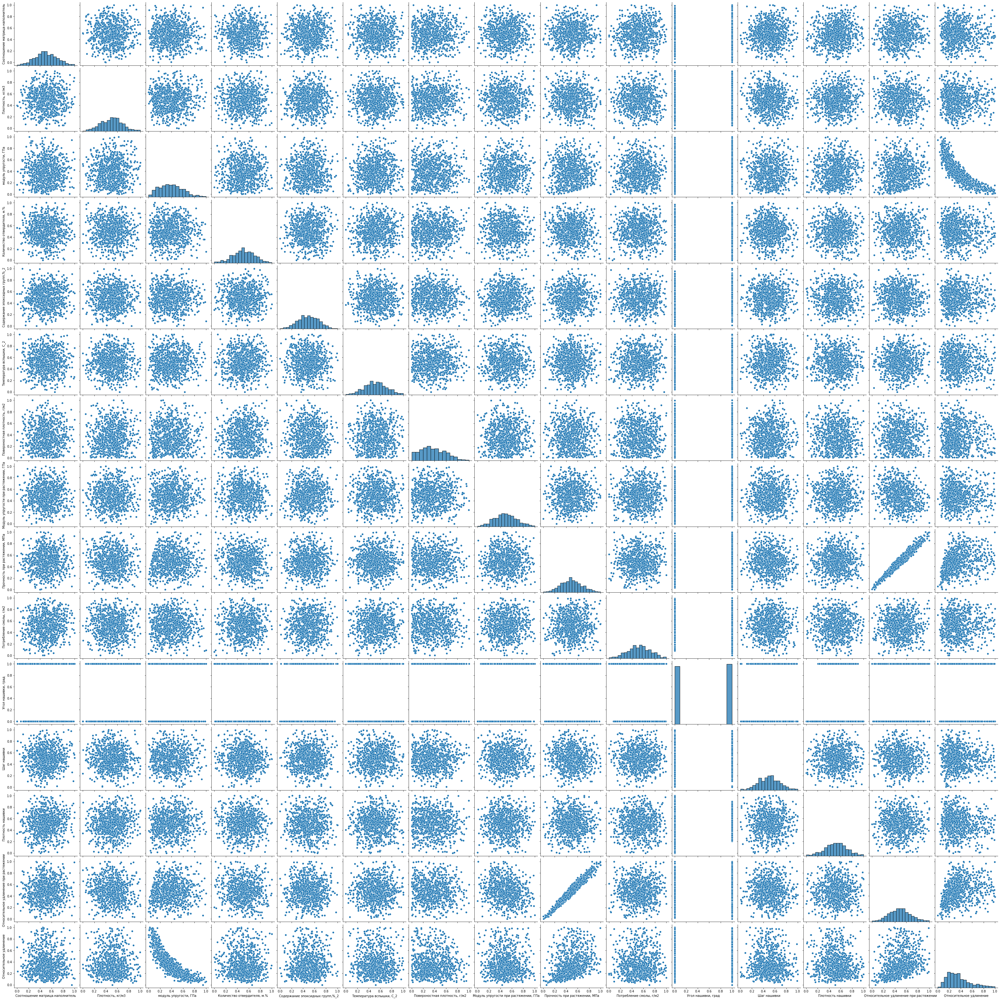

In [175]:
# Попарные графики рассеяния после нормализации
sns.pairplot(df_norm, height=3)

In [176]:
# Параметр 'Угол нашивки, град' - категориальный, поэтому его следует исключить 
# при построении матрицы корреляции по критерию Пирсона
df_dnorm=df_norm[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки', 'Относительное удлинение при растяжении', 'Относительное удлинение']]
df_dnorm

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
1,0.274141,0.651097,0.357611,0.079153,0.607435,0.509164,0.162230,0.280303,0.712590,0.529221,0.289334,0.557156,0.763662,0.430262
3,0.274141,0.651097,0.357611,0.630983,0.418887,0.583596,0.162230,0.280303,0.712590,0.529221,0.362355,0.335840,0.763662,0.430262
4,0.466091,0.651097,0.367672,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.362355,0.506083,0.763662,0.419851
5,0.465375,0.571539,0.364145,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.362355,0.557156,0.763662,0.423456
6,0.423738,0.332865,0.405764,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.362355,0.727399,0.763662,0.383769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.361111,0.444480,0.480434,0.337550,0.333908,0.703458,0.161609,0.475147,0.463043,0.207613,0.660014,0.336177,0.460943,0.234581
1019,0.607335,0.704373,0.150222,0.749605,0.294428,0.362087,0.271207,0.464422,0.452087,0.182974,0.768759,0.450768,0.452253,0.598965
1020,0.573022,0.498274,0.130544,0.501991,0.623085,0.334063,0.572959,0.578740,0.575296,0.585446,0.301102,0.687046,0.549120,0.745263
1021,0.662205,0.748688,0.359543,0.717585,0.267818,0.466417,0.496511,0.535142,0.334513,0.451779,0.458245,0.527552,0.321926,0.258788


###### Оценка корреляции параметров датасета после очистки и нормализации

Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [177]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.997, p-value=0.124
Плотность, кг/м3 : 	 	 	Statistics=0.997, p-value=0.146
модуль упругости, ГПа : 	 	 	Statistics=0.983, p-value=0.000
Количество отвердителя, м.% : 	 	 	Statistics=0.996, p-value=0.052
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.313
Температура вспышки, С_2 : 	 	 	Statistics=0.997, p-value=0.115
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.996, p-value=0.038
Прочность при растяжении, МПа : 	 	 	Statistics=0.997, p-value=0.144
Потребление смолы, г/м2 : 	 	 	Statistics=0.996, p-value=0.031
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.282
Плотность нашивки : 	 	 	Statistics=0.997, p-value=0.065
Относительное удлинение при растяжении : 	 	 	Statistics=0.997, p-value=0.055
Относительное удлинение : 	 	 	Statistics=0.927, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Вывод: после очистки и нормализации по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Потребление смолы, г/м2', 'Относительное удлинение'имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05)

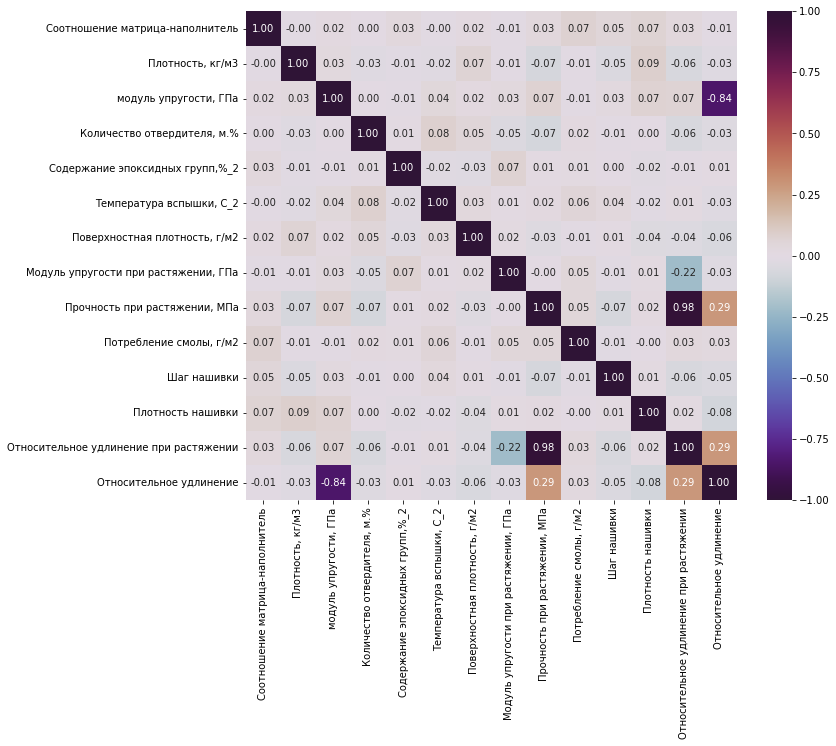

In [178]:
# Матрица корреляции по Пирсону после нормализации
corr = df_dnorm.corr() # Пирсон по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Проверка корреляции по критерию Пирсона:

формулировка гипотезы:

H0: R = 0,

H1: R не равен 0 с заданным уровнем значимости равным 0,05/

In [173]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col], df_dnorm[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.075, p-value=0.028


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Плотность нашивки : 		 
Statistics=0.068, p-value=0.047



2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.069, p-value=0.042



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.089, p-value=0.009



3
модуль упругости, ГПа






Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Прочность при растяжении, МПа : 		 
Statistics=0.074, p-value=0.031



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.073, p-value=0.033


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относитель

Вывод: статистически значимыми по критерию Пирсона после очистки стали следующие попарные корреляции между количественными параметрами:
    
    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.075, p-value=0.028
    Соотношение матрица-наполнитель  &  Плотность нашивки : Statistics=0.068, p-value=0.047
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.069, p-value=0.042
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.089, p-value=0.009
    модуль упругости, ГПа  &  Прочность при растяжении, МПа : Statistics=0.074, p-value=0.031
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.033
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.844, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.079, p-value=0.021
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.071, p-value=0.039
    Содержание эпоксидных групп,%_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.071, p-value=0.037
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Шаг нашивки : Statistics=-0.068, p-value=0.048
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.976, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.289, p-value=0.000
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.080, p-value=0.019
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.288, p-value=0.000

Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.977, p-value=0.000             

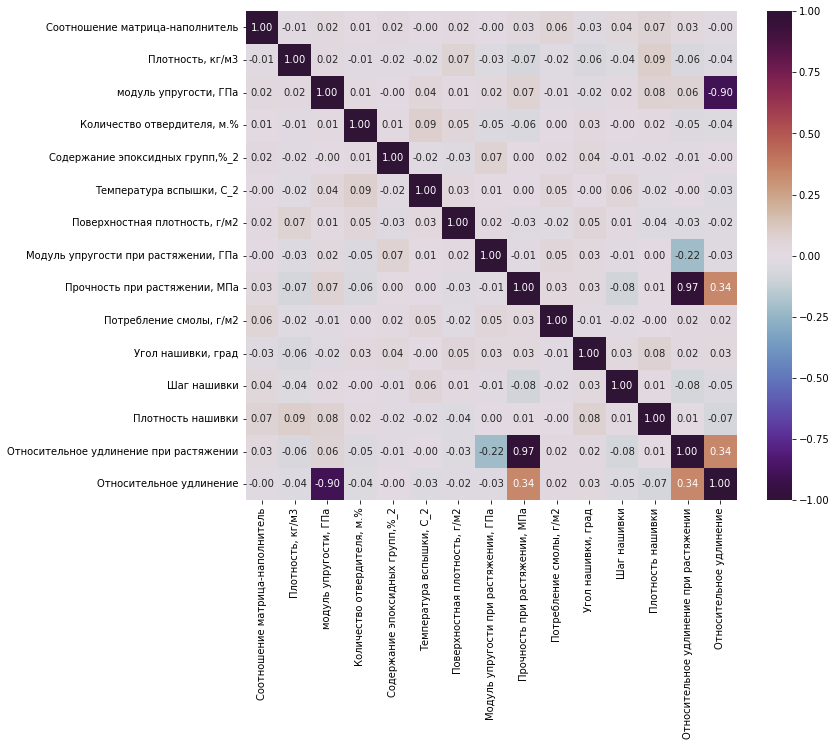

In [174]:
# Матрица корреляции по Спирмену после нормализации
corr = df_norm.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Проверка корреляции по критерию Спирмена:

формулировка гипотезы: 

H0: R = 0, 

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [175]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in df_norm.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(df_norm['Угол нашивки, град'] , df_norm[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.025, p-value=0.457
Плотность, кг/м3 : 	 	 	Statistics=-0.061, p-value=0.073
модуль упругости, ГПа : 	 	 	Statistics=-0.024, p-value=0.474
Количество отвердителя, м.% : 	 	 	Statistics=0.034, p-value=0.323
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.036, p-value=0.287
Температура вспышки, С_2 : 	 	 	Statistics=-0.002, p-value=0.964
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.051, p-value=0.134
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.027, p-value=0.438
Прочность при растяжении, МПа : 	 	 	Statistics=0.027, p-value=0.426
Потребление смолы, г/м2 : 	 	 	Statistics=-0.008, p-value=0.821
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.028, p-value=0.417
Плотность нашивки : 	 	 	Statistics=0.077, p-value=0.024
Относительное удлинение при растяжении : 	 	 	Statistics=0.021, p-value=0.536
Относительное удлинение : 	 	 	Statistics=0.025, p-value=0.460

Наименование колонок

Вывод: согласно критерию Спирмена корреляция тех же самых параметров до очистки и после очистки статистически значима 

Ранее было показано, что по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Потребление смолы, г/м2', 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, поэтому корреляцию этих парметров между собой и с остальными параметрами следует проверять по критерию Спирмена:

In [176]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[col], df_norm[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель















2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.068, p-value=0.045


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.067, p-value=0.049




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.092, p-value=0.007



3
модуль упругости, ГПа






Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Прочность при растяжении, МПа : 		 
Statistics=0.072, p-value=0.034




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.078, p-value=0.023


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.896, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество о

Вывод: кроме того, для параметров 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Потребление смолы, г/м2', 'Относительное удлинение' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.068, p-value=0.045
    модуль упругости, ГПа  &  Прочность при растяжении, МПа : Statistics=0.072, p-value=0.034
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.078, p-value=0.023
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.896, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.339, p-value=0.000
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.069, p-value=0.043
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.338, p-value=0.000
        
Статистически значимыми по критерию Спирмена до очистки и нормализации были следующие попарные корреляции между параметрами:
    

    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.020
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.911, p-value=0.000
    Угол нашивки, град  &  Плотность нашивки : Statistics=0.101, p-value=0.001
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.332, p-value=0.000
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.063, p-value=0.043
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.327, p-value=0.000

ОБЩИЙ ВЫВОД ПО КОРРЕЛЯЦИИ: судя по матрицам корреляции, построенным на основании корреляции по Пирсону для количественных данных и Спирмена для количественных и категориальных данных, коэффициенты корреляции после очистки от выбросов и нормализации параметров мало изменились, кроме как для параметра 'модуль упругости, ГПа, который теперь явно нелинейно детерминированно связан с параметром 'Относительное удлинение', но проявилась значимость еще нескольких корреляционных зависимостей (например между модуль упругости, ГПа  &  Прочность при растяжении, МПа), поэтому следует разбить датасет на несколько частей и проанализировать каждую часть отдельно

###### Разбиение датасета на части и проверка значимости корреляций в каждой части датасета

In [177]:
# Вывод информации о датасете df_dnorm
df_dnorm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 857 entries, 1 to 1022
Data columns (total 14 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Соотношение матрица-наполнитель         857 non-null    float64
 1   Плотность, кг/м3                        857 non-null    float64
 2   модуль упругости, ГПа                   857 non-null    float64
 3   Количество отвердителя, м.%             857 non-null    float64
 4   Содержание эпоксидных групп,%_2         857 non-null    float64
 5   Температура вспышки, С_2                857 non-null    float64
 6   Поверхностная плотность, г/м2           857 non-null    float64
 7   Модуль упругости при растяжении, ГПа    857 non-null    float64
 8   Прочность при растяжении, МПа           857 non-null    float64
 9   Потребление смолы, г/м2                 857 non-null    float64
 10  Шаг нашивки                             857 non-null    float

In [178]:
# 1-ая часть датасета
df_dnorm[0:214].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
1,0.274141,0.651097,0.357611,0.079153,0.607435,0.509164,0.16223,0.280303,0.71259,0.529221,0.289334,0.557156,0.763662,0.430262
3,0.274141,0.651097,0.357611,0.630983,0.418887,0.583596,0.16223,0.280303,0.71259,0.529221,0.362355,0.335840,0.763662,0.430262
4,0.466091,0.651097,0.367672,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.362355,0.506083,0.763662,0.419851
5,0.465375,0.571539,0.364145,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.362355,0.557156,0.763662,0.423456
6,0.423738,0.332865,0.405764,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.362355,0.727399,0.763662,0.383769


In [179]:
# 2-ая часть датасета
df_dnorm[215:429].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
263,0.542417,0.523834,0.411141,0.368995,0.544269,0.431215,0.623313,0.475558,0.381377,0.459180,0.742003,0.567910,0.379408,0.243949
265,0.277773,0.519208,0.679065,0.632808,0.439393,0.589051,0.127968,0.312930,0.622957,0.594472,0.675736,0.042100,0.661657,0.195627
266,0.512506,0.497753,0.609169,0.362728,0.284730,0.301785,0.404936,0.843674,0.702192,0.420383,0.994274,0.644884,0.609985,0.248160
267,0.261850,0.605092,0.258068,0.134683,0.731144,0.828264,0.539473,0.352307,0.637666,0.556051,0.511575,0.483306,0.666452,0.518386
268,0.392048,0.376704,0.587124,0.417284,0.694324,0.443903,0.067466,0.768765,0.254029,0.600824,0.348042,0.896484,0.206856,0.118997


In [180]:
# 3-ья часть датасета
df_dnorm[430:644].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
528,0.615352,0.498135,0.643634,0.664659,0.555379,0.696861,0.000825,0.259397,0.173436,0.346007,0.486732,0.465023,0.205534,0.078901
531,0.462348,0.327436,0.568318,0.230481,0.518342,0.312774,0.158097,0.320293,0.302933,0.397655,0.218839,0.077017,0.329420,0.140787
532,0.591688,0.533590,0.887879,0.262562,0.371781,0.794086,0.152343,0.487331,0.323379,0.452354,0.588937,0.603083,0.319448,0.066271
533,0.238039,0.171678,0.507362,0.066594,0.428433,0.748222,0.019393,0.441006,0.888102,0.546019,0.899383,0.482539,0.895313,0.368898
534,0.697354,0.345998,0.333550,0.896084,0.576050,0.131071,0.318591,0.643180,0.457580,0.772862,0.526977,0.558759,0.421562,0.336604


In [181]:
# 4-ая часть датасета
df_dnorm[645:857].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,Относительное удлинение при растяжении,Относительное удлинение
777,0.450302,0.446523,0.426686,0.743309,0.480688,0.253881,0.045838,0.597410,0.748800,0.701614,0.621619,0.542984,0.713527,0.380314
778,0.291805,0.882299,0.165863,0.694383,0.783222,0.740318,0.218459,0.222576,0.623552,0.789582,0.481070,0.549022,0.686570,0.686887
779,0.337607,0.610380,0.523698,0.456653,0.636974,0.567304,0.516897,0.581970,0.434054,0.526442,0.399099,0.543927,0.410708,0.202408
780,0.772542,0.624281,0.171208,0.521027,0.457662,0.448716,0.613586,0.472187,0.311558,0.400101,0.280693,0.742788,0.310374,0.455502
781,0.485381,0.761909,0.430395,0.818947,0.502229,0.401968,0.335362,0.628055,0.586183,0.259055,0.348953,0.666837,0.548669,0.313008


Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [182]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[0:214].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[0:214][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.990, p-value=0.161
Плотность, кг/м3 : 	 	 	Statistics=0.995, p-value=0.700
модуль упругости, ГПа : 	 	 	Statistics=0.980, p-value=0.004
Количество отвердителя, м.% : 	 	 	Statistics=0.987, p-value=0.054
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.996, p-value=0.898
Температура вспышки, С_2 : 	 	 	Statistics=0.995, p-value=0.671
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.973, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.990, p-value=0.142
Прочность при растяжении, МПа : 	 	 	Statistics=0.994, p-value=0.537
Потребление смолы, г/м2 : 	 	 	Statistics=0.993, p-value=0.373
Шаг нашивки : 	 	 	Statistics=0.994, p-value=0.479
Плотность нашивки : 	 	 	Statistics=0.979, p-value=0.003
Относительное удлинение при растяжении : 	 	 	Statistics=0.995, p-value=0.626
Относительное удлинение : 	 	 	Statistics=0.927, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [183]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[215:429].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[215:429][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.997, p-value=0.984
Плотность, кг/м3 : 	 	 	Statistics=0.990, p-value=0.139
модуль упругости, ГПа : 	 	 	Statistics=0.982, p-value=0.008
Количество отвердителя, м.% : 	 	 	Statistics=0.995, p-value=0.731
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.993, p-value=0.465
Температура вспышки, С_2 : 	 	 	Statistics=0.986, p-value=0.037
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.972, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.991, p-value=0.241
Прочность при растяжении, МПа : 	 	 	Statistics=0.991, p-value=0.216
Потребление смолы, г/м2 : 	 	 	Statistics=0.990, p-value=0.159
Шаг нашивки : 	 	 	Statistics=0.993, p-value=0.459
Плотность нашивки : 	 	 	Statistics=0.987, p-value=0.050
Относительное удлинение при растяжении : 	 	 	Statistics=0.994, p-value=0.537
Относительное удлинение : 	 	 	Statistics=0.920, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [184]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[430:644].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[430:644][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.991, p-value=0.224
Плотность, кг/м3 : 	 	 	Statistics=0.991, p-value=0.244
модуль упругости, ГПа : 	 	 	Statistics=0.968, p-value=0.000
Количество отвердителя, м.% : 	 	 	Statistics=0.994, p-value=0.531
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.992, p-value=0.322
Температура вспышки, С_2 : 	 	 	Statistics=0.995, p-value=0.675
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.975, p-value=0.001
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.993, p-value=0.375
Прочность при растяжении, МПа : 	 	 	Statistics=0.995, p-value=0.655
Потребление смолы, г/м2 : 	 	 	Statistics=0.988, p-value=0.082
Шаг нашивки : 	 	 	Statistics=0.992, p-value=0.258
Плотность нашивки : 	 	 	Statistics=0.994, p-value=0.616
Относительное удлинение при растяжении : 	 	 	Statistics=0.996, p-value=0.796
Относительное удлинение : 	 	 	Statistics=0.943, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

In [185]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[645:857].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[645:857][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.994, p-value=0.585
Плотность, кг/м3 : 	 	 	Statistics=0.995, p-value=0.653
модуль упругости, ГПа : 	 	 	Statistics=0.984, p-value=0.015
Количество отвердителя, м.% : 	 	 	Statistics=0.995, p-value=0.734
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.993, p-value=0.429
Температура вспышки, С_2 : 	 	 	Statistics=0.995, p-value=0.736
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.973, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.991, p-value=0.223
Прочность при растяжении, МПа : 	 	 	Statistics=0.992, p-value=0.261
Потребление смолы, г/м2 : 	 	 	Statistics=0.992, p-value=0.293
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.998
Плотность нашивки : 	 	 	Statistics=0.993, p-value=0.387
Относительное удлинение при растяжении : 	 	 	Statistics=0.987, p-value=0.055
Относительное удлинение : 	 	 	Statistics=0.904, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-н

Вывод: при рассмотрении отдельных частей датасета установлено, что:

параметры 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Плотность нашивки', 'Относительное удлинение' в 1-ой части датасета, 

параметры 'модуль упругости, ГПа', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Относительное удлинение' во 2-ой части датасета,

параметры 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Относительное удлинение' в 3-ьей части датасета,

параметры 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Относительное удлинение' в 4-ой части датасета

Проверка различия групп по непараметрическому критерию Краскала-Уоллиса для групп больше двух:

Формулируем статистическую гипотезу для выявления различия групп по критерию Краскала-Уоллиса

H0: Статистически значимые отличия в группах отсутствуют с уровнем значимости равным 0,05.

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости

In [186]:
# проверка по критерию Краскала-Уоллиса
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:214][col])
    df2=np.array(df_dnorm[215:429][col])
    df3=np.array(df_dnorm[430:644][col])
    df4=np.array(df_dnorm[645:859][col])
    
    stat, p = stats.mstats.kruskalwallis(df1, df2, df3, df4) # критерий Краскала-Уоллиса 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=1.677, p-value=0.642
Плотность, кг/м3 : 	 	 	Statistics=4.262, p-value=0.235
модуль упругости, ГПа : 	 	 	Statistics=1.456, p-value=0.693
Количество отвердителя, м.% : 	 	 	Statistics=2.735, p-value=0.434
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=2.619, p-value=0.454
Температура вспышки, С_2 : 	 	 	Statistics=1.866, p-value=0.601
Поверхностная плотность, г/м2 : 	 	 	Statistics=1.072, p-value=0.784
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=3.642, p-value=0.303
Прочность при растяжении, МПа : 	 	 	Statistics=2.874, p-value=0.412
Потребление смолы, г/м2 : 	 	 	Statistics=1.454, p-value=0.693
Шаг нашивки : 	 	 	Statistics=1.148, p-value=0.766
Плотность нашивки : 	 	 	Statistics=3.855, p-value=0.278
Относительное удлинение при растяжении : 	 	 	Statistics=3.126, p-value=0.373
Относительное удлинение : 	 	 	Statistics=2.565, p-value=0.464

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Непараметрический критерий Фридмана для дисперсионного анализа групп:


Нулевая гипотеза (H 0 ): Среднее значение для каждой совокупности равно.

Альтернативная гипотеза: (H 1): по крайней мере одно среднее значение генеральной совокупности отличается от остальных

In [187]:
# проверка по критерию Фридмана
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:213].reset_index(drop=True)[col])
    df2=np.array(df_dnorm[214:427].reset_index(drop=True)[col])
    df3=np.array(df_dnorm[428:641].reset_index(drop=True)[col])
    df4=np.array(df_dnorm[642:855].reset_index(drop=True)[col])
    
    stat, p = stats.friedmanchisquare(df1, df2, df3, df4) # критерий Фридмана 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=1.265, p-value=0.738
Плотность, кг/м3 : 	 	 	Statistics=2.335, p-value=0.506
модуль упругости, ГПа : 	 	 	Statistics=1.028, p-value=0.794
Количество отвердителя, м.% : 	 	 	Statistics=2.076, p-value=0.557
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=2.532, p-value=0.469
Температура вспышки, С_2 : 	 	 	Statistics=1.992, p-value=0.574
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.792, p-value=0.851
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=3.834, p-value=0.280
Прочность при растяжении, МПа : 	 	 	Statistics=4.442, p-value=0.217
Потребление смолы, г/м2 : 	 	 	Statistics=2.177, p-value=0.536
Шаг нашивки : 	 	 	Statistics=1.377, p-value=0.711
Плотность нашивки : 	 	 	Statistics=7.355, p-value=0.061
Относительное удлинение при растяжении : 	 	 	Statistics=5.344, p-value=0.148
Относительное удлинение : 	 	 	Statistics=1.141, p-value=0.767

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Вывод: сравнение датасетов по столбцам показывает, что отличие групп статистически незначимо, расчет по критерию Фридмана для всего датасета показывает, что различие по дисперсиям все-таки возможно значимо:

In [188]:
stats.friedmanchisquare(df_dnorm[0:213],df_dnorm[214:427],df_dnorm[428:641],df_dnorm[642:855])

FriedmanchisquareResult(statistic=492220903.0973684, pvalue=0.0)

In [189]:
stats.friedmanchisquare(df_dnorm[0:213],df_dnorm[214:427],df_dnorm[428:641])

FriedmanchisquareResult(statistic=-58579264.42538975, pvalue=1.0)

In [190]:
stats.friedmanchisquare(df_dnorm[0:213],df_dnorm[428:641],df_dnorm[642:855])

FriedmanchisquareResult(statistic=-58599877.3518931, pvalue=1.0)

In [191]:
stats.friedmanchisquare(df_dnorm[0:213],df_dnorm[214:427],df_dnorm[642:855])

FriedmanchisquareResult(statistic=-58632914.251670375, pvalue=1.0)

In [192]:
stats.friedmanchisquare(df_dnorm[214:427],df_dnorm[428:641],df_dnorm[642:855])

FriedmanchisquareResult(statistic=61853075.042253524, pvalue=0.0)

Статистическое сравнение 2х групп следует осуществить по критерию Колмогорова-Смирнова.

Формулировка гипотезы по критерию Колмогорова-Смирнова:

H0: Статистически значимые отличия в группах отсутствуют (уровень значимости равен 0,05).

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости.

In [193]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:214][col])
    df2=np.array(df_dnorm[215:][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.058, p-value=0.650
Плотность, кг/м3 : 	 	 	Statistics=0.050, p-value=0.811
модуль упругости, ГПа : 	 	 	Statistics=0.092, p-value=0.129
Количество отвердителя, м.% : 	 	 	Statistics=0.073, p-value=0.348
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.086, p-value=0.184
Температура вспышки, С_2 : 	 	 	Statistics=0.092, p-value=0.129
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.064, p-value=0.520
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.081, p-value=0.237
Прочность при растяжении, МПа : 	 	 	Statistics=0.061, p-value=0.584
Потребление смолы, г/м2 : 	 	 	Statistics=0.081, p-value=0.237
Шаг нашивки : 	 	 	Statistics=0.089, p-value=0.155
Плотность нашивки : 	 	 	Statistics=0.165, p-value=0.000
Относительное удлинение при растяжении : 	 	 	Statistics=0.058, p-value=0.650
Относительное удлинение : 	 	 	Statistics=0.069, p-value=0.429

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

In [194]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[215:429][col])
    df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.050, p-value=0.795
Плотность, кг/м3 : 	 	 	Statistics=0.104, p-value=0.059
модуль упругости, ГПа : 	 	 	Statistics=0.043, p-value=0.914
Количество отвердителя, м.% : 	 	 	Statistics=0.077, p-value=0.280


C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inst

Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.057, p-value=0.641
Температура вспышки, С_2 : 	 	 	Statistics=0.094, p-value=0.105
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.039, p-value=0.961
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.062, p-value=0.539
Прочность при растяжении, МПа : 	 	 	Statistics=0.043, p-value=0.912
Потребление смолы, г/м2 : 	 	 	Statistics=0.061, p-value=0.554
Шаг нашивки : 	 	 	Statistics=0.067, p-value=0.444
Плотность нашивки : 	 	 	Statistics=0.121, p-value=0.016
Относительное удлинение при растяжении : 	 	 	Statistics=0.046, p-value=0.867
Относительное удлинение : 	 	 	Statistics=0.061, p-value=0.559

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочно

C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inst

In [195]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[430:644][col])
    df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])


Соотношение матрица-наполнитель : 	 	 	Statistics=0.053, p-value=0.740
Плотность, кг/м3 : 	 	 	Statistics=0.061, p-value=0.568
модуль упругости, ГПа : 	 	 	Statistics=0.062, p-value=0.552
Количество отвердителя, м.% : 	 	 	Statistics=0.056, p-value=0.674
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.056, p-value=0.670
Температура вспышки, С_2 : 	 	 	Statistics=0.059, p-value=0.606
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.054, p-value=0.715


C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.086, p-value=0.174


C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])


Прочность при растяжении, МПа : 	 	 	Statistics=0.070, p-value=0.395
Потребление смолы, г/м2 : 	 	 	Statistics=0.060, p-value=0.572
Шаг нашивки : 	 	 	Statistics=0.052, p-value=0.748
Плотность нашивки : 	 	 	Statistics=0.144, p-value=0.002
Относительное удлинение при растяжении : 	 	 	Statistics=0.070, p-value=0.395
Относительное удлинение : 	 	 	Statistics=0.071, p-value=0.366

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 'Шаг нашивки', 'Относительное удлинение при растяжении', 'Относительное удлинение'] 

Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : ['Плотность нашивки']


C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_3344\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

In [196]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:644][col])
    df2=np.array(df_dnorm[645:][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.068, p-value=0.420
Плотность, кг/м3 : 	 	 	Statistics=0.118, p-value=0.022
модуль упругости, ГПа : 	 	 	Statistics=0.069, p-value=0.411
Количество отвердителя, м.% : 	 	 	Statistics=0.050, p-value=0.790
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.053, p-value=0.738
Температура вспышки, С_2 : 	 	 	Statistics=0.065, p-value=0.496
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.062, p-value=0.547
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.043, p-value=0.913
Прочность при растяжении, МПа : 	 	 	Statistics=0.075, p-value=0.318
Потребление смолы, г/м2 : 	 	 	Statistics=0.038, p-value=0.964
Шаг нашивки : 	 	 	Statistics=0.055, p-value=0.702
Плотность нашивки : 	 	 	Statistics=0.134, p-value=0.006
Относительное удлинение при растяжении : 	 	 	Statistics=0.078, p-value=0.273
Относительное удлинение : 	 	 	Statistics=0.069, p-value=0.408

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : 

Вывод: попарное различие групп по непараметрическому критерию Колмогорова-Смирнова наблюдается по параметру 'Плотность нашивки'

Однофакторный дисперсионный анализ использует следующие нулевую и альтернативную гипотезы :

    H 0 (нулевая гипотеза): µ 1 = µ 2 = µ 3 = … = µ k (все средние значения совокупности равны)
    H 1 (нулевая гипотеза): по крайней мере одно среднее значение популяции отличаетсяот остальных


Чтобы результаты однофакторного дисперсионного анализа были достоверными, должны выполняться следующие допущения:
1. Нормальность. Каждая выборка была взята из нормально распределенной популяции.
2. Равные дисперсии — дисперсии совокупностей, из которых взяты выборки, равны. Вы можете использовать тест Бартлетта, чтобы проверить это предположение.
3. Независимость.Наблюдения в каждой группе независимы друг от друга, а наблюдения внутри групп были получены путем случайной выборки.    


Тест Бартлетта использует следующие нулевые и альтернативные гипотезы :

H 0 : Дисперсия среди каждой группы равна.

H 1 : По крайней мере, одна группа имеет дисперсию, не равную остальным.

In [197]:
# Проверка по критериям ANOVA & Baltlet-test
for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:214][col])
    df2=np.array(df_dnorm[215:429][col])
    df3=np.array(df_dnorm[430:644][col])
    df4=np.array(df_dnorm[645:859][col])
    stat1, bart_test = stats.bartlett(df1, df2, df3, df4)
    stat2, fish_test = f_oneway(df1, df2, df3, df4)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))

Соотношение матрица-наполнитель : 	 	 	Statistics Bartlet=3.057, p-value=0.383
Соотношение матрица-наполнитель : 	 	 	Statistics F-test=0.800, p-value=0.494
Плотность, кг/м3 : 	 	 	Statistics Bartlet=8.870, p-value=0.031
Плотность, кг/м3 : 	 	 	Statistics F-test=0.960, p-value=0.411
модуль упругости, ГПа : 	 	 	Statistics Bartlet=7.201, p-value=0.066
модуль упругости, ГПа : 	 	 	Statistics F-test=0.883, p-value=0.449
Количество отвердителя, м.% : 	 	 	Statistics Bartlet=3.554, p-value=0.314
Количество отвердителя, м.% : 	 	 	Statistics F-test=0.858, p-value=0.462
Содержание эпоксидных групп,%_2 : 	 	 	Statistics Bartlet=2.103, p-value=0.551
Содержание эпоксидных групп,%_2 : 	 	 	Statistics F-test=1.067, p-value=0.362
Температура вспышки, С_2 : 	 	 	Statistics Bartlet=0.651, p-value=0.885
Температура вспышки, С_2 : 	 	 	Statistics F-test=0.743, p-value=0.526
Поверхностная плотность, г/м2 : 	 	 	Statistics Bartlet=1.336, p-value=0.721
Поверхностная плотность, г/м2 : 	 	 	Statistics F-tes

Вывод: дисперсии статистически не различаются

Корреляционные матрицы для частей датасета:

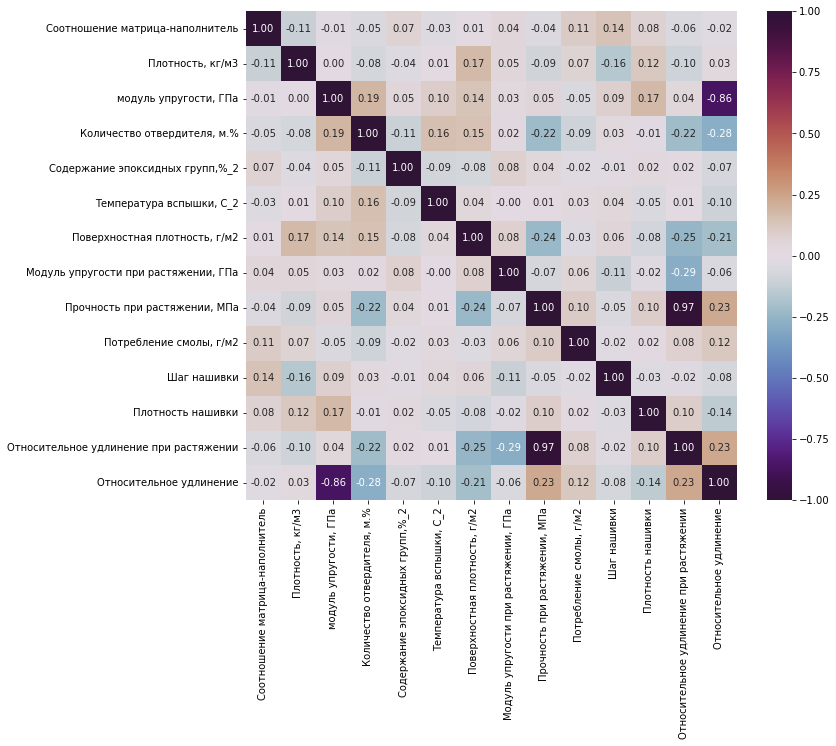

In [198]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[0:214].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [199]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[0:214].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[0:214].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][0:214], df_dnorm[col1][0:214]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=0.145, p-value=0.035




2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.175, p-value=0.010




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Шаг нашивки : 		 
Statistics=-0.162, p-value=0.018




3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.185, p-value=0.007



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.136, p-value=0.046





Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.175, p-value=0.010


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		

Выводы: статистически значимыми по критерию Пирсона после очистки для 1-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:
    
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.145, p-value=0.035
    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.175, p-value=0.010
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.162, p-value=0.018
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.185, p-value=0.007
    модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : Statistics=0.136, p-value=0.046
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.175, p-value=0.010
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.863, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.155, p-value=0.023
    Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : Statistics=0.146, p-value=0.033
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.221, p-value=0.001
    Количество отвердителя, м.%  &  Относительное удлинение при растяжении : Statistics=-0.218, p-value=0.001
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.281, p-value=0.000
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.238, p-value=0.000
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.246, p-value=0.000
    Поверхностная плотность, г/м2  &  Относительное удлинение : Statistics=-0.207, p-value=0.002
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.286, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.975, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.228, p-value=0.001
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.140, p-value=0.041
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.232, p-value=0.001
    
или:

    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.145, p-value=0.035
    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.175, p-value=0.010
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.162, p-value=0.018
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.185, p-value=0.007
    модуль упругости, ГПа  &  Поверхностная плотность, г/м2 : Statistics=0.136, p-value=0.046
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.175, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.155, p-value=0.023
    Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : Statistics=0.146, p-value=0.033
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.221, p-value=0.001
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.238, p-value=0.000



Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000 
    
    
или:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016


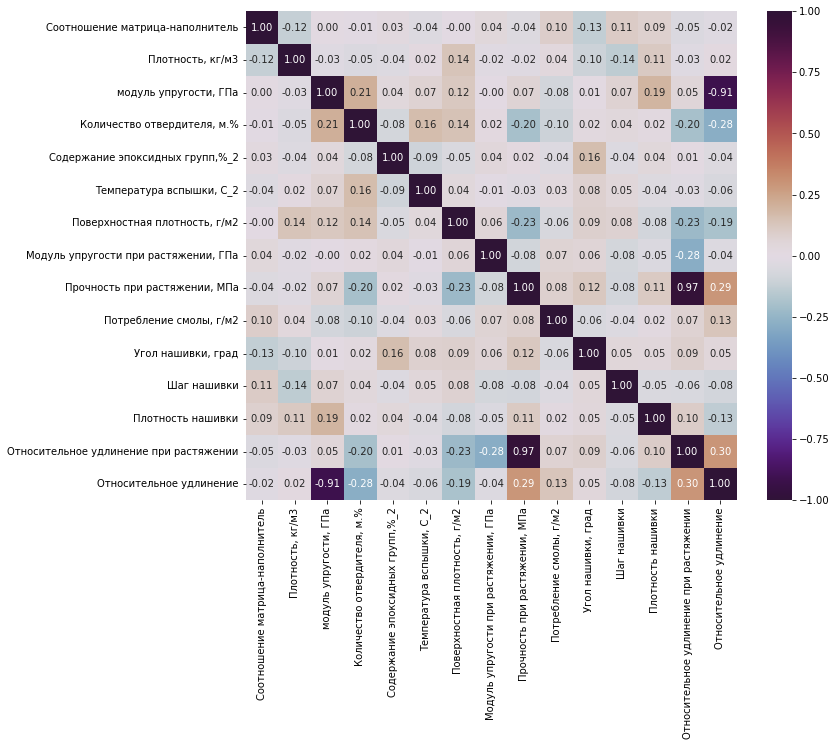

In [200]:
# Матрица корреляции по Спирмену
df1 = df_norm[0:214]
corr = df1.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [201]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[0:214].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[0:214].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[0:214][col], df_norm[0:214][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель















2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.136, p-value=0.046





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Шаг нашивки : 		 
Statistics=-0.141, p-value=0.040




3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.208, p-value=0.002









Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.192, p-value=0.005


Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.914, p-value=0.000

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.162, p-value=0.017

Наименование колонок и строк С корреляцией: 
Количество от

Вывод: в 1-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.136, p-value=0.046
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.141, p-value=0.040
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.208, p-value=0.002
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.192, p-value=0.005
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.914, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.162, p-value=0.017
    Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : Statistics=0.142, p-value=0.038
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.196, p-value=0.004
    Количество отвердителя, м.%  &  Относительное удлинение при растяжении : Statistics=-0.196, p-value=0.004
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=-0.279, p-value=0.000
    Содержание эпоксидных групп,%_2  &  Угол нашивки, град : Statistics=0.161, p-value=0.019
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.230, p-value=0.001
    Поверхностная плотность, г/м2  &  Относительное удлинение при растяжении : Statistics=-0.230, p-value=0.001
    Поверхностная плотность, г/м2  &  Относительное удлинение : Statistics=-0.189, p-value=0.006
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.283, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.973, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.292, p-value=0.000
    Плотность нашивки  &  Относительное удлинение : Statistics=-0.134, p-value=0.050
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.295, p-value=0.000   

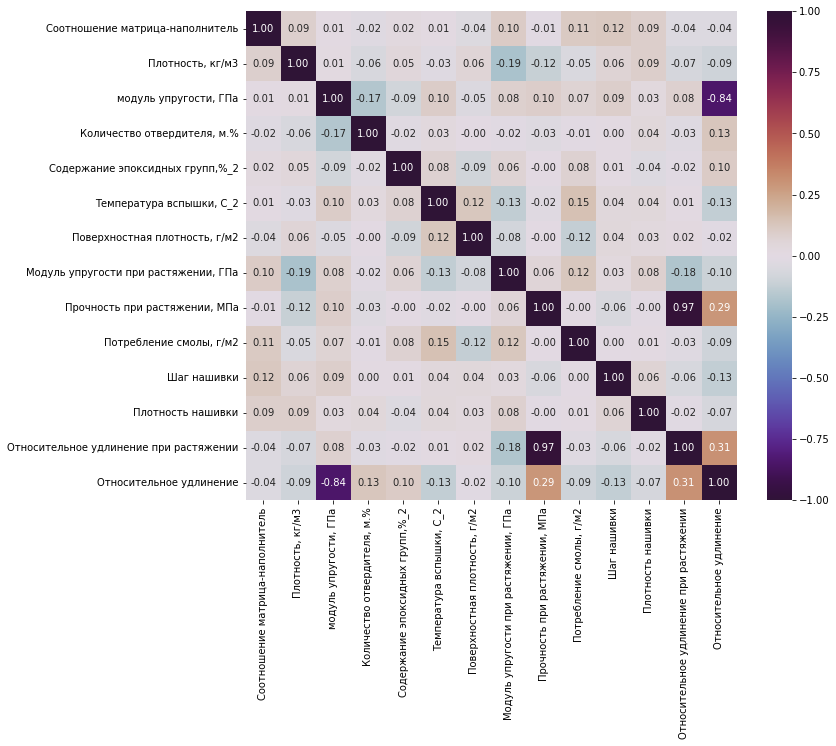

In [202]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[215:429].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [203]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[215:429].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[215:429].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][215:429], df_dnorm[col1][215:429]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель














2
Плотность, кг/м3






Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.191, p-value=0.005







3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=-0.166, p-value=0.015










Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.845, p-value=0.000

4
Количество отвердителя, м.%











5
Содержание эпоксидных групп,%_2










6
Температура вспышки, С_2




Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Потребление смолы, г/м2 : 		 
Statistics=0.148, p-value=0.031





7
Поверхностная плотность, г/м2








8
Модуль упругости при растяжении, ГПа





Наименование колонок и строк С корреляцией: 
Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : 	

Выводы: статистически значимыми по критерию Пирсона после очистки для 2-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:
    
    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000 
    
    
или:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016


Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000 

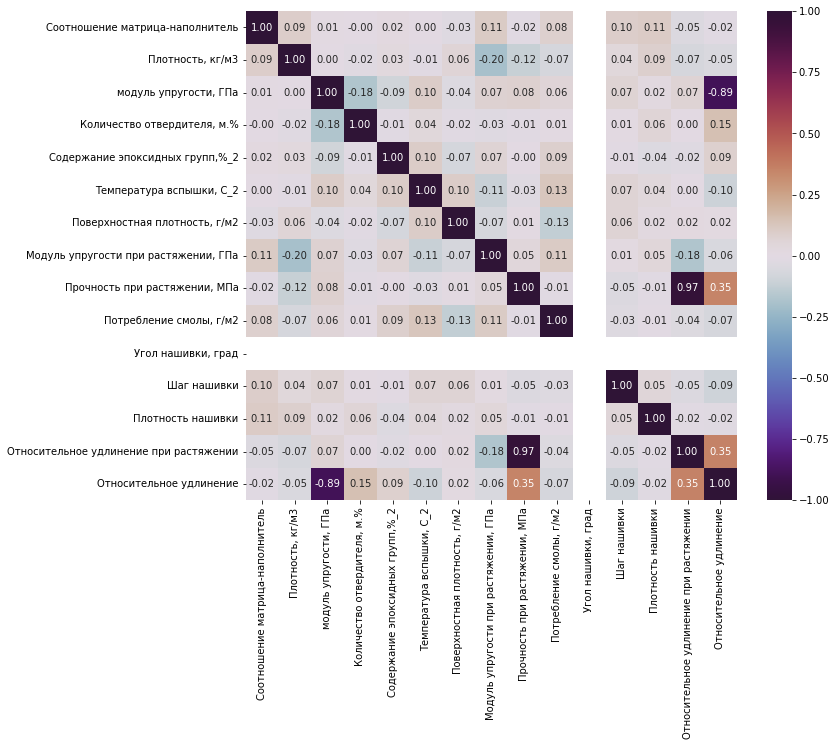

In [204]:
# Матрица корреляции по Спирмену
df2 = df_norm[215:429]
corr = df2.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [205]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[215:429].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[215:429].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[215:429][col], df_norm[215:429][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3






Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.196, p-value=0.004



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=-0.176, p-value=0.010







Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.887, p-value=0.000

4
Количество отвердителя, м.%







Наименование колонок и строк С корреляцией: 
Количес

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:4484: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


Вывод: в 2-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : Statistics=-0.196, p-value=0.004 
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=-0.176, p-value=0.010
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.887, p-value=0.000
    Количество отвердителя, м.%  &  Относительное удлинение : Statistics=0.151, p-value=0.027
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.175, p-value=0.010
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.969, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.350, p-value=0.000
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.354, p-value=0.000   

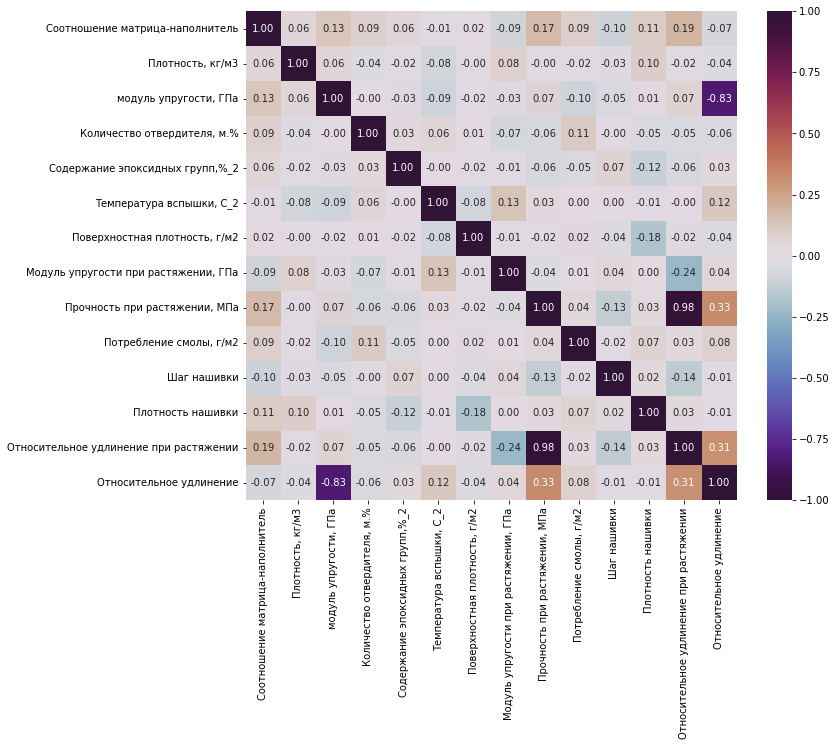

In [206]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[430:644].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [207]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[430:644].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[430:644].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][430:644], df_dnorm[col1][430:644]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель








Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : 		 
Statistics=0.170, p-value=0.013




Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : 		 
Statistics=0.186, p-value=0.006


2
Плотность, кг/м3













3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.830, p-value=0.000

4
Количество отвердителя, м.%











5
Содержание эпоксидных групп,%_2










6
Температура вспышки, С_2


Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=0.134, p-value=0.050







7
Поверхностная плотность, г/м2





Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Плотность нашивки : 		 
Statistics=-0.179, p-value=0.009

Выводы: статистически значимыми по критерию Пирсона после очистки для 3-ьей четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=0.170, p-value=0.013
    Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : Statistics=0.186, p-value=0.006
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.830, p-value=0.000
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.134, p-value=0.050
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.179, p-value=0.009
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.239, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.979, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.330, p-value=0.000
    Шаг нашивки  &  Относительное удлинение при растяжении : Statistics=-0.138, p-value=0.044
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.313, p-value=0.000
    
    или:
    
    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=0.170, p-value=0.013
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.134, p-value=0.050
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.179, p-value=0.009    

Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000             

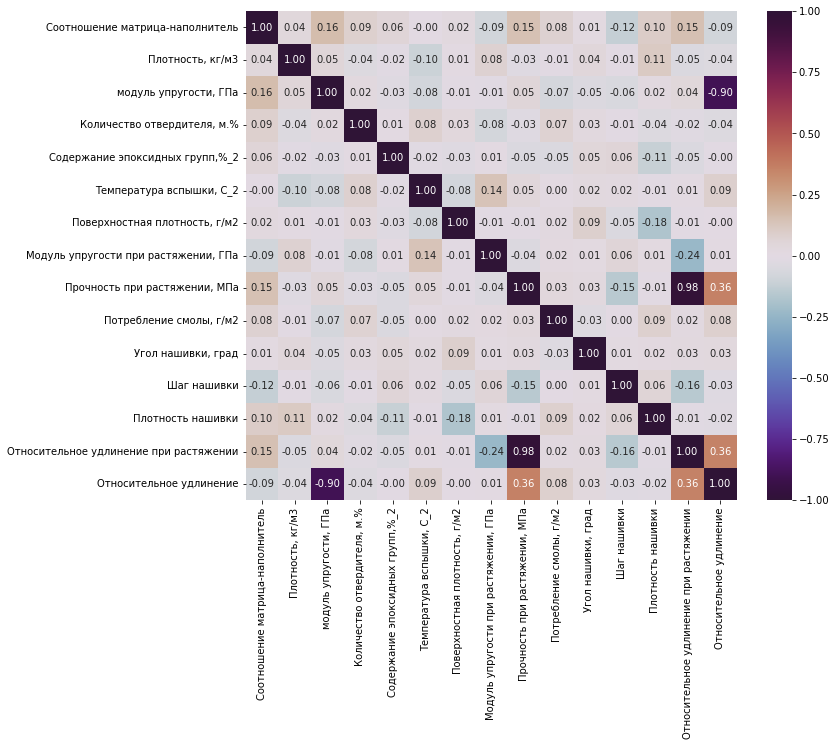

In [208]:
# Матрица корреляции по Спирмену
df3 = df_norm[430:644]
corr = df3.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [209]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[430:644].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[430:644].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[430:644][col], df_norm[430:644][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  модуль упругости, ГПа : 		 
Statistics=0.162, p-value=0.018






Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : 		 
Statistics=0.146, p-value=0.033





Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : 		 
Statistics=0.150, p-value=0.028


2
Плотность, кг/м3














3
модуль упругости, ГПа












Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.896, p-value=0.000

4
Количество отвердителя, м.%












5
Содержание эпоксидных групп,%_2











6
Температура вспышки, С_2


Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=0.139, p-value=0.043








7
Поверхностная плотность

Вывод: в 3-ьей части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  модуль упругости, ГПа : Statistics=0.162, p-value=0.018
    Соотношение матрица-наполнитель  &  Прочность при растяжении, МПа : Statistics=0.146, p-value=0.033
    Соотношение матрица-наполнитель  &  Относительное удлинение при растяжении : Statistics=0.150, p-value=0.028
    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.896, p-value=0.000
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.139, p-value=0.043
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.179, p-value=0.008
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.236, p-value=0.000
    Прочность при растяжении, МПа  &  Шаг нашивки : Statistics=-0.150, p-value=0.029
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.976, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.357, p-value=0.000
    Шаг нашивки  &  Относительное удлинение при растяжении : Statistics=-0.155, p-value=0.023
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.356, p-value=0.000

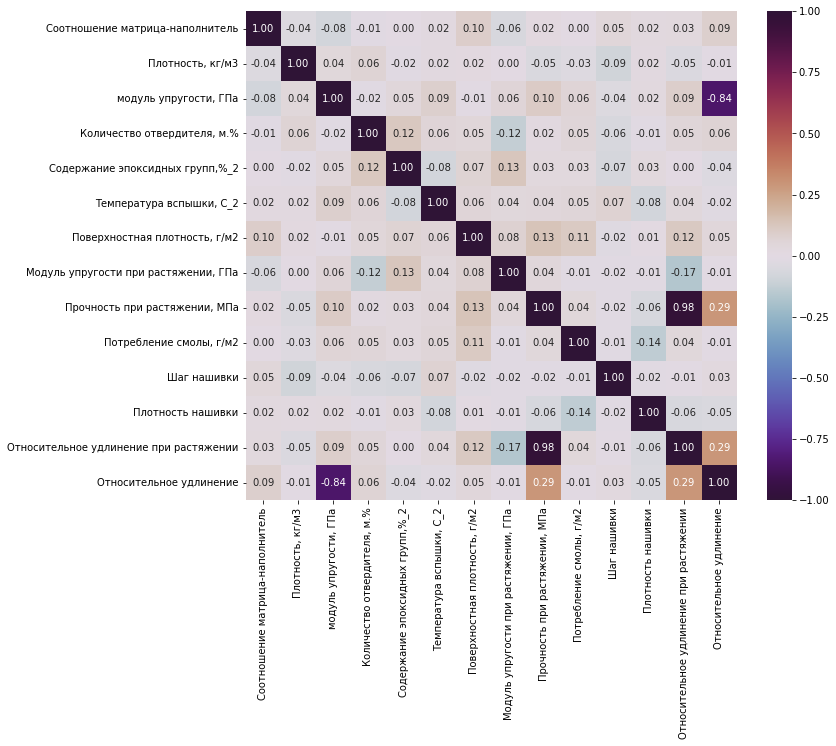

In [210]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[645:857].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [211]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[645:857].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[645:857].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][645:857], df_dnorm[col1][645:857]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель














2
Плотность, кг/м3













3
модуль упругости, ГПа











Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.845, p-value=0.000

4
Количество отвердителя, м.%











5
Содержание эпоксидных групп,%_2










6
Температура вспышки, С_2









7
Поверхностная плотность, г/м2








8
Модуль упругости при растяжении, ГПа





Наименование колонок и строк С корреляцией: 
Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : 		 
Statistics=-0.168, p-value=0.015


9
Прочность при растяжении, МПа




Наименование колонок и строк С корреляцией: 
Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : 		 
Statistics=0.977, p-value=0.000

Наименование колонок и строк С корреляцией: 
Прочность при растяжении, МПа  &  Относительное удлинение : 		 
Statistics=0.293, p-value=0.000

10
Потребление смолы, г/м2


Наименование к

Выводы: статистически значимыми по критерию Пирсона после очистки для 4-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.845, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.168, p-value=0.015
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.977, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.293, p-value=0.000
    Потребление смолы, г/м2  &  Плотность нашивки : Statistics=-0.135, p-value=0.049
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.292, p-value=0.000


или:

    Потребление смолы, г/м2  &  Плотность нашивки : Statistics=-0.135, p-value=0.049
    
    

Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Плотность, кг/м3  &  Относительное удлинение при растяжении : 		 Statistics=-0.062, p-value=0.046
    модуль упругости, ГПа  &  Относительное удлинение : 		 Statistics=-0.223, p-value=0.000
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении :  Statistics=-0.216, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении :  Statistics=0.977, p-value=0.000             

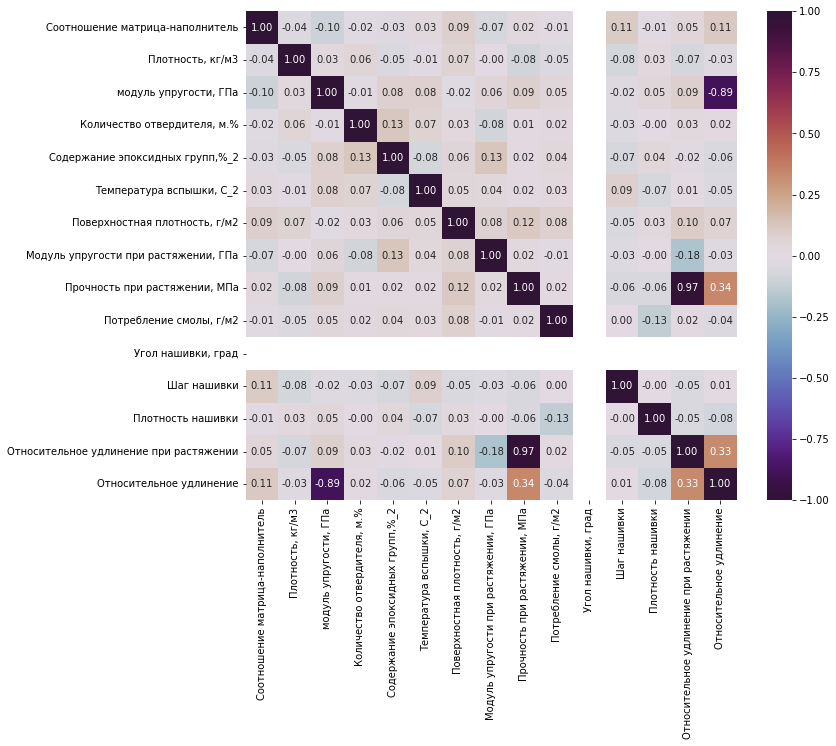

In [212]:
# Матрица корреляции по Спирмену
df4 = df_norm[645:857]
corr = df4.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [213]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[645:857].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[645:857].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[645:857][col], df_norm[645:857][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





2
Плотность, кг/м3









Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





3
модуль упругости, ГПа








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan




Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Относительное удлинение : 		 
Statistics=-0.885, p-value=0.000

4
Количество отвердителя, м.%







Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





5
Содержание эпоксидных групп,%_2






Наименование колонок и строк С корреляцией: 
Содержание эпоксидных групп,%_2  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan





6
Температура вспы

Вывод: в 4-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    модуль упругости, ГПа  &  Относительное удлинение : Statistics=-0.885, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Относительное удлинение при растяжении : Statistics=-0.183, p-value=0.008
    Прочность при растяжении, МПа  &  Относительное удлинение при растяжении : Statistics=0.971, p-value=0.000
    Прочность при растяжении, МПа  &  Относительное удлинение : Statistics=0.341, p-value=0.000
    Относительное удлинение при растяжении  &  Относительное удлинение : Statistics=0.331, p-value=0.000

ОБЩИЙ ВЫВОД ПО КОРРЕЛЯЦИИ ДАТАСЕТА, РАЗБИТОГО НА 4 РАВНЫЕ ЧАСТИ: для 1-ой части датасета произошло заметное изменение значимости параметров, а также увеличение некоторых коэффициентов корреляции в корреляционной матрице, отсюда можно сделать вывод, что, вероятно, в 1-ой четверти датасета находится статистически значимая часть датасета

ОБЩИЙ ВЫВОД ПО ПРЕДВАРИТЕЛЬНОЙ ОБРАБОТКЕ ДАТАСЕТА: Данные датасета представляют собой в значительной мере случайные числа с нормальным распределением, кроме значений углов нашивки в 'Угол нашивки, град'. Статистически отличаются от нормального распределения параметры 'модуль упругости, ГПа', 'Поверхностная плотность' и 'Плотность нашивки'.

Не удалось выяснить в общем датасете также заметные связи между данными из двух разных файлов 'X_bp.xlsx' и 'X_nup.xlsx'. Соответствие между данными из этих двух файлов вероятно является произвольным.

Показатель R-квадрат рассмотренных линейных моделей регрессии без учета расчетных параметров 'Относительное удлинение при растяжении' и 'Относительное удлинение' максимально имеет величину не более 0,03, что указывает на низкое качество моделей, которые выдают результат близкий к средним значениям.

Вероятно последовательности 'Прочность при растяжении, МПа' и 'Модуль упругости при растяжении, ГПа' в значительной степени включают в себя данные сгенерированные таким образом, что обе компоненты имеют нормальное распределение с увязанными между собой математическим ожиданием и стандартным отклонением.

Был сделан ОБЩИЙ ВЫВОД, что данные включают в себя значительное количество сгенерированных чисел с нормальным распределением